## Juan Carlos Benavides

In [10]:
import simpy
import random
import matplotlib.pyplot as pp
import numpy as np
import pandas as pd
import numpy as np
from datetime import datetime,timedelta
from sklearn.metrics import mean_squared_error
from scipy.optimize import curve_fit
from scipy.optimize import fsolve
from sklearn import linear_model
import matplotlib.pyplot as plt

%matplotlib inline

url = 'Casos covid por provincias.xlsx'

df = pd.read_excel(url)
fecha_inicio="16/3/2020"
provincia_df=df[df['Provincia'] == "Bolivar"]
infectados=provincia_df.iloc[0].loc[fecha_inicio:]
provincia_df

,Provincia,16/3/2020,17/3/2020,18/3/2020,19/3/2020,20/3/2020,21/3/2020,22/3/2020,23/3/2020,24/3/2020,...,13/4/2020,14/4/2020,15/4/2020,16/4/2020,17/4/2020,18/4/2020,19/4/2020,20/4/2020,21/04/2020,22/04/2020
1,Bolivar,0.0,0.0,2.0,2.0,4.0,5.0,8.0,9.0,9.0,...,33,33,33,39,39,45,49,54,55,59


In [2]:
tasa_crecimiento=np.mean(infectados)
tasa_crecimiento

23.763157894736842

In [9]:
%matplotlib inline


hospitales = 2
hcamaA = 78
hcamaB = 122
hcamaIntensivA = 100
hcamaIntensivB = 200
hpersonalA = 23
hpersonalB = 33
hequiposA = 28 
hpersonalB = 38 
infected = 100
#multiplicamos la tasa de crecimiento
tcrecimiento = 211*3
diashosp = 10
diashosp_intensivo = 5
dias_Atencion_Personal = 6
dias_uso_equipo = 4
dias_simulacion = 100
costo_persona = 800


#Diccionarios
persona_recuperadas={}
persona_fallecidas={}
ninos={}
adultos={}
tedad={}
hombres={}
mujeres={}
hombres_sintomas={}
hombres_neumonia={}
hombres_intensivo={}
hombres_recuperados={}
hombres_fallecidos={}
mujeres_sintomas={}
mujeres_neumonia={}
mujeres_intensivo={}
mujeres_recuperados={}
mujeres_fallecidos={}
ninos_sintomas={}
ninos_neumonia={}
ninos_intensivo={}
ninos_recuperados={}
ninos__fallecidos={}
adultos_sintomas={}
adultos_neumonia={}
adultos_intensivo={}
adultos_recuperados={}
adultos__fallecidos={}
testado_sintomas={}
testado_neumonia={}
testado_intensivo={}
testado_recuperados={}
testado__fallecidos={}
pacientes_atendidos_equipos=[]
pacientes_atendidos_camas=[]
pacientes_atendidos_personal=[]

class Hospital(object):
    #constructor
    def __init__(self, env, num_cama,num_cama_inten,num_personal,num_equipos, name):
            self.env = env
            self.num_cama = num_cama
            self.num_cama_inten = num_cama_inten
            self.num_personal=num_personal
            self.num_equipos=num_equipos
            self.camas = simpy.Resource(env, num_cama)
            self.camas_inten = simpy.Resource(env, num_cama_inten)
            self.personal = simpy.Resource(env, num_personal)
            self.equipos = simpy.Resource(env, num_equipos)
            self.name = name
            
    def ingresar_neumonia(self, paciente):
        yield self.env.timeout(random.randint(diashosp-5, diashosp+5))
        print("El recibe una cama: ", paciente, " tiempo de salida: ", self.env.now, " hospital ", self.name)
    def uso_personal_paciente(self, paciente):
        yield self.env.timeout(random.randint(dias_Atencion_Personal-3, dias_Atencion_Personal+3))
        print("El paciente atendido: ", paciente, " tiempo de salida: ", self.env.now, " hospital ", self.name)
    def uso_equipo_paciente(self, paciente):
        yield self.env.timeout(random.randint(dias_uso_equipo-1, dias_uso_equipo+1))
        print("El paciente recibe equipos: ", paciente, " tiempo de salida: ", self.env.now, " hospital ", self.name)
    def ingresar_intensivos(self, paciente):
        yield self.env.timeout(random.randint(diashosp_intensivo-2, diashosp_intensivo+2))
        print("El paciente fue cuidados intensivos: ", paciente, " tiempo de salida: ", self.env.now, " hospital ", self.name)

def llegada_paciente(env, hospital, paciente):
    arrive = env.now
    estado = random.randint(1,100)
    if (estado <= 28 and estado > 0):
        ninos[env.now] = ninos[env.now] + 1 if env.now in ninos else  1
        genero = random.randint(1,100)
        if (genero <= 46 ):
            hombres[env.now] = hombres[env.now] + 1 if env.now in hombres else  1
            sintomas = random.randint(1,100)
            if (sintomas<=5):
                ninos_sintomas[env.now] = ninos_sintomas[env.now] + 1 if env.now in ninos_sintomas else  1
                hombres_sintomas[env.now] = hombres_sintomas[env.now] + 1 if env.now in hombres_sintomas else  1
                neumo= random.randint(1,100)
                if(neumo>=75):
                    ninos_neumonia[env.now] = ninos_neumonia[env.now] + 1 if env.now in ninos_neumonia else  1
                    hombres_neumonia[env.now] = hombres_neumonia[env.now] + 1 if env.now in hombres_neumonia else  1
                    with hospital.camas.request() as cama:
                        dias_esperando = random.randint(1,3) #Numero de dias maximo que puede esperar sin ser asignado a una cama dentro del hospital
                        requerimiento = yield cama | env.timeout(dias_esperando) #Asignar un tiempo de espera
                        wait = env.now - arrive
                        if cama in requerimiento:
                            print("Al paciente: ", paciente, " se le asigna una CAMA ", " hospital " , hospital.name)
                            yield env.process(hospital.ingresar_neumonia(paciente))
                            arrive2 = env.now
                            pacientes_atendidos_camas.append(1)
                            with hospital.personal.request() as persona:
                                dias_esperando_personal = random.randint(1,2)
                                requerimiento2 = yield persona | env.timeout(dias_esperando_personal)
                                wait2 = env.now - arrive2
                                if persona in requerimiento2:
                                    print("Al paciente: ", paciente, " recibe atencion del personal ", " hospital " , hospital.name)
                                    yield env.process(hospital.uso_personal_paciente(paciente))
                                    arrive3 = env.now
                                    pacientes_atendidos_personal.append(1)
                                    inten=random.randint(1,100)
                                    if(inten>=25):
                                        ninos_intensivo[env.now] = ninos_intensivo[env.now] + 1 if env.now in ninos_intensivo else  1
                                        hombres_intensivo[env.now] = hombres_intensivo[env.now] + 1 if env.now in hombres_intensivo else  1
                                        with hospital.camas_inten.request() as camas_intens:
                                            dias_esperando_inten = random.randint(1,2)
                                            requerimiento3 = yield camas_intens | env.timeout(dias_esperando_inten)
                                            wait3 = env.now - arrive3
                                            if camas_intens in requerimiento3:
                                                print("Al paciente: ", paciente, " se le asigna una CAMA ", " hospital " , hospital.name)
                                                yield env.process(hospital.ingresar_intensivos(paciente))
                                                arrive4 = env.now
                                                with hospital.equipos.request() as equipo:
                                                    dias_esperando_equipo = random.randint(1,2)
                                                    requerimiento4 = yield equipo | env.timeout(dias_esperando_equipo)
                                                    wait4 = env.now - arrive4
                                                    if equipo in requerimiento4:
                                                        print("Al paciente: ", paciente, " recibe equipos ", " hospital " , hospital.name)
                                                        yield env.process(hospital.uso_equipo_paciente(paciente))
                                                        estado = random.randint(1,100)
                                                        pacientes_atendidos_equipos.append(1)
                                                        final=random.randint(1,100)
                                                        if (final <= 50) :
                                                            persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                            hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                                                            ninos__fallecidos[env.now] = ninos__fallecidos[env.now] + 1 if env.now in ninos__fallecidos else  1
                                                        else:
                                                            persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                                                            hombres_recuperados[env.now] = hombres_recuperados[env.now] + 1 if env.now in hombres_recuperados else 1
                                                            ninos_recuperados[env.now] = ninos_recuperados[env.now] + 1 if env.now in ninos_recuperados else 1
                                                            
                                                    else:
                                                        print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait4 , " dias y fallece no hubo Equipo")
                                                        persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                        hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                                                        ninos__fallecidos[env.now] = ninos__fallecidos[env.now] + 1 if env.now in ninos__fallecidos else  1
                                                
                                            else:
                                                print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait3 , " dias y fallece no hay camas en cuidados intensivos")
                                                persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                                                ninos__fallecidos[env.now] = ninos__fallecidos[env.now] + 1 if env.now in ninos__fallecidos else  1
                                    else:
                                        print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                                        persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                                        hombres_recuperados[env.now] = hombres_recuperados[env.now] + 1 if env.now in hombres_recuperados else 1
                                        ninos_recuperados[env.now] = ninos_recuperados[env.now] + 1 if env.now in ninos_recuperados else 1

                                else:
                                    print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait2 , " dias y fallece no hubo personal")
                                    persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                    hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                                    ninos__fallecidos[env.now] = ninos__fallecidos[env.now] + 1 if env.now in ninos__fallecidos else  1

                        else:
                            print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait , " dias y fallece no hay camas")
                            persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                            hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                            ninos__fallecidos[env.now] = ninos__fallecidos[env.now] + 1 if env.now in ninos__fallecidos else  1
                else:
                    print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                    persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                    hombres_recuperados[env.now] = hombres_recuperados[env.now] + 1 if env.now in hombres_recuperados else 1
                    ninos_recuperados[env.now] = ninos_recuperados[env.now] + 1 if env.now in ninos_recuperados else 1
                        
                
            else:
                print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                hombres_recuperados[env.now] = hombres_recuperados[env.now] + 1 if env.now in hombres_recuperados else 1
                ninos_recuperados[env.now] = ninos_recuperados[env.now] + 1 if env.now in ninos_recuperados else 1
                
        else:
            mujeres[env.now] = mujeres[env.now] + 1 if env.now in mujeres else  1
            sintomas = random.randint(1,100)
            if (sintomas<=5):
                ninos_sintomas[env.now] = ninos_sintomas[env.now] + 1 if env.now in ninos_sintomas else  1
                mujeres_sintomas[env.now] = mujeres_sintomas[env.now] + 1 if env.now in mujeres_sintomas else  1
                neumo= random.randint(1,100)
                if(neumo>=75):
                    ninos_neumonia[env.now] = ninos_neumonia[env.now] + 1 if env.now in ninos_neumonia else  1
                    mujeres_neumonia[env.now] = mujeres_neumonia[env.now] + 1 if env.now in mujeres_neumonia else  1
                    with hospital.camas.request() as cama:
                        dias_esperando = random.randint(1,3) #Numero de dias maximo que puede esperar sin ser asignado a una cama dentro del hospital
                        requerimiento = yield cama | env.timeout(dias_esperando) #Asignar un tiempo de espera
                        wait = env.now - arrive
                        if cama in requerimiento:
                            print("Al paciente: ", paciente, " se le asigna una CAMA ", " hospital " , hospital.name)
                            yield env.process(hospital.ingresar_neumonia(paciente))
                            arrive2 = env.now
                            pacientes_atendidos_camas.append(1)
                            with hospital.personal.request() as persona:
                                dias_esperando_personal = random.randint(1,2)
                                requerimiento2 = yield persona | env.timeout(dias_esperando_personal)
                                wait2 = env.now - arrive2
                                if persona in requerimiento2:
                                    print("Al paciente: ", paciente, " recibe atencion del personal ", " hospital " , hospital.name)
                                    yield env.process(hospital.uso_personal_paciente(paciente))
                                    arrive3 = env.now
                                    pacientes_atendidos_personal.append(1)
                                    inten=random.randint(1,100)
                                    if(inten>=25):
                                        ninos_intensivo[env.now] = ninos_intensivo[env.now] + 1 if env.now in ninos_intensivo else  1
                                        mujeres_intensivo[env.now] = mujeres_intensivo[env.now] + 1 if env.now in mujeres_intensivo else  1
                                        with hospital.camas_inten.request() as camas_intens:
                                            dias_esperando_inten = random.randint(1,2)
                                            requerimiento3 = yield camas_intens | env.timeout(dias_esperando_inten)
                                            wait3 = env.now - arrive3
                                            if camas_intens in requerimiento3:
                                                print("Al paciente: ", paciente, " se le asigna una CAMA ", " hospital " , hospital.name)
                                                yield env.process(hospital.ingresar_intensivos(paciente))
                                                arrive4 = env.now
                                                with hospital.equipos.request() as equipo:
                                                    dias_esperando_equipo = random.randint(1,2)
                                                    requerimiento4 = yield equipo | env.timeout(dias_esperando_equipo)
                                                    wait4 = env.now - arrive4
                                                    if equipo in requerimiento4:
                                                        print("Al paciente: ", paciente, " recibe equipos ", " hospital " , hospital.name)
                                                        yield env.process(hospital.uso_equipo_paciente(paciente))
                                                        estado = random.randint(1,100)
                                                        pacientes_atendidos_equipos.append(1)
                                                        final=random.randint(1,100)
                                                        if (final <= 50) :
                                                            persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                            mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                                                            ninos__fallecidos[env.now] = ninos__fallecidos[env.now] + 1 if env.now in ninos__fallecidos else  1
                                                        else:
                                                            persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                                                            mujeres_recuperados[env.now] = mujeres_recuperados[env.now] + 1 if env.now in mujeres_recuperados else 1
                                                            ninos_recuperados[env.now] = ninos_recuperados[env.now] + 1 if env.now in ninos_recuperados else 1
                                                            
                                                    else:
                                                        print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait4 , " dias y fallece no hubo Equipo")
                                                        persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                        mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                                                        ninos__fallecidos[env.now] = ninos__fallecidos[env.now] + 1 if env.now in ninos__fallecidos else  1
                                                
                                            else:
                                                print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait3 , " dias y fallece no hay camas en cuidados intensivos")
                                                persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                                                ninos__fallecidos[env.now] = ninos__fallecidos[env.now] + 1 if env.now in ninos__fallecidos else  1
                                    else:
                                        print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                                        persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                                        mujeres_recuperados[env.now] = mujeres_recuperados[env.now] + 1 if env.now in mujeres_recuperados else 1
                                        ninos_recuperados[env.now] = ninos_recuperados[env.now] + 1 if env.now in ninos_recuperados else 1
   
                                else:
                                    print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait2 , " dias y fallece no hubo personal")
                                    persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                    mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                                    ninos__fallecidos[env.now] = ninos__fallecidos[env.now] + 1 if env.now in ninos__fallecidos else  1

                        else:
                            print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait , " dias y fallece no hay camas")
                            persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                            mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                            ninos__fallecidos[env.now] = ninos__fallecidos[env.now] + 1 if env.now in ninos__fallecidos else  1
                else:
                    print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                    persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                    mujeres_recuperados[env.now] = mujeres_recuperados[env.now] + 1 if env.now in mujeres_recuperados else 1
                    ninos_recuperados[env.now] = ninos_recuperados[env.now] + 1 if env.now in ninos_recuperados else 1
 
            else:
                print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                mujeres_recuperados[env.now] = mujeres_recuperados[env.now] + 1 if env.now in mujeres_recuperados else 1
                ninos_recuperados[env.now] = ninos_recuperados[env.now] + 1 if env.now in ninos_recuperados else 1
            


#------------------------------------->



    if (estado <= 93 and estado >= 29):
        adultos[env.now] = adultos[env.now] + 1 if env.now in adultos else  1
        genero = random.randint(1,100)
        if (genero <= 54 ):
            hombres[env.now] = hombres[env.now] + 1 if env.now in hombres else  1
            sintomas = 100
            if (sintomas==100):
                adultos_sintomas[env.now] = adultos_sintomas[env.now] + 1 if env.now in adultos_sintomas else  1
                hombres_sintomas[env.now] = hombres_sintomas[env.now] + 1 if env.now in hombres_sintomas else  1
                neumo= random.randint(1,100)
                if(neumo>=75):
                    adultos_neumonia[env.now] = adultos_neumonia[env.now] + 1 if env.now in adultos_neumonia else  1
                    hombres_neumonia[env.now] = hombres_neumonia[env.now] + 1 if env.now in hombres_neumonia else  1
                    with hospital.camas.request() as cama:
                        dias_esperando = random.randint(1,3) #Numero de dias maximo que puede esperar sin ser asignado a una cama dentro del hospital
                        requerimiento = yield cama | env.timeout(dias_esperando) #Asignar un tiempo de espera
                        wait = env.now - arrive
                        if cama in requerimiento:
                            print("Al paciente: ", paciente, " se le asigna una CAMA ", " hospital " , hospital.name)
                            yield env.process(hospital.ingresar_neumonia(paciente))
                            arrive2 = env.now
                            pacientes_atendidos_camas.append(1)
                            with hospital.personal.request() as persona:
                                dias_esperando_personal = random.randint(1,2)
                                requerimiento2 = yield persona | env.timeout(dias_esperando_personal)
                                wait2 = env.now - arrive2
                                if persona in requerimiento2:
                                    print("Al paciente: ", paciente, " recibe atencion del personal ", " hospital " , hospital.name)
                                    yield env.process(hospital.uso_personal_paciente(paciente))
                                    arrive3 = env.now
                                    pacientes_atendidos_personal.append(1)
                                    inten=random.randint(1,100)
                                    if(inten>=25):
                                        adultos_intensivo[env.now] = adultos_intensivo[env.now] + 1 if env.now in adultos_intensivo else  1
                                        hombres_intensivo[env.now] = hombres_intensivo[env.now] + 1 if env.now in hombres_intensivo else  1
                                        with hospital.camas_inten.request() as camas_intens:
                                            dias_esperando_inten = random.randint(1,2)
                                            requerimiento3 = yield camas_intens | env.timeout(dias_esperando_inten)
                                            wait3 = env.now - arrive3
                                            if camas_intens in requerimiento3:
                                                print("Al paciente: ", paciente, " se le asigna una CAMA ", " hospital " , hospital.name)
                                                yield env.process(hospital.ingresar_intensivos(paciente))
                                                arrive4 = env.now
                                                with hospital.equipos.request() as equipo:
                                                    dias_esperando_equipo = random.randint(1,2)
                                                    requerimiento4 = yield equipo | env.timeout(dias_esperando_equipo)
                                                    wait4 = env.now - arrive4
                                                    if equipo in requerimiento4:
                                                        print("Al paciente: ", paciente, " recibe equipos ", " hospital " , hospital.name)
                                                        yield env.process(hospital.uso_equipo_paciente(paciente))
                                                        estado = random.randint(1,100)
                                                        pacientes_atendidos_equipos.append(1)
                                                        final=random.randint(1,100)
                                                        if (final <= 50) :
                                                            persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                            hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                                                            adultos__fallecidos[env.now] = adultos__fallecidos[env.now] + 1 if env.now in adultos__fallecidos else  1
                                                        else:
                                                            persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                                                            hombres_recuperados[env.now] = hombres_recuperados[env.now] + 1 if env.now in hombres_recuperados else 1
                                                            adultos_recuperados[env.now] = adultos_recuperados[env.now] + 1 if env.now in adultos_recuperados else 1
                                                            
                                                    else:
                                                        print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait4 , " dias y fallece no hubo Equipo")
                                                        persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                        hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                                                        adultos__fallecidos[env.now] = adultos__fallecidos[env.now] + 1 if env.now in adultos__fallecidos else  1
                                                
                                            else:
                                                print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait3 , " dias y fallece no hay camas en cuidados intensivos")
                                                persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                                                adultos__fallecidos[env.now] = adultos__fallecidos[env.now] + 1 if env.now in adultos__fallecidos else  1
                                    else:
                                        print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                                        persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                                        hombres_recuperados[env.now] = hombres_recuperados[env.now] + 1 if env.now in hombres_recuperados else 1
                                        adultos_recuperados[env.now] = adultos_recuperados[env.now] + 1 if env.now in adultos_recuperados else 1
   
                                else:
                                    print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait2 , " dias y fallece no hubo personal")
                                    persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                    hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                                    adultos__fallecidos[env.now] = adultos__fallecidos[env.now] + 1 if env.now in adultos__fallecidos else  1

                        else:
                            print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait , " dias y fallece no hay camas")
                            persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                            hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                            adultos__fallecidos[env.now] = adultos__fallecidos[env.now] + 1 if env.now in adultos__fallecidos else  1
                else:
                    print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                    persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                    hombres_recuperados[env.now] = hombres_recuperados[env.now] + 1 if env.now in hombres_recuperados else 1
                    adultos_recuperados[env.now] = adultos_recuperados[env.now] + 1 if env.now in adultos_recuperados else 1
                        
                
            else:
                print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                hombres_recuperados[env.now] = hombres_recuperados[env.now] + 1 if env.now in hombres_recuperados else 1
                adultos_recuperados[env.now] = adultos_recuperados[env.now] + 1 if env.now in adultos_recuperados else 1

        
        else:
            mujeres[env.now] = mujeres[env.now] + 1 if env.now in mujeres else  1
            sintomas = 100
            if (sintomas==100):
                adultos_sintomas[env.now] = adultos_sintomas[env.now] + 1 if env.now in adultos_sintomas else  1
                mujeres_sintomas[env.now] = mujeres_sintomas[env.now] + 1 if env.now in mujeres_sintomas else  1
                neumo= random.randint(1,100)
                if(neumo>=75):
                    adultos_neumonia[env.now] = adultos_neumonia[env.now] + 1 if env.now in adultos_neumonia else  1
                    mujeres_neumonia[env.now] = mujeres_neumonia[env.now] + 1 if env.now in mujeres_neumonia else  1
                    with hospital.camas.request() as cama:
                        dias_esperando = random.randint(1,3) #Numero de dias maximo que puede esperar sin ser asignado a una cama dentro del hospital
                        requerimiento = yield cama | env.timeout(dias_esperando) #Asignar un tiempo de espera
                        wait = env.now - arrive
                        if cama in requerimiento:
                            print("Al paciente: ", paciente, " se le asigna una CAMA ", " hospital " , hospital.name)
                            yield env.process(hospital.ingresar_neumonia(paciente))
                            arrive2 = env.now
                            pacientes_atendidos_camas.append(1)
                            with hospital.personal.request() as persona:
                                dias_esperando_personal = random.randint(1,2)
                                requerimiento2 = yield persona | env.timeout(dias_esperando_personal)
                                wait2 = env.now - arrive2
                                if persona in requerimiento2:
                                    print("Al paciente: ", paciente, " recibe atencion del personal ", " hospital " , hospital.name)
                                    yield env.process(hospital.uso_personal_paciente(paciente))
                                    arrive3 = env.now
                                    pacientes_atendidos_personal.append(1)
                                    inten=random.randint(1,100)
                                    if(inten>=25):
                                        adultos_intensivo[env.now] = adultos_intensivo[env.now] + 1 if env.now in adultos_intensivo else  1
                                        mujeres_intensivo[env.now] = mujeres_intensivo[env.now] + 1 if env.now in mujeres_intensivo else  1
                                        with hospital.camas_inten.request() as camas_intens:
                                            dias_esperando_inten = random.randint(1,2)
                                            requerimiento3 = yield camas_intens | env.timeout(dias_esperando_inten)
                                            wait3 = env.now - arrive3
                                            if camas_intens in requerimiento3:
                                                print("Al paciente: ", paciente, " se le asigna una CAMA ", " hospital " , hospital.name)
                                                yield env.process(hospital.ingresar_intensivos(paciente))
                                                arrive4 = env.now
                                                with hospital.equipos.request() as equipo:
                                                    dias_esperando_equipo = random.randint(1,2)
                                                    requerimiento4 = yield equipo | env.timeout(dias_esperando_equipo)
                                                    wait4 = env.now - arrive4
                                                    if equipo in requerimiento4:
                                                        print("Al paciente: ", paciente, " recibe equipos ", " hospital " , hospital.name)
                                                        yield env.process(hospital.uso_equipo_paciente(paciente))
                                                        estado = random.randint(1,100)
                                                        pacientes_atendidos_equipos.append(1)
                                                        final=random.randint(1,100)
                                                        if (final <= 50) :
                                                            persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                            mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                                                            adultos__fallecidos[env.now] = adultos__fallecidos[env.now] + 1 if env.now in adultos__fallecidos else  1
                                                        else:
                                                            persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                                                            mujeres_recuperados[env.now] = mujeres_recuperados[env.now] + 1 if env.now in mujeres_recuperados else 1
                                                            adultos_recuperados[env.now] = adultos_recuperados[env.now] + 1 if env.now in adultos_recuperados else 1
                                                            
                                                    else:
                                                        print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait4 , " dias y fallece no hubo Equipo")
                                                        persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                        mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                                                        adultos__fallecidos[env.now] = adultos__fallecidos[env.now] + 1 if env.now in adultos__fallecidos else  1
                                                
                                            else:
                                                print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait3 , " dias y fallece no hay camas en cuidados intensivos")
                                                persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                                                adultos__fallecidos[env.now] = adultos__fallecidos[env.now] + 1 if env.now in adultos__fallecidos else  1
                                    else:
                                        print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                                        persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                                        mujeres_recuperados[env.now] = mujeres_recuperados[env.now] + 1 if env.now in mujeres_recuperados else 1
                                        adultos_recuperados[env.now] = adultos_recuperados[env.now] + 1 if env.now in adultos_recuperados else 1
                                        

                                else:
                                    print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait2 , " dias y fallece no hubo personal")
                                    persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                    mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                                    adultos__fallecidos[env.now] = adultos__fallecidos[env.now] + 1 if env.now in adultos__fallecidos else  1

                        else:
                            print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait , " dias y fallece no hay camas")
                            persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                            mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                            adultos__fallecidos[env.now] = adultos__fallecidos[env.now] + 1 if env.now in adultos__fallecidos else  1
                else:
                    print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                    persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                    mujeres_recuperados[env.now] = mujeres_recuperados[env.now] + 1 if env.now in mujeres_recuperados else 1
                    adultos_recuperados[env.now] = adultos_recuperados[env.now] + 1 if env.now in adultos_recuperados else 1

            
            else:
                print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                mujeres_recuperados[env.now] = mujeres_recuperados[env.now] + 1 if env.now in mujeres_recuperados else 1
                adultos_recuperados[env.now] = adultos_recuperados[env.now] + 1 if env.now in adultos_recuperados else 1
            


#------------------------------------->


    
    
    if (estado <= 100 and estado >= 94):
        tedad[env.now] = tedad[env.now] + 1 if env.now in tedad else  1
        genero = random.randint(1,100)
        if (genero <= 57 ):
            hombres[env.now] = hombres[env.now] + 1 if env.now in hombres else  1
            sintomas = 100
            if (sintomas==100):
                testado_sintomas[env.now] = testado_sintomas[env.now] + 1 if env.now in testado_sintomas else  1
                hombres_sintomas[env.now] = hombres_sintomas[env.now] + 1 if env.now in hombres_sintomas else  1
                neumo= random.randint(1,100)
                if(neumo>=95):
                    testado_neumonia[env.now] = testado_neumonia[env.now] + 1 if env.now in testado_neumonia else  1
                    hombres_neumonia[env.now] = hombres_neumonia[env.now] + 1 if env.now in hombres_neumonia else  1
                    with hospital.camas.request() as cama:
                        dias_esperando = random.randint(1,3) #Numero de dias maximo que puede esperar sin ser asignado a una cama dentro del hospital
                        requerimiento = yield cama | env.timeout(dias_esperando) #Asignar un tiempo de espera
                        wait = env.now - arrive
                        if cama in requerimiento:
                            print("Al paciente: ", paciente, " se le asigna una CAMA ", " hospital " , hospital.name)
                            yield env.process(hospital.ingresar_neumonia(paciente))
                            arrive2 = env.now
                            pacientes_atendidos_camas.append(1)
                            with hospital.personal.request() as persona:
                                dias_esperando_personal = random.randint(1,2)
                                requerimiento2 = yield persona | env.timeout(dias_esperando_personal)
                                wait2 = env.now - arrive2
                                if persona in requerimiento2:
                                    print("Al paciente: ", paciente, " recibe atencion del personal ", " hospital " , hospital.name)
                                    yield env.process(hospital.uso_personal_paciente(paciente))
                                    arrive3 = env.now
                                    pacientes_atendidos_personal.append(1)
                                    inten=random.randint(1,100)
                                    if(inten>=25):
                                        testado_intensivo[env.now] = testado_intensivo[env.now] + 1 if env.now in testado_intensivo else  1
                                        hombres_intensivo[env.now] = hombres_intensivo[env.now] + 1 if env.now in hombres_intensivo else  1
                                        with hospital.camas_inten.request() as camas_intens:
                                            dias_esperando_inten = random.randint(1,2)
                                            requerimiento3 = yield camas_intens | env.timeout(dias_esperando_inten)
                                            wait3 = env.now - arrive3
                                            if camas_intens in requerimiento3:
                                                print("Al paciente: ", paciente, " se le asigna una CAMA ", " hospital " , hospital.name)
                                                yield env.process(hospital.ingresar_intensivos(paciente))
                                                arrive4 = env.now
                                                with hospital.equipos.request() as equipo:
                                                    dias_esperando_equipo = random.randint(1,2)
                                                    requerimiento4 = yield equipo | env.timeout(dias_esperando_equipo)
                                                    wait4 = env.now - arrive4
                                                    if equipo in requerimiento4:
                                                        print("Al paciente: ", paciente, " recibe equipos ", " hospital " , hospital.name)
                                                        yield env.process(hospital.uso_equipo_paciente(paciente))
                                                        estado = random.randint(1,100)
                                                        pacientes_atendidos_equipos.append(1)
                                                        final=random.randint(1,100)
                                                        if (final <= 50) :
                                                            persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                            hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                                                            testado__fallecidos[env.now] = testado__fallecidos[env.now] + 1 if env.now in testado__fallecidos else  1
                                                        else:
                                                            persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                                                            hombres_recuperados[env.now] = hombres_recuperados[env.now] + 1 if env.now in hombres_recuperados else 1
                                                            testado_recuperados[env.now] = testado_recuperados[env.now] + 1 if env.now in testado_recuperados else 1
                                                            
                                                    else:
                                                        print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait4 , " dias y fallece no hubo Equipo")
                                                        persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                        hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                                                        testado__fallecidos[env.now] = testado__fallecidos[env.now] + 1 if env.now in testado__fallecidos else  1
                                                
                                            else:
                                                print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait3 , " dias y fallece no hay camas en cuidados intensivos")
                                                persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                                                testado__fallecidos[env.now] = testado__fallecidos[env.now] + 1 if env.now in testado__fallecidos else  1
                                    else:
                                        print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                                        persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                                        hombres_recuperados[env.now] = hombres_recuperados[env.now] + 1 if env.now in hombres_recuperados else 1
                                        testado_recuperados[env.now] = testado_recuperados[env.now] + 1 if env.now in testado_recuperados else 1

                                else:
                                    print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait2 , " dias y fallece no hubo personal")
                                    persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                    hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                                    testado__fallecidos[env.now] = testado__fallecidos[env.now] + 1 if env.now in testado__fallecidos else  1

                        else:
                            print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait , " dias y fallece no hay camas")
                            persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                            hombres_fallecidos[env.now] = hombres_fallecidos[env.now] + 1 if env.now in hombres_fallecidos else  1
                            testado__fallecidos[env.now] = testado__fallecidos[env.now] + 1 if env.now in testado__fallecidos else  1
                else:
                    print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                    persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                    hombres_recuperados[env.now] = hombres_recuperados[env.now] + 1 if env.now in hombres_recuperados else 1
                    testado_recuperados[env.now] = testado_recuperados[env.now] + 1 if env.now in testado_recuperados else 1
                        
                
            else:
                print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                hombres_recuperados[env.now] = hombres_recuperados[env.now] + 1 if env.now in hombres_recuperados else 1
                testado_recuperados[env.now] = testado_recuperados[env.now] + 1 if env.now in testado_recuperados else 1
        
        
        
        
        
        else:
            mujeres[env.now] = mujeres[env.now] + 1 if env.now in mujeres else  1
            sintomas = 100
            if (sintomas==100):
                testado_sintomas[env.now] = testado_sintomas[env.now] + 1 if env.now in testado_sintomas else  1
                mujeres_sintomas[env.now] = mujeres_sintomas[env.now] + 1 if env.now in mujeres_sintomas else  1
                neumo= random.randint(1,100)
                if(neumo>=75):
                    testado_neumonia[env.now] = testado_neumonia[env.now] + 1 if env.now in testado_neumonia else  1
                    mujeres_neumonia[env.now] = mujeres_neumonia[env.now] + 1 if env.now in mujeres_neumonia else  1
                    with hospital.camas.request() as cama:
                        dias_esperando = random.randint(1,3) #Numero de dias maximo que puede esperar sin ser asignado a una cama dentro del hospital
                        requerimiento = yield cama | env.timeout(dias_esperando) #Asignar un tiempo de espera
                        wait = env.now - arrive
                        if cama in requerimiento:
                            print("Al paciente: ", paciente, " se le asigna una CAMA ", " hospital " , hospital.name)
                            yield env.process(hospital.ingresar_neumonia(paciente))
                            arrive2 = env.now
                            pacientes_atendidos_camas.append(1)
                            with hospital.personal.request() as persona:
                                dias_esperando_personal = random.randint(1,2)
                                requerimiento2 = yield persona | env.timeout(dias_esperando_personal)
                                wait2 = env.now - arrive2
                                if persona in requerimiento2:
                                    print("Al paciente: ", paciente, " recibe atencion del personal ", " hospital " , hospital.name)
                                    yield env.process(hospital.uso_personal_paciente(paciente))
                                    arrive3 = env.now
                                    pacientes_atendidos_personal.append(1)
                                    inten=random.randint(1,100)
                                    if(inten>=25):
                                        testado_intensivo[env.now] = testado_intensivo[env.now] + 1 if env.now in testado_intensivo else  1
                                        mujeres_intensivo[env.now] = mujeres_intensivo[env.now] + 1 if env.now in mujeres_intensivo else  1
                                        with hospital.camas_inten.request() as camas_intens:
                                            dias_esperando_inten = random.randint(1,2)
                                            requerimiento3 = yield camas_intens | env.timeout(dias_esperando_inten)
                                            wait3 = env.now - arrive3
                                            if camas_intens in requerimiento3:
                                                print("Al paciente: ", paciente, " se le asigna una CAMA ", " hospital " , hospital.name)
                                                yield env.process(hospital.ingresar_intensivos(paciente))
                                                arrive4 = env.now
                                                with hospital.equipos.request() as equipo:
                                                    dias_esperando_equipo = random.randint(1,2)
                                                    requerimiento4 = yield equipo | env.timeout(dias_esperando_equipo)
                                                    wait4 = env.now - arrive4
                                                    if equipo in requerimiento4:
                                                        print("Al paciente: ", paciente, " recibe equipos ", " hospital " , hospital.name)
                                                        yield env.process(hospital.uso_equipo_paciente(paciente))
                                                        estado = random.randint(1,100)
                                                        pacientes_atendidos_equipos.append(1)
                                                        final=random.randint(1,100)
                                                        if (final <= 50) :
                                                            persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                            mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                                                            testado__fallecidos[env.now] = testado__fallecidos[env.now] + 1 if env.now in testado__fallecidos else  1
                                                        else:
                                                            persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                                                            mujeres_recuperados[env.now] = mujeres_recuperados[env.now] + 1 if env.now in mujeres_recuperados else 1
                                                            testado_recuperados[env.now] = testado_recuperados[env.now] + 1 if env.now in testado_recuperados else 1
                                                            
                                                    else:
                                                        print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait4 , " dias y fallece no hubo Equipo")
                                                        persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                        mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                                                        testado__fallecidos[env.now] = testado__fallecidos[env.now] + 1 if env.now in testado__fallecidos else  1
                                                
                                            else:
                                                print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait3 , " dias y fallece no hay camas en cuidados intensivos")
                                                persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                                mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                                                testado__fallecidos[env.now] = testado__fallecidos[env.now] + 1 if env.now in testado__fallecidos else  1
                                    else:
                                        print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                                        persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                                        mujeres_recuperados[env.now] = mujeres_recuperados[env.now] + 1 if env.now in mujeres_recuperados else 1
                                        testado_recuperados[env.now] = testado_recuperados[env.now] + 1 if env.now in testado_recuperados else 1
       
                                else:
                                    print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait2 , " dias y fallece no hubo personal")
                                    persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                                    mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                                    testado__fallecidos[env.now] = testado__fallecidos[env.now] + 1 if env.now in testado__fallecidos else  1

                        else:
                            print("El paciente " , paciente, " en el hospital ", hospital.name, " espero ", wait , " dias y fallece no hay camas")
                            persona_fallecidas[env.now] = persona_fallecidas[env.now] + 1 if env.now in persona_fallecidas else  1
                            mujeres_fallecidos[env.now] = mujeres_fallecidos[env.now] + 1 if env.now in mujeres_fallecidos else  1
                            testado__fallecidos[env.now] = testado__fallecidos[env.now] + 1 if env.now in testado__fallecidos else  1
                else:
                    print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                    persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                    mujeres_recuperados[env.now] = mujeres_recuperados[env.now] + 1 if env.now in mujeres_recuperados else 1
                    testado_recuperados[env.now] = testado_recuperados[env.now] + 1 if env.now in testado_recuperados else 1

            else:
                print("El paciente " , paciente, " en el hospital ", hospital.name, "recuperado")
                persona_recuperadas[env.now] = persona_recuperadas[env.now] + 1 if env.now in persona_recuperadas else 1
                mujeres_recuperados[env.now] = mujeres_recuperados[env.now] + 1 if env.now in mujeres_recuperados else 1
                testado_recuperados[env.now] = testado_recuperados[env.now] + 1 if env.now in testado_recuperados else 1

def ejecutar(env, tasa_crecimiento, infectados):
    hospitalA = Hospital(env, hcamaA,hcamaIntensivA,hpersonalA,hequiposA, "ALFREDO NOBOA MONTENEGRO")
    hospitalB = Hospital(env, hcamaB,hcamaIntensivB,hpersonalB,hpersonalB, "BASICO DE GUARANDA")
    for i in range(infectados):
        asignar_hospital(env, hospitalA, hospitalB, i)
    paciente = infectados
    while True:
        yield env.timeout(1)
        for i in range(tasa_crecimiento):
            paciente += 1
            asignar_hospital(env, hospitalA, hospitalB, paciente)
                
def asignar_hospital(env, hospitalA, hospitalB, paciente):
    hosp_esc = random.randint(1,2)
    if (hosp_esc == 1):
        print("Llega paciente : ", paciente, " hospital ALFREDO NOBOA MONTENEGRO tiempo ", env.now)
        env.process(llegada_paciente(env, hospitalA, paciente))
    else:
        print("Llega paciente : ", paciente, " hospital BASICO DE GUARANDA tiempo ", env.now)
        env.process(llegada_paciente(env, hospitalB, paciente))
    
print("Hospitales en BOLIVAR")
env=simpy.Environment()
env.process(ejecutar(env,tcrecimiento, infected))
env.run(until=dias_simulacion)



Hospitales en BOLIVAR
Llega paciente :  0  hospital ALFREDO NOBOA MONTENEGRO tiempo  0
Llega paciente :  1  hospital BASICO DE GUARANDA tiempo  0
Llega paciente :  2  hospital BASICO DE GUARANDA tiempo  0
Llega paciente :  3  hospital BASICO DE GUARANDA tiempo  0
Llega paciente :  4  hospital ALFREDO NOBOA MONTENEGRO tiempo  0
Llega paciente :  5  hospital ALFREDO NOBOA MONTENEGRO tiempo  0
Llega paciente :  6  hospital BASICO DE GUARANDA tiempo  0
Llega paciente :  7  hospital ALFREDO NOBOA MONTENEGRO tiempo  0
Llega paciente :  8  hospital BASICO DE GUARANDA tiempo  0
Llega paciente :  9  hospital ALFREDO NOBOA MONTENEGRO tiempo  0
Llega paciente :  10  hospital ALFREDO NOBOA MONTENEGRO tiempo  0
Llega paciente :  11  hospital ALFREDO NOBOA MONTENEGRO tiempo  0
Llega paciente :  12  hospital BASICO DE GUARANDA tiempo  0
Llega paciente :  13  hospital ALFREDO NOBOA MONTENEGRO tiempo  0
Llega paciente :  14  hospital BASICO DE GUARANDA tiempo  0
Llega paciente :  15  hospital ALFREDO N

Llega paciente :  375  hospital BASICO DE GUARANDA tiempo  1
Llega paciente :  376  hospital BASICO DE GUARANDA tiempo  1
Llega paciente :  377  hospital ALFREDO NOBOA MONTENEGRO tiempo  1
Llega paciente :  378  hospital BASICO DE GUARANDA tiempo  1
Llega paciente :  379  hospital BASICO DE GUARANDA tiempo  1
Llega paciente :  380  hospital BASICO DE GUARANDA tiempo  1
Llega paciente :  381  hospital ALFREDO NOBOA MONTENEGRO tiempo  1
Llega paciente :  382  hospital BASICO DE GUARANDA tiempo  1
Llega paciente :  383  hospital BASICO DE GUARANDA tiempo  1
Llega paciente :  384  hospital BASICO DE GUARANDA tiempo  1
Llega paciente :  385  hospital BASICO DE GUARANDA tiempo  1
Llega paciente :  386  hospital ALFREDO NOBOA MONTENEGRO tiempo  1
Llega paciente :  387  hospital BASICO DE GUARANDA tiempo  1
Llega paciente :  388  hospital ALFREDO NOBOA MONTENEGRO tiempo  1
Llega paciente :  389  hospital BASICO DE GUARANDA tiempo  1
Llega paciente :  390  hospital BASICO DE GUARANDA tiempo  1


El paciente  216  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  217  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  218  en el hospital  BASICO DE GUARANDA recuperado
El paciente  219  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  220  en el hospital  BASICO DE GUARANDA recuperado
El paciente  221  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  222  en el hospital  BASICO DE GUARANDA recuperado
El paciente  223  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  224  en el hospital  BASICO DE GUARANDA recuperado
El paciente  225  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  226  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  228  en el hospital  BASICO DE GUARANDA recuperado
El paciente  229  en el hospital  BASICO DE GUARANDA recuperado
El paciente  230  en el hospital  BASICO DE GUARANDA recuperado
El paciente  231  en el hospital  BASICO DE GUARANDA recuperad

El paciente  657  en el hospital  BASICO DE GUARANDA recuperado
El paciente  658  en el hospital  BASICO DE GUARANDA recuperado
El paciente  659  en el hospital  BASICO DE GUARANDA recuperado
El paciente  660  en el hospital  BASICO DE GUARANDA recuperado
El paciente  661  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  662  en el hospital  BASICO DE GUARANDA recuperado
El paciente  663  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  664  en el hospital  BASICO DE GUARANDA recuperado
El paciente  665  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  667  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  668  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  669  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  670  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  671  en el hospital  BASICO DE GUARANDA recuperado
El paciente  672  en el hospital  BASICO DE GUARANDA recuperad

Llega paciente :  1038  hospital ALFREDO NOBOA MONTENEGRO tiempo  2
Llega paciente :  1039  hospital BASICO DE GUARANDA tiempo  2
Llega paciente :  1040  hospital BASICO DE GUARANDA tiempo  2
Llega paciente :  1041  hospital BASICO DE GUARANDA tiempo  2
Llega paciente :  1042  hospital BASICO DE GUARANDA tiempo  2
Llega paciente :  1043  hospital ALFREDO NOBOA MONTENEGRO tiempo  2
Llega paciente :  1044  hospital ALFREDO NOBOA MONTENEGRO tiempo  2
Llega paciente :  1045  hospital BASICO DE GUARANDA tiempo  2
Llega paciente :  1046  hospital BASICO DE GUARANDA tiempo  2
Llega paciente :  1047  hospital ALFREDO NOBOA MONTENEGRO tiempo  2
Llega paciente :  1048  hospital ALFREDO NOBOA MONTENEGRO tiempo  2
Llega paciente :  1049  hospital ALFREDO NOBOA MONTENEGRO tiempo  2
Llega paciente :  1050  hospital BASICO DE GUARANDA tiempo  2
Llega paciente :  1051  hospital ALFREDO NOBOA MONTENEGRO tiempo  2
Llega paciente :  1052  hospital BASICO DE GUARANDA tiempo  2
Llega paciente :  1053  hosp

El paciente  936  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  937  en el hospital  BASICO DE GUARANDA recuperado
El paciente  938  en el hospital  BASICO DE GUARANDA recuperado
El paciente  940  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  942  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  943  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  944  en el hospital  BASICO DE GUARANDA recuperado
El paciente  946  en el hospital  BASICO DE GUARANDA recuperado
El paciente  947  en el hospital  BASICO DE GUARANDA recuperado
El paciente  948  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  949  en el hospital  BASICO DE GUARANDA recuperado
El paciente  951  en el hospital  BASICO DE GUARANDA recuperado
El paciente  952  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  954  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  955  en el hospital  ALFREDO NOBOA MONTENEGRO rec

Al paciente:  1057  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  1060  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  1062  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  1065  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  1077  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  1128  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  1133  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Llega paciente :  1367  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1368  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1369  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1370  hospital ALFREDO NOBOA MONTENEGRO tiempo  3
Llega paciente :  1371  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1372  hospital ALFREDO NOBOA MONTENEGRO tiempo  3
Llega paciente :  1373  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1374  hospital BASICO DE 

Llega paciente :  1785  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1786  hospital ALFREDO NOBOA MONTENEGRO tiempo  3
Llega paciente :  1787  hospital ALFREDO NOBOA MONTENEGRO tiempo  3
Llega paciente :  1788  hospital ALFREDO NOBOA MONTENEGRO tiempo  3
Llega paciente :  1789  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1790  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1791  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1792  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1793  hospital ALFREDO NOBOA MONTENEGRO tiempo  3
Llega paciente :  1794  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1795  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1796  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1797  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1798  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1799  hospital BASICO DE GUARANDA tiempo  3
Llega paciente :  1800  hospital ALFREDO NOBOA

El paciente  1647  en el hospital  BASICO DE GUARANDA recuperado
El paciente  1648  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  1649  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  1650  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  1651  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  1652  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  1653  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  1655  en el hospital  BASICO DE GUARANDA recuperado
El paciente  1656  en el hospital  BASICO DE GUARANDA recuperado
El paciente  1657  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  1658  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  1659  en el hospital  BASICO DE GUARANDA recuperado
El paciente  1660  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  1662  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  1663  en el hospi

Llega paciente :  2052  hospital ALFREDO NOBOA MONTENEGRO tiempo  4
Llega paciente :  2053  hospital ALFREDO NOBOA MONTENEGRO tiempo  4
Llega paciente :  2054  hospital BASICO DE GUARANDA tiempo  4
Llega paciente :  2055  hospital ALFREDO NOBOA MONTENEGRO tiempo  4
Llega paciente :  2056  hospital BASICO DE GUARANDA tiempo  4
Llega paciente :  2057  hospital ALFREDO NOBOA MONTENEGRO tiempo  4
Llega paciente :  2058  hospital BASICO DE GUARANDA tiempo  4
Llega paciente :  2059  hospital ALFREDO NOBOA MONTENEGRO tiempo  4
Llega paciente :  2060  hospital ALFREDO NOBOA MONTENEGRO tiempo  4
Llega paciente :  2061  hospital BASICO DE GUARANDA tiempo  4
Llega paciente :  2062  hospital BASICO DE GUARANDA tiempo  4
Llega paciente :  2063  hospital ALFREDO NOBOA MONTENEGRO tiempo  4
Llega paciente :  2064  hospital ALFREDO NOBOA MONTENEGRO tiempo  4
Llega paciente :  2065  hospital BASICO DE GUARANDA tiempo  4
Llega paciente :  2066  hospital BASICO DE GUARANDA tiempo  4
Llega paciente :  2067

El paciente  2011  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2012  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2014  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2016  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2017  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2018  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2019  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2020  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2022  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2023  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2024  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2025  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2026  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2027  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2028  en el hospital  BASICO DE GUARANDA recupe

El paciente  2469  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2470  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2471  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2472  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2474  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2477  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2478  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2479  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2480  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2481  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2483  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2484  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2485  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2486  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2487  en el hospital  BASICO DE GUA

Llega paciente :  2888  hospital ALFREDO NOBOA MONTENEGRO tiempo  5
Llega paciente :  2889  hospital ALFREDO NOBOA MONTENEGRO tiempo  5
Llega paciente :  2890  hospital ALFREDO NOBOA MONTENEGRO tiempo  5
Llega paciente :  2891  hospital ALFREDO NOBOA MONTENEGRO tiempo  5
Llega paciente :  2892  hospital BASICO DE GUARANDA tiempo  5
Llega paciente :  2893  hospital ALFREDO NOBOA MONTENEGRO tiempo  5
Llega paciente :  2894  hospital ALFREDO NOBOA MONTENEGRO tiempo  5
Llega paciente :  2895  hospital ALFREDO NOBOA MONTENEGRO tiempo  5
Llega paciente :  2896  hospital ALFREDO NOBOA MONTENEGRO tiempo  5
Llega paciente :  2897  hospital ALFREDO NOBOA MONTENEGRO tiempo  5
Llega paciente :  2898  hospital BASICO DE GUARANDA tiempo  5
Llega paciente :  2899  hospital BASICO DE GUARANDA tiempo  5
Llega paciente :  2900  hospital ALFREDO NOBOA MONTENEGRO tiempo  5
Llega paciente :  2901  hospital ALFREDO NOBOA MONTENEGRO tiempo  5
Llega paciente :  2902  hospital BASICO DE GUARANDA tiempo  5
Lleg

El paciente  2761  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2762  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2763  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2767  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2769  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2770  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2771  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2772  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2773  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2774  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2776  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  2777  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2778  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2779  en el hospital  BASICO DE GUARANDA recuperado
El paciente  2780  en el hospital  BASICO DE GUA

El paciente  3169  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3170  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3171  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3172  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3173  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3175  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3176  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3177  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3178  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3180  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3181  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3182  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3183  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3184  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3185  en el hospi

Llega paciente :  3492  hospital BASICO DE GUARANDA tiempo  6
Llega paciente :  3493  hospital ALFREDO NOBOA MONTENEGRO tiempo  6
Llega paciente :  3494  hospital BASICO DE GUARANDA tiempo  6
Llega paciente :  3495  hospital BASICO DE GUARANDA tiempo  6
Llega paciente :  3496  hospital BASICO DE GUARANDA tiempo  6
Llega paciente :  3497  hospital BASICO DE GUARANDA tiempo  6
Llega paciente :  3498  hospital ALFREDO NOBOA MONTENEGRO tiempo  6
Llega paciente :  3499  hospital BASICO DE GUARANDA tiempo  6
Llega paciente :  3500  hospital BASICO DE GUARANDA tiempo  6
Llega paciente :  3501  hospital ALFREDO NOBOA MONTENEGRO tiempo  6
Llega paciente :  3502  hospital ALFREDO NOBOA MONTENEGRO tiempo  6
Llega paciente :  3503  hospital ALFREDO NOBOA MONTENEGRO tiempo  6
Llega paciente :  3504  hospital ALFREDO NOBOA MONTENEGRO tiempo  6
Llega paciente :  3505  hospital ALFREDO NOBOA MONTENEGRO tiempo  6
Llega paciente :  3506  hospital ALFREDO NOBOA MONTENEGRO tiempo  6
Llega paciente :  3507

El paciente  3415  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3416  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3417  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3418  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3419  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3420  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3421  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3422  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3425  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3426  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3427  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3428  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3429  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3430  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3431  en el hospital  BASICO DE GUARANDA 

El paciente  3825  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3826  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3829  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3830  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3831  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3834  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3836  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3837  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3838  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3839  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3840  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3841  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3843  en el hospital  BASICO DE GUARANDA recuperado
El paciente  3844  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  3845  en el hospital  BASICO DE GUARANDA 

Llega paciente :  4142  hospital ALFREDO NOBOA MONTENEGRO tiempo  7
Llega paciente :  4143  hospital BASICO DE GUARANDA tiempo  7
Llega paciente :  4144  hospital ALFREDO NOBOA MONTENEGRO tiempo  7
Llega paciente :  4145  hospital BASICO DE GUARANDA tiempo  7
Llega paciente :  4146  hospital ALFREDO NOBOA MONTENEGRO tiempo  7
Llega paciente :  4147  hospital ALFREDO NOBOA MONTENEGRO tiempo  7
Llega paciente :  4148  hospital BASICO DE GUARANDA tiempo  7
Llega paciente :  4149  hospital BASICO DE GUARANDA tiempo  7
Llega paciente :  4150  hospital BASICO DE GUARANDA tiempo  7
Llega paciente :  4151  hospital BASICO DE GUARANDA tiempo  7
Llega paciente :  4152  hospital ALFREDO NOBOA MONTENEGRO tiempo  7
Llega paciente :  4153  hospital ALFREDO NOBOA MONTENEGRO tiempo  7
Llega paciente :  4154  hospital ALFREDO NOBOA MONTENEGRO tiempo  7
Llega paciente :  4155  hospital ALFREDO NOBOA MONTENEGRO tiempo  7
Llega paciente :  4156  hospital BASICO DE GUARANDA tiempo  7
Llega paciente :  4157

El paciente  4054  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4056  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4057  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4058  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  4059  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4060  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4061  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  4062  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  4063  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  4064  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  4065  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4067  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4068  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  4069  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4070  en el hospital  BASICO DE GUARANDA 

El paciente  2076  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  2081  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  2087  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  2109  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  2128  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  2148  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  2165  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  2186  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  2199  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  2211  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  2226  en el hospital  BASICO 

Llega paciente :  4811  hospital BASICO DE GUARANDA tiempo  8
Llega paciente :  4812  hospital ALFREDO NOBOA MONTENEGRO tiempo  8
Llega paciente :  4813  hospital ALFREDO NOBOA MONTENEGRO tiempo  8
Llega paciente :  4814  hospital BASICO DE GUARANDA tiempo  8
Llega paciente :  4815  hospital ALFREDO NOBOA MONTENEGRO tiempo  8
Llega paciente :  4816  hospital ALFREDO NOBOA MONTENEGRO tiempo  8
Llega paciente :  4817  hospital ALFREDO NOBOA MONTENEGRO tiempo  8
Llega paciente :  4818  hospital ALFREDO NOBOA MONTENEGRO tiempo  8
Llega paciente :  4819  hospital ALFREDO NOBOA MONTENEGRO tiempo  8
Llega paciente :  4820  hospital BASICO DE GUARANDA tiempo  8
Llega paciente :  4821  hospital BASICO DE GUARANDA tiempo  8
Llega paciente :  4822  hospital ALFREDO NOBOA MONTENEGRO tiempo  8
Llega paciente :  4823  hospital BASICO DE GUARANDA tiempo  8
Llega paciente :  4824  hospital BASICO DE GUARANDA tiempo  8
Llega paciente :  4825  hospital ALFREDO NOBOA MONTENEGRO tiempo  8
Llega paciente :

El paciente  4700  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  4701  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  4702  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4704  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  4705  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4706  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4707  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4710  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  4711  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4712  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  4713  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4714  en el hospital  BASICO DE GUARANDA recuperado
El paciente  4715  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  4716  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  4717  en el hospital  BASICO DE GUA

El paciente  3203  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  3218  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  3227  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  3248  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  3259  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  3267  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  3289  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  3315  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  3328  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  3332  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  3383  en el

Llega paciente :  5352  hospital BASICO DE GUARANDA tiempo  9
Llega paciente :  5353  hospital ALFREDO NOBOA MONTENEGRO tiempo  9
Llega paciente :  5354  hospital ALFREDO NOBOA MONTENEGRO tiempo  9
Llega paciente :  5355  hospital BASICO DE GUARANDA tiempo  9
Llega paciente :  5356  hospital ALFREDO NOBOA MONTENEGRO tiempo  9
Llega paciente :  5357  hospital BASICO DE GUARANDA tiempo  9
Llega paciente :  5358  hospital BASICO DE GUARANDA tiempo  9
Llega paciente :  5359  hospital ALFREDO NOBOA MONTENEGRO tiempo  9
Llega paciente :  5360  hospital ALFREDO NOBOA MONTENEGRO tiempo  9
Llega paciente :  5361  hospital ALFREDO NOBOA MONTENEGRO tiempo  9
Llega paciente :  5362  hospital BASICO DE GUARANDA tiempo  9
Llega paciente :  5363  hospital BASICO DE GUARANDA tiempo  9
Llega paciente :  5364  hospital BASICO DE GUARANDA tiempo  9
Llega paciente :  5365  hospital ALFREDO NOBOA MONTENEGRO tiempo  9
Llega paciente :  5366  hospital ALFREDO NOBOA MONTENEGRO tiempo  9
Llega paciente :  5367

El paciente  5250  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5251  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5252  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5254  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5255  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5256  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5257  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5258  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5259  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5260  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5261  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5262  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5263  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5264  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5265  en el hospital  ALFREDO NOBOA

El paciente  5681  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5682  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5685  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5686  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5687  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5688  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5689  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5690  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5691  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5692  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5693  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5694  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5695  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5696  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5697  en el hospital  B

Llega paciente :  5985  hospital BASICO DE GUARANDA tiempo  10
Llega paciente :  5986  hospital BASICO DE GUARANDA tiempo  10
Llega paciente :  5987  hospital ALFREDO NOBOA MONTENEGRO tiempo  10
Llega paciente :  5988  hospital ALFREDO NOBOA MONTENEGRO tiempo  10
Llega paciente :  5989  hospital BASICO DE GUARANDA tiempo  10
Llega paciente :  5990  hospital ALFREDO NOBOA MONTENEGRO tiempo  10
Llega paciente :  5991  hospital ALFREDO NOBOA MONTENEGRO tiempo  10
Llega paciente :  5992  hospital ALFREDO NOBOA MONTENEGRO tiempo  10
Llega paciente :  5993  hospital ALFREDO NOBOA MONTENEGRO tiempo  10
Llega paciente :  5994  hospital ALFREDO NOBOA MONTENEGRO tiempo  10
Llega paciente :  5995  hospital BASICO DE GUARANDA tiempo  10
Llega paciente :  5996  hospital ALFREDO NOBOA MONTENEGRO tiempo  10
Llega paciente :  5997  hospital BASICO DE GUARANDA tiempo  10
Llega paciente :  5998  hospital BASICO DE GUARANDA tiempo  10
Llega paciente :  5999  hospital BASICO DE GUARANDA tiempo  10
Llega p

El paciente  5871  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5873  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5874  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5876  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5877  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5878  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5879  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5880  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5881  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5882  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5883  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5885  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5887  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  5889  en el hospital  BASICO DE GUARANDA recuperado
El paciente  5890  en el hospital  ALFREDO NOBOA MONTENEGRO 

El paciente  6369  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6370  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6371  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6372  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6373  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6374  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6375  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6376  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6377  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6378  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6379  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6380  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6381  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6383  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6384 

Llega paciente :  6604  hospital BASICO DE GUARANDA tiempo  11
Llega paciente :  6605  hospital ALFREDO NOBOA MONTENEGRO tiempo  11
Llega paciente :  6606  hospital BASICO DE GUARANDA tiempo  11
Llega paciente :  6607  hospital BASICO DE GUARANDA tiempo  11
Llega paciente :  6608  hospital ALFREDO NOBOA MONTENEGRO tiempo  11
Llega paciente :  6609  hospital BASICO DE GUARANDA tiempo  11
Llega paciente :  6610  hospital ALFREDO NOBOA MONTENEGRO tiempo  11
Llega paciente :  6611  hospital BASICO DE GUARANDA tiempo  11
Llega paciente :  6612  hospital BASICO DE GUARANDA tiempo  11
Llega paciente :  6613  hospital ALFREDO NOBOA MONTENEGRO tiempo  11
Llega paciente :  6614  hospital ALFREDO NOBOA MONTENEGRO tiempo  11
Llega paciente :  6615  hospital ALFREDO NOBOA MONTENEGRO tiempo  11
Llega paciente :  6616  hospital ALFREDO NOBOA MONTENEGRO tiempo  11
Llega paciente :  6617  hospital ALFREDO NOBOA MONTENEGRO tiempo  11
Llega paciente :  6618  hospital ALFREDO NOBOA MONTENEGRO tiempo  11
L

El paciente  6476  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6477  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6478  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6479  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6480  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6481  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6483  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6484  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6485  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6486  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6487  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6488  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6489  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6490  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6491  en el hospital  BASICO DE GUARANDA recupe

El paciente  6990  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6991  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6992  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6993  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6994  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  6995  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6996  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6998  en el hospital  BASICO DE GUARANDA recuperado
El paciente  6999  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  7000  en el hospital  BASICO DE GUARANDA recuperado
El paciente  7001  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  7002  en el hospital  BASICO DE GUARANDA recuperado
El paciente  7003  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  7004  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  7006  en el hospital  BASICO DE GUARANDA 

Llega paciente :  7090  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7091  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7092  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7093  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7094  hospital BASICO DE GUARANDA tiempo  12
Llega paciente :  7095  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7096  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7097  hospital BASICO DE GUARANDA tiempo  12
Llega paciente :  7098  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7099  hospital BASICO DE GUARANDA tiempo  12
Llega paciente :  7100  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7101  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7102  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7103  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7104  hospital ALFREDO NOBOA MONTE

Llega paciente :  7598  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7599  hospital BASICO DE GUARANDA tiempo  12
Llega paciente :  7600  hospital BASICO DE GUARANDA tiempo  12
Llega paciente :  7601  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7602  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7603  hospital BASICO DE GUARANDA tiempo  12
Llega paciente :  7604  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7605  hospital BASICO DE GUARANDA tiempo  12
Llega paciente :  7606  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7607  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7608  hospital BASICO DE GUARANDA tiempo  12
Llega paciente :  7609  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7610  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7611  hospital ALFREDO NOBOA MONTENEGRO tiempo  12
Llega paciente :  7612  hospital BASICO DE GUARANDA tiempo  12
L

El paciente  7462  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  7463  en el hospital  BASICO DE GUARANDA recuperado
El paciente  7464  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  7465  en el hospital  BASICO DE GUARANDA recuperado
El paciente  7467  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  7469  en el hospital  BASICO DE GUARANDA recuperado
El paciente  7471  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  7472  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  7473  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  7474  en el hospital  BASICO DE GUARANDA recuperado
El paciente  7475  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  7476  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  7478  en el hospital  BASICO DE GUARANDA recuperado
El paciente  7480  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  7481  en el hospital  A

El paciente atendido:  646  tiempo de salida:  13  hospital  BASICO DE GUARANDA
Llega paciente :  7697  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  7698  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  7699  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  7700  hospital BASICO DE GUARANDA tiempo  13
Llega paciente :  7701  hospital BASICO DE GUARANDA tiempo  13
Llega paciente :  7702  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  7703  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  7704  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  7705  hospital BASICO DE GUARANDA tiempo  13
Llega paciente :  7706  hospital BASICO DE GUARANDA tiempo  13
Llega paciente :  7707  hospital BASICO DE GUARANDA tiempo  13
Llega paciente :  7708  hospital BASICO DE GUARANDA tiempo  13
Llega paciente :  7709  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  7710  hospital BASICO DE GUARANDA tiempo 

Llega paciente :  8201  hospital BASICO DE GUARANDA tiempo  13
Llega paciente :  8202  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  8203  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  8204  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  8205  hospital BASICO DE GUARANDA tiempo  13
Llega paciente :  8206  hospital BASICO DE GUARANDA tiempo  13
Llega paciente :  8207  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  8208  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  8209  hospital BASICO DE GUARANDA tiempo  13
Llega paciente :  8210  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  8211  hospital ALFREDO NOBOA MONTENEGRO tiempo  13
Llega paciente :  8212  hospital BASICO DE GUARANDA tiempo  13
Llega paciente :  8213  hospital BASICO DE GUARANDA tiempo  13
Llega paciente :  8214  hospital BASICO DE GUARANDA tiempo  13
Llega paciente :  8215  hospital BASICO DE GUARANDA tiempo  13
Llega pacient

El paciente  8137  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8138  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  8139  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  8140  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  8141  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  8142  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8143  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8145  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8146  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8148  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  8149  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8150  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8152  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8154  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  8155  en el hospital  ALFREDO NOBOA MONTE

Llega paciente :  8356  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8357  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8358  hospital ALFREDO NOBOA MONTENEGRO tiempo  14
Llega paciente :  8359  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8360  hospital ALFREDO NOBOA MONTENEGRO tiempo  14
Llega paciente :  8361  hospital ALFREDO NOBOA MONTENEGRO tiempo  14
Llega paciente :  8362  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8363  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8364  hospital ALFREDO NOBOA MONTENEGRO tiempo  14
Llega paciente :  8365  hospital ALFREDO NOBOA MONTENEGRO tiempo  14
Llega paciente :  8366  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8367  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8368  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8369  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8370  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8371  h

Llega paciente :  8928  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8929  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8930  hospital ALFREDO NOBOA MONTENEGRO tiempo  14
Llega paciente :  8931  hospital ALFREDO NOBOA MONTENEGRO tiempo  14
Llega paciente :  8932  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8933  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8934  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8935  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8936  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8937  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8938  hospital ALFREDO NOBOA MONTENEGRO tiempo  14
Llega paciente :  8939  hospital ALFREDO NOBOA MONTENEGRO tiempo  14
Llega paciente :  8940  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8941  hospital ALFREDO NOBOA MONTENEGRO tiempo  14
Llega paciente :  8942  hospital BASICO DE GUARANDA tiempo  14
Llega paciente :  8943  h

El paciente  8745  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  8746  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  8747  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8748  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8750  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  8752  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  8753  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  8754  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8755  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8757  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  8758  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8759  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8760  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  8761  en el hospital  BASICO DE GUARANDA recuperado
El paciente  8762  en el hospital  BASICO DE GUA

Llega paciente :  8969  hospital BASICO DE GUARANDA tiempo  15
Llega paciente :  8970  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  8971  hospital BASICO DE GUARANDA tiempo  15
Llega paciente :  8972  hospital BASICO DE GUARANDA tiempo  15
Llega paciente :  8973  hospital BASICO DE GUARANDA tiempo  15
Llega paciente :  8974  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  8975  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  8976  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  8977  hospital BASICO DE GUARANDA tiempo  15
Llega paciente :  8978  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  8979  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  8980  hospital BASICO DE GUARANDA tiempo  15
Llega paciente :  8981  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  8982  hospital BASICO DE GUARANDA tiempo  15
Llega paciente :  8983  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega p

Llega paciente :  9381  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  9382  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  9383  hospital BASICO DE GUARANDA tiempo  15
Llega paciente :  9384  hospital BASICO DE GUARANDA tiempo  15
Llega paciente :  9385  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  9386  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  9387  hospital BASICO DE GUARANDA tiempo  15
Llega paciente :  9388  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  9389  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  9390  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  9391  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  9392  hospital BASICO DE GUARANDA tiempo  15
Llega paciente :  9393  hospital ALFREDO NOBOA MONTENEGRO tiempo  15
Llega paciente :  9394  hospital BASICO DE GUARANDA tiempo  15
Llega paciente :  9395  hospital BASICO DE GUARANDA tiempo  15
L

El paciente  9339  en el hospital  BASICO DE GUARANDA recuperado
El paciente  9340  en el hospital  BASICO DE GUARANDA recuperado
El paciente  9341  en el hospital  BASICO DE GUARANDA recuperado
El paciente  9342  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9343  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9344  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9345  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9346  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9348  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9349  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9350  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9351  en el hospital  BASICO DE GUARANDA recuperado
El paciente  9353  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9355  en el hospital  BASICO DE GUARANDA recuperado
El paciente  9356  en el hospital  B

El paciente  8933  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  278  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hubo personal
El paciente  316  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hubo personal
El paciente  338  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hubo personal
El paciente  533  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hubo personal
El paciente  916  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hubo personal
El paciente  959  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hubo personal
Al paciente:  398  se le asigna una CAMA   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  546  se le asigna una CAMA   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  443  se le asigna una CAMA   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  752  se le asigna una CAMA   hospital  BASICO DE GUARANDA


Llega paciente :  10002  hospital ALFREDO NOBOA MONTENEGRO tiempo  16
Llega paciente :  10003  hospital ALFREDO NOBOA MONTENEGRO tiempo  16
Llega paciente :  10004  hospital ALFREDO NOBOA MONTENEGRO tiempo  16
Llega paciente :  10005  hospital BASICO DE GUARANDA tiempo  16
Llega paciente :  10006  hospital BASICO DE GUARANDA tiempo  16
Llega paciente :  10007  hospital BASICO DE GUARANDA tiempo  16
Llega paciente :  10008  hospital ALFREDO NOBOA MONTENEGRO tiempo  16
Llega paciente :  10009  hospital BASICO DE GUARANDA tiempo  16
Llega paciente :  10010  hospital BASICO DE GUARANDA tiempo  16
Llega paciente :  10011  hospital BASICO DE GUARANDA tiempo  16
Llega paciente :  10012  hospital BASICO DE GUARANDA tiempo  16
Llega paciente :  10013  hospital ALFREDO NOBOA MONTENEGRO tiempo  16
Llega paciente :  10014  hospital ALFREDO NOBOA MONTENEGRO tiempo  16
Llega paciente :  10015  hospital ALFREDO NOBOA MONTENEGRO tiempo  16
Llega paciente :  10016  hospital ALFREDO NOBOA MONTENEGRO tie

El paciente  9859  en el hospital  BASICO DE GUARANDA recuperado
El paciente  9860  en el hospital  BASICO DE GUARANDA recuperado
El paciente  9861  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9862  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9863  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9864  en el hospital  BASICO DE GUARANDA recuperado
El paciente  9865  en el hospital  BASICO DE GUARANDA recuperado
El paciente  9866  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9867  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9868  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9869  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9870  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9871  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9873  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  9874  en el hospi

El paciente  8743  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  8756  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  8795  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  8805  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  8827  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  8837  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  8845  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  8856  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  8888  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  8889  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  8895  en el hospi

Llega paciente :  10566  hospital ALFREDO NOBOA MONTENEGRO tiempo  17
Llega paciente :  10567  hospital ALFREDO NOBOA MONTENEGRO tiempo  17
Llega paciente :  10568  hospital ALFREDO NOBOA MONTENEGRO tiempo  17
Llega paciente :  10569  hospital ALFREDO NOBOA MONTENEGRO tiempo  17
Llega paciente :  10570  hospital ALFREDO NOBOA MONTENEGRO tiempo  17
Llega paciente :  10571  hospital BASICO DE GUARANDA tiempo  17
Llega paciente :  10572  hospital ALFREDO NOBOA MONTENEGRO tiempo  17
Llega paciente :  10573  hospital BASICO DE GUARANDA tiempo  17
Llega paciente :  10574  hospital BASICO DE GUARANDA tiempo  17
Llega paciente :  10575  hospital ALFREDO NOBOA MONTENEGRO tiempo  17
Llega paciente :  10576  hospital ALFREDO NOBOA MONTENEGRO tiempo  17
Llega paciente :  10577  hospital ALFREDO NOBOA MONTENEGRO tiempo  17
Llega paciente :  10578  hospital BASICO DE GUARANDA tiempo  17
Llega paciente :  10579  hospital BASICO DE GUARANDA tiempo  17
Llega paciente :  10580  hospital BASICO DE GUARAN

El paciente  10413  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10414  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10417  en el hospital  BASICO DE GUARANDA recuperado
El paciente  10418  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10419  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10420  en el hospital  BASICO DE GUARANDA recuperado
El paciente  10421  en el hospital  BASICO DE GUARANDA recuperado
El paciente  10422  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10423  en el hospital  BASICO DE GUARANDA recuperado
El paciente  10424  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10425  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10426  en el hospital  BASICO DE GUARANDA recuperado
El paciente  10427  en el hospital  BASICO DE GUARANDA recuperado
El paciente  10428  en el hospital  BASICO DE GUARANDA recuperado
El paciente  10429  en el hospital

El paciente  9024  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  9033  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  9035  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  9047  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  9077  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  9152  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  9223  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  9232  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  9279  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  9280  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  9317  en el

Llega paciente :  11248  hospital ALFREDO NOBOA MONTENEGRO tiempo  18
Llega paciente :  11249  hospital ALFREDO NOBOA MONTENEGRO tiempo  18
Llega paciente :  11250  hospital ALFREDO NOBOA MONTENEGRO tiempo  18
Llega paciente :  11251  hospital ALFREDO NOBOA MONTENEGRO tiempo  18
Llega paciente :  11252  hospital ALFREDO NOBOA MONTENEGRO tiempo  18
Llega paciente :  11253  hospital ALFREDO NOBOA MONTENEGRO tiempo  18
Llega paciente :  11254  hospital ALFREDO NOBOA MONTENEGRO tiempo  18
Llega paciente :  11255  hospital ALFREDO NOBOA MONTENEGRO tiempo  18
Llega paciente :  11256  hospital ALFREDO NOBOA MONTENEGRO tiempo  18
Llega paciente :  11257  hospital ALFREDO NOBOA MONTENEGRO tiempo  18
Llega paciente :  11258  hospital BASICO DE GUARANDA tiempo  18
Llega paciente :  11259  hospital BASICO DE GUARANDA tiempo  18
Llega paciente :  11260  hospital ALFREDO NOBOA MONTENEGRO tiempo  18
Llega paciente :  11261  hospital ALFREDO NOBOA MONTENEGRO tiempo  18
Llega paciente :  11262  hospita

El paciente  10982  en el hospital  BASICO DE GUARANDA recuperado
El paciente  10983  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10984  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10985  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10987  en el hospital  BASICO DE GUARANDA recuperado
El paciente  10988  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10989  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10991  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10992  en el hospital  BASICO DE GUARANDA recuperado
El paciente  10993  en el hospital  BASICO DE GUARANDA recuperado
El paciente  10994  en el hospital  BASICO DE GUARANDA recuperado
El paciente  10997  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  10999  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11000  en el hospital  BASICO DE GUARANDA recuperado
El paciente  11001  en el ho

El paciente  11471  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11473  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11474  en el hospital  BASICO DE GUARANDA recuperado
El paciente  11475  en el hospital  BASICO DE GUARANDA recuperado
El paciente  11476  en el hospital  BASICO DE GUARANDA recuperado
El paciente  11478  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11479  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11480  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11481  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11482  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11483  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11485  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11486  en el hospital  BASICO DE GUARANDA recuperado
El paciente  11487  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  114

Llega paciente :  11759  hospital ALFREDO NOBOA MONTENEGRO tiempo  19
Llega paciente :  11760  hospital BASICO DE GUARANDA tiempo  19
Llega paciente :  11761  hospital ALFREDO NOBOA MONTENEGRO tiempo  19
Llega paciente :  11762  hospital ALFREDO NOBOA MONTENEGRO tiempo  19
Llega paciente :  11763  hospital BASICO DE GUARANDA tiempo  19
Llega paciente :  11764  hospital ALFREDO NOBOA MONTENEGRO tiempo  19
Llega paciente :  11765  hospital ALFREDO NOBOA MONTENEGRO tiempo  19
Llega paciente :  11766  hospital ALFREDO NOBOA MONTENEGRO tiempo  19
Llega paciente :  11767  hospital ALFREDO NOBOA MONTENEGRO tiempo  19
Llega paciente :  11768  hospital ALFREDO NOBOA MONTENEGRO tiempo  19
Llega paciente :  11769  hospital BASICO DE GUARANDA tiempo  19
Llega paciente :  11770  hospital BASICO DE GUARANDA tiempo  19
Llega paciente :  11771  hospital ALFREDO NOBOA MONTENEGRO tiempo  19
Llega paciente :  11772  hospital BASICO DE GUARANDA tiempo  19
Llega paciente :  11773  hospital BASICO DE GUARAN

El paciente  11621  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11622  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11623  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11624  en el hospital  BASICO DE GUARANDA recuperado
El paciente  11625  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11626  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11627  en el hospital  BASICO DE GUARANDA recuperado
El paciente  11628  en el hospital  BASICO DE GUARANDA recuperado
El paciente  11629  en el hospital  BASICO DE GUARANDA recuperado
El paciente  11630  en el hospital  BASICO DE GUARANDA recuperado
El paciente  11631  en el hospital  BASICO DE GUARANDA recuperado
El paciente  11632  en el hospital  BASICO DE GUARANDA recuperado
El paciente  11633  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  11634  en el hospital  BASICO DE GUARANDA recuperado
El paciente  11635  en el hospital  ALFR

El paciente  12082  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12083  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12085  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12086  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12087  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12088  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12089  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12090  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12091  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12092  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12094  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12095  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12096  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12097  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12098  en

Llega paciente :  12383  hospital ALFREDO NOBOA MONTENEGRO tiempo  20
Llega paciente :  12384  hospital ALFREDO NOBOA MONTENEGRO tiempo  20
Llega paciente :  12385  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12386  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12387  hospital ALFREDO NOBOA MONTENEGRO tiempo  20
Llega paciente :  12388  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12389  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12390  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12391  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12392  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12393  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12394  hospital ALFREDO NOBOA MONTENEGRO tiempo  20
Llega paciente :  12395  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12396  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12397  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :

Llega paciente :  12751  hospital ALFREDO NOBOA MONTENEGRO tiempo  20
Llega paciente :  12752  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12753  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12754  hospital ALFREDO NOBOA MONTENEGRO tiempo  20
Llega paciente :  12755  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12756  hospital ALFREDO NOBOA MONTENEGRO tiempo  20
Llega paciente :  12757  hospital ALFREDO NOBOA MONTENEGRO tiempo  20
Llega paciente :  12758  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12759  hospital BASICO DE GUARANDA tiempo  20
Llega paciente :  12760  hospital ALFREDO NOBOA MONTENEGRO tiempo  20
El paciente  12128  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12129  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12130  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12131  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12133  en el hospital  ALFREDO NOBO

El paciente  12593  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12594  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12595  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12596  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12598  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12599  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12600  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12601  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12602  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12603  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12604  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12605  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12606  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12608  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12610  en el hospital  BASI

El recibe una cama:  6531  tiempo de salida:  21  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  6509  tiempo de salida:  21  hospital  BASICO DE GUARANDA
El recibe una cama:  7454  tiempo de salida:  21  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  7253  tiempo de salida:  21  hospital  BASICO DE GUARANDA
El paciente fue cuidados intensivos:  398  tiempo de salida:  21  hospital  ALFREDO NOBOA MONTENEGRO
El paciente fue cuidados intensivos:  546  tiempo de salida:  21  hospital  ALFREDO NOBOA MONTENEGRO
El paciente fue cuidados intensivos:  752  tiempo de salida:  21  hospital  BASICO DE GUARANDA
El paciente fue cuidados intensivos:  103  tiempo de salida:  21  hospital  BASICO DE GUARANDA
El paciente atendido:  183  tiempo de salida:  21  hospital  ALFREDO NOBOA MONTENEGRO
El paciente recibe equipos:  99  tiempo de salida:  21  hospital  ALFREDO NOBOA MONTENEGRO
El paciente atendido:  135  tiempo de salida:  21  hospital  BASICO DE GUARANDA
El paciente fue cuidado

Llega paciente :  13266  hospital ALFREDO NOBOA MONTENEGRO tiempo  21
Llega paciente :  13267  hospital BASICO DE GUARANDA tiempo  21
Llega paciente :  13268  hospital ALFREDO NOBOA MONTENEGRO tiempo  21
Llega paciente :  13269  hospital BASICO DE GUARANDA tiempo  21
Llega paciente :  13270  hospital BASICO DE GUARANDA tiempo  21
Llega paciente :  13271  hospital ALFREDO NOBOA MONTENEGRO tiempo  21
Llega paciente :  13272  hospital ALFREDO NOBOA MONTENEGRO tiempo  21
Llega paciente :  13273  hospital BASICO DE GUARANDA tiempo  21
Llega paciente :  13274  hospital ALFREDO NOBOA MONTENEGRO tiempo  21
Llega paciente :  13275  hospital BASICO DE GUARANDA tiempo  21
Llega paciente :  13276  hospital BASICO DE GUARANDA tiempo  21
Llega paciente :  13277  hospital ALFREDO NOBOA MONTENEGRO tiempo  21
Llega paciente :  13278  hospital ALFREDO NOBOA MONTENEGRO tiempo  21
Llega paciente :  13279  hospital ALFREDO NOBOA MONTENEGRO tiempo  21
Llega paciente :  13280  hospital BASICO DE GUARANDA tie

El paciente  12972  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12974  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12975  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12976  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12977  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12978  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12979  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12980  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12982  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12983  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12984  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12985  en el hospital  BASICO DE GUARANDA recuperado
El paciente  12986  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12987  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  12988  en el ho

El paciente  11750  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  11803  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  11805  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  11819  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  11835  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  11849  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  11895  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  11903  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  11904  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  11905  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  11963  

Llega paciente :  13505  hospital ALFREDO NOBOA MONTENEGRO tiempo  22
Llega paciente :  13506  hospital ALFREDO NOBOA MONTENEGRO tiempo  22
Llega paciente :  13507  hospital ALFREDO NOBOA MONTENEGRO tiempo  22
Llega paciente :  13508  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13509  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13510  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13511  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13512  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13513  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13514  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13515  hospital ALFREDO NOBOA MONTENEGRO tiempo  22
Llega paciente :  13516  hospital ALFREDO NOBOA MONTENEGRO tiempo  22
Llega paciente :  13517  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13518  hospital ALFREDO NOBOA MONTENEGRO tiempo  22
Llega paciente :  13519  hospital BASICO DE GUARANDA tiempo  22
Lleg

Llega paciente :  13951  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13952  hospital ALFREDO NOBOA MONTENEGRO tiempo  22
Llega paciente :  13953  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13954  hospital ALFREDO NOBOA MONTENEGRO tiempo  22
Llega paciente :  13955  hospital ALFREDO NOBOA MONTENEGRO tiempo  22
Llega paciente :  13956  hospital ALFREDO NOBOA MONTENEGRO tiempo  22
Llega paciente :  13957  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13958  hospital ALFREDO NOBOA MONTENEGRO tiempo  22
Llega paciente :  13959  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13960  hospital ALFREDO NOBOA MONTENEGRO tiempo  22
Llega paciente :  13961  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13962  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13963  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13964  hospital BASICO DE GUARANDA tiempo  22
Llega paciente :  13965  hospital ALFREDO NOBOA MONTENEGRO tiempo  2

El paciente  13798  en el hospital  BASICO DE GUARANDA recuperado
El paciente  13801  en el hospital  BASICO DE GUARANDA recuperado
El paciente  13803  en el hospital  BASICO DE GUARANDA recuperado
El paciente  13805  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  13806  en el hospital  BASICO DE GUARANDA recuperado
El paciente  13807  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  13809  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  13811  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  13812  en el hospital  BASICO DE GUARANDA recuperado
El paciente  13813  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  13814  en el hospital  BASICO DE GUARANDA recuperado
El paciente  13815  en el hospital  BASICO DE GUARANDA recuperado
El paciente  13816  en el hospital  BASICO DE GUARANDA recuperado
El paciente  13817  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  13818  en el hospital  BASI

El paciente atendido:  7550  tiempo de salida:  23  hospital  ALFREDO NOBOA MONTENEGRO
El paciente atendido:  6473  tiempo de salida:  23  hospital  BASICO DE GUARANDA
Llega paciente :  14027  hospital BASICO DE GUARANDA tiempo  23
Llega paciente :  14028  hospital BASICO DE GUARANDA tiempo  23
Llega paciente :  14029  hospital ALFREDO NOBOA MONTENEGRO tiempo  23
Llega paciente :  14030  hospital ALFREDO NOBOA MONTENEGRO tiempo  23
Llega paciente :  14031  hospital BASICO DE GUARANDA tiempo  23
Llega paciente :  14032  hospital ALFREDO NOBOA MONTENEGRO tiempo  23
Llega paciente :  14033  hospital ALFREDO NOBOA MONTENEGRO tiempo  23
Llega paciente :  14034  hospital BASICO DE GUARANDA tiempo  23
Llega paciente :  14035  hospital ALFREDO NOBOA MONTENEGRO tiempo  23
Llega paciente :  14036  hospital BASICO DE GUARANDA tiempo  23
Llega paciente :  14037  hospital BASICO DE GUARANDA tiempo  23
Llega paciente :  14038  hospital BASICO DE GUARANDA tiempo  23
Llega paciente :  14039  hospital 

Llega paciente :  14549  hospital BASICO DE GUARANDA tiempo  23
Llega paciente :  14550  hospital ALFREDO NOBOA MONTENEGRO tiempo  23
Llega paciente :  14551  hospital ALFREDO NOBOA MONTENEGRO tiempo  23
Llega paciente :  14552  hospital ALFREDO NOBOA MONTENEGRO tiempo  23
Llega paciente :  14553  hospital ALFREDO NOBOA MONTENEGRO tiempo  23
Llega paciente :  14554  hospital ALFREDO NOBOA MONTENEGRO tiempo  23
Llega paciente :  14555  hospital BASICO DE GUARANDA tiempo  23
Llega paciente :  14556  hospital ALFREDO NOBOA MONTENEGRO tiempo  23
Llega paciente :  14557  hospital ALFREDO NOBOA MONTENEGRO tiempo  23
Llega paciente :  14558  hospital BASICO DE GUARANDA tiempo  23
Llega paciente :  14559  hospital BASICO DE GUARANDA tiempo  23
Llega paciente :  14560  hospital BASICO DE GUARANDA tiempo  23
Llega paciente :  14561  hospital BASICO DE GUARANDA tiempo  23
Llega paciente :  14562  hospital ALFREDO NOBOA MONTENEGRO tiempo  23
Llega paciente :  14563  hospital ALFREDO NOBOA MONTENEG

El paciente  14316  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  14317  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14320  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14321  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14322  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14323  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14324  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  14328  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  14329  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14330  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14331  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  14332  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14333  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  14334  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14335  en el hospital  ALFREDO NO

El paciente  12694  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  12704  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  12725  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  12741  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  12760  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  12763  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  12765  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  12781  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  12860  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  12883  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  1

Llega paciente :  14950  hospital ALFREDO NOBOA MONTENEGRO tiempo  24
Llega paciente :  14951  hospital ALFREDO NOBOA MONTENEGRO tiempo  24
Llega paciente :  14952  hospital BASICO DE GUARANDA tiempo  24
Llega paciente :  14953  hospital ALFREDO NOBOA MONTENEGRO tiempo  24
Llega paciente :  14954  hospital BASICO DE GUARANDA tiempo  24
Llega paciente :  14955  hospital ALFREDO NOBOA MONTENEGRO tiempo  24
Llega paciente :  14956  hospital ALFREDO NOBOA MONTENEGRO tiempo  24
Llega paciente :  14957  hospital BASICO DE GUARANDA tiempo  24
Llega paciente :  14958  hospital BASICO DE GUARANDA tiempo  24
Llega paciente :  14959  hospital BASICO DE GUARANDA tiempo  24
Llega paciente :  14960  hospital ALFREDO NOBOA MONTENEGRO tiempo  24
Llega paciente :  14961  hospital BASICO DE GUARANDA tiempo  24
Llega paciente :  14962  hospital BASICO DE GUARANDA tiempo  24
Llega paciente :  14963  hospital BASICO DE GUARANDA tiempo  24
Llega paciente :  14964  hospital BASICO DE GUARANDA tiempo  24
Lleg

El paciente  14754  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14755  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14756  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  14757  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  14758  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14759  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14760  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  14761  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  14763  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14764  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14765  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  14766  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14767  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14768  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14769  en el hospital  BASICO DE 

El paciente  15105  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  15106  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15108  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  15109  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15110  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15111  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  15112  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15116  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  15117  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15118  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15119  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15120  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  15121  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  15122  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15124  en el hospital  BASI

Llega paciente :  15371  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15372  hospital ALFREDO NOBOA MONTENEGRO tiempo  25
Llega paciente :  15373  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15374  hospital ALFREDO NOBOA MONTENEGRO tiempo  25
Llega paciente :  15375  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15376  hospital ALFREDO NOBOA MONTENEGRO tiempo  25
Llega paciente :  15377  hospital ALFREDO NOBOA MONTENEGRO tiempo  25
Llega paciente :  15378  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15379  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15380  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15381  hospital ALFREDO NOBOA MONTENEGRO tiempo  25
Llega paciente :  15382  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15383  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15384  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15385  hospital BASICO DE GUARANDA tiempo  25
Llega paci

Llega paciente :  15768  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15769  hospital ALFREDO NOBOA MONTENEGRO tiempo  25
Llega paciente :  15770  hospital ALFREDO NOBOA MONTENEGRO tiempo  25
Llega paciente :  15771  hospital ALFREDO NOBOA MONTENEGRO tiempo  25
Llega paciente :  15772  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15773  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15774  hospital ALFREDO NOBOA MONTENEGRO tiempo  25
Llega paciente :  15775  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15776  hospital ALFREDO NOBOA MONTENEGRO tiempo  25
Llega paciente :  15777  hospital ALFREDO NOBOA MONTENEGRO tiempo  25
Llega paciente :  15778  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15779  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15780  hospital BASICO DE GUARANDA tiempo  25
Llega paciente :  15781  hospital ALFREDO NOBOA MONTENEGRO tiempo  25
Llega paciente :  15782  hospital BASICO DE GUARANDA tiempo  2

El paciente  15610  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  15612  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15614  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15615  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15616  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15618  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15619  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15620  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15621  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  15623  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15624  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  15625  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15626  en el hospital  BASICO DE GUARANDA recuperado
El paciente  15629  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  15630  en el hospital  BASICO DE GUARAN

El paciente  15242  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  15245  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  15246  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  15266  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  15269  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  15285  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  5970  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hubo personal
El paciente  6533  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hubo personal
El paciente  8741  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hubo personal
El paciente  8484  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hubo personal
El

Llega paciente :  16243  hospital BASICO DE GUARANDA tiempo  26
Llega paciente :  16244  hospital ALFREDO NOBOA MONTENEGRO tiempo  26
Llega paciente :  16245  hospital ALFREDO NOBOA MONTENEGRO tiempo  26
Llega paciente :  16246  hospital BASICO DE GUARANDA tiempo  26
Llega paciente :  16247  hospital ALFREDO NOBOA MONTENEGRO tiempo  26
Llega paciente :  16248  hospital ALFREDO NOBOA MONTENEGRO tiempo  26
Llega paciente :  16249  hospital ALFREDO NOBOA MONTENEGRO tiempo  26
Llega paciente :  16250  hospital BASICO DE GUARANDA tiempo  26
Llega paciente :  16251  hospital ALFREDO NOBOA MONTENEGRO tiempo  26
Llega paciente :  16252  hospital ALFREDO NOBOA MONTENEGRO tiempo  26
Llega paciente :  16253  hospital ALFREDO NOBOA MONTENEGRO tiempo  26
Llega paciente :  16254  hospital BASICO DE GUARANDA tiempo  26
Llega paciente :  16255  hospital BASICO DE GUARANDA tiempo  26
Llega paciente :  16256  hospital ALFREDO NOBOA MONTENEGRO tiempo  26
Llega paciente :  16257  hospital ALFREDO NOBOA MO

El paciente  16115  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16116  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16117  en el hospital  BASICO DE GUARANDA recuperado
El paciente  16118  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16119  en el hospital  BASICO DE GUARANDA recuperado
El paciente  16120  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16121  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16122  en el hospital  BASICO DE GUARANDA recuperado
El paciente  16123  en el hospital  BASICO DE GUARANDA recuperado
El paciente  16124  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16125  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16127  en el hospital  BASICO DE GUARANDA recuperado
El paciente  16128  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16129  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16130  en

El paciente  14548  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  14564  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  14566  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  14574  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  14589  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  14604  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  14616  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  14625  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  14628  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  14674  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El

Llega paciente :  16779  hospital BASICO DE GUARANDA tiempo  27
Llega paciente :  16780  hospital BASICO DE GUARANDA tiempo  27
Llega paciente :  16781  hospital ALFREDO NOBOA MONTENEGRO tiempo  27
Llega paciente :  16782  hospital ALFREDO NOBOA MONTENEGRO tiempo  27
Llega paciente :  16783  hospital ALFREDO NOBOA MONTENEGRO tiempo  27
Llega paciente :  16784  hospital ALFREDO NOBOA MONTENEGRO tiempo  27
Llega paciente :  16785  hospital ALFREDO NOBOA MONTENEGRO tiempo  27
Llega paciente :  16786  hospital ALFREDO NOBOA MONTENEGRO tiempo  27
Llega paciente :  16787  hospital ALFREDO NOBOA MONTENEGRO tiempo  27
Llega paciente :  16788  hospital ALFREDO NOBOA MONTENEGRO tiempo  27
Llega paciente :  16789  hospital ALFREDO NOBOA MONTENEGRO tiempo  27
Llega paciente :  16790  hospital ALFREDO NOBOA MONTENEGRO tiempo  27
Llega paciente :  16791  hospital ALFREDO NOBOA MONTENEGRO tiempo  27
Llega paciente :  16792  hospital BASICO DE GUARANDA tiempo  27
Llega paciente :  16793  hospital ALFR

El paciente  16645  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16647  en el hospital  BASICO DE GUARANDA recuperado
El paciente  16648  en el hospital  BASICO DE GUARANDA recuperado
El paciente  16649  en el hospital  BASICO DE GUARANDA recuperado
El paciente  16651  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16652  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16653  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16654  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16656  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16657  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16658  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16659  en el hospital  BASICO DE GUARANDA recuperado
El paciente  16660  en el hospital  BASICO DE GUARANDA recuperado
El paciente  16661  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  16662  en

El paciente  17110  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17111  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17112  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17114  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17116  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17117  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17118  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17120  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17121  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17122  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17123  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17124  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17125  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17126  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17127  en el hospital  ALFREDO NOBOA MONTENEG

Llega paciente :  17404  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17405  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17406  hospital ALFREDO NOBOA MONTENEGRO tiempo  28
Llega paciente :  17407  hospital ALFREDO NOBOA MONTENEGRO tiempo  28
Llega paciente :  17408  hospital ALFREDO NOBOA MONTENEGRO tiempo  28
Llega paciente :  17409  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17410  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17411  hospital ALFREDO NOBOA MONTENEGRO tiempo  28
Llega paciente :  17412  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17413  hospital ALFREDO NOBOA MONTENEGRO tiempo  28
Llega paciente :  17414  hospital ALFREDO NOBOA MONTENEGRO tiempo  28
Llega paciente :  17415  hospital ALFREDO NOBOA MONTENEGRO tiempo  28
Llega paciente :  17416  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17417  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17418  hospital ALFREDO NOBOA MONTENEGRO tie

Llega paciente :  17783  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17784  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17785  hospital ALFREDO NOBOA MONTENEGRO tiempo  28
Llega paciente :  17786  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17787  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17788  hospital ALFREDO NOBOA MONTENEGRO tiempo  28
Llega paciente :  17789  hospital ALFREDO NOBOA MONTENEGRO tiempo  28
Llega paciente :  17790  hospital ALFREDO NOBOA MONTENEGRO tiempo  28
Llega paciente :  17791  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17792  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17793  hospital ALFREDO NOBOA MONTENEGRO tiempo  28
Llega paciente :  17794  hospital ALFREDO NOBOA MONTENEGRO tiempo  28
Llega paciente :  17795  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17796  hospital BASICO DE GUARANDA tiempo  28
Llega paciente :  17797  hospital BASICO DE GUARANDA tiempo  28
Lleg

El paciente  17670  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17672  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17673  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17674  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17675  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17676  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17677  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17678  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17679  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17680  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17681  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17684  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17685  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17686  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El pacient

Llega paciente :  17831  hospital ALFREDO NOBOA MONTENEGRO tiempo  29
Llega paciente :  17832  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  17833  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  17834  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  17835  hospital ALFREDO NOBOA MONTENEGRO tiempo  29
Llega paciente :  17836  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  17837  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  17838  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  17839  hospital ALFREDO NOBOA MONTENEGRO tiempo  29
Llega paciente :  17840  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  17841  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  17842  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  17843  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  17844  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  17845  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  1784

Llega paciente :  18113  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  18114  hospital ALFREDO NOBOA MONTENEGRO tiempo  29
Llega paciente :  18115  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  18116  hospital ALFREDO NOBOA MONTENEGRO tiempo  29
Llega paciente :  18117  hospital ALFREDO NOBOA MONTENEGRO tiempo  29
Llega paciente :  18118  hospital ALFREDO NOBOA MONTENEGRO tiempo  29
Llega paciente :  18119  hospital ALFREDO NOBOA MONTENEGRO tiempo  29
Llega paciente :  18120  hospital ALFREDO NOBOA MONTENEGRO tiempo  29
Llega paciente :  18121  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  18122  hospital ALFREDO NOBOA MONTENEGRO tiempo  29
Llega paciente :  18123  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  18124  hospital ALFREDO NOBOA MONTENEGRO tiempo  29
Llega paciente :  18125  hospital BASICO DE GUARANDA tiempo  29
Llega paciente :  18126  hospital ALFREDO NOBOA MONTENEGRO tiempo  29
Llega paciente :  18127  hospital BASICO DE GUARAN

El paciente  17965  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17966  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17968  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17969  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17970  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17971  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17972  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17973  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17974  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17975  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17976  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17977  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17979  en el hospital  BASICO DE GUARANDA recuperado
El paciente  17980  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  17981  en el hospital  ALFREDO NO

El paciente  18407  en el hospital  BASICO DE GUARANDA recuperado
El paciente  18408  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18409  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18410  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18411  en el hospital  BASICO DE GUARANDA recuperado
El paciente  18412  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18413  en el hospital  BASICO DE GUARANDA recuperado
El paciente  18414  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18415  en el hospital  BASICO DE GUARANDA recuperado
El paciente  18416  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18418  en el hospital  BASICO DE GUARANDA recuperado
El paciente  18419  en el hospital  BASICO DE GUARANDA recuperado
El paciente  18420  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18421  en el hospital  BASICO DE GUARANDA recuperado
El paciente  18422  en el hospital

Llega paciente :  18541  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  18542  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  18543  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  18544  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  18545  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  18546  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  18547  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  18548  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  18549  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  18550  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  18551  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  18552  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  18553  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  18554  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  18555  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Lleg

Llega paciente :  19045  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  19046  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  19047  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  19048  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  19049  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  19050  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  19051  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  19052  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  19053  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  19054  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  19055  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  19056  hospital ALFREDO NOBOA MONTENEGRO tiempo  30
Llega paciente :  19057  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  19058  hospital BASICO DE GUARANDA tiempo  30
Llega paciente :  19059  hospital BASICO DE GUARAN

El paciente  18751  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18752  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18753  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18754  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18755  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18756  en el hospital  BASICO DE GUARANDA recuperado
El paciente  18757  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18758  en el hospital  BASICO DE GUARANDA recuperado
El paciente  18759  en el hospital  BASICO DE GUARANDA recuperado
El paciente  18760  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18761  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18763  en el hospital  BASICO DE GUARANDA recuperado
El paciente  18764  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  18765  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  187

El paciente  17144  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  17149  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  17153  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  17169  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  17201  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  17215  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  17217  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  17284  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  17285  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  17294  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  17304  en el hospit

Llega paciente :  19183  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19184  hospital BASICO DE GUARANDA tiempo  31
Llega paciente :  19185  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19186  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19187  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19188  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19189  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19190  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19191  hospital BASICO DE GUARANDA tiempo  31
Llega paciente :  19192  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19193  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19194  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19195  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19196  hospital BASICO DE GUARANDA tiempo  31
Llega paciente :  19197  hospital BASI

Llega paciente :  19708  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19709  hospital BASICO DE GUARANDA tiempo  31
Llega paciente :  19710  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19711  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19712  hospital BASICO DE GUARANDA tiempo  31
Llega paciente :  19713  hospital BASICO DE GUARANDA tiempo  31
Llega paciente :  19714  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19715  hospital BASICO DE GUARANDA tiempo  31
Llega paciente :  19716  hospital BASICO DE GUARANDA tiempo  31
Llega paciente :  19717  hospital BASICO DE GUARANDA tiempo  31
Llega paciente :  19718  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19719  hospital BASICO DE GUARANDA tiempo  31
Llega paciente :  19720  hospital BASICO DE GUARANDA tiempo  31
Llega paciente :  19721  hospital ALFREDO NOBOA MONTENEGRO tiempo  31
Llega paciente :  19722  hospital BASICO DE GUARANDA tiempo  31
Lleg

El paciente  19433  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19435  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19436  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19437  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19438  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19439  en el hospital  BASICO DE GUARANDA recuperado
El paciente  19440  en el hospital  BASICO DE GUARANDA recuperado
El paciente  19442  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19443  en el hospital  BASICO DE GUARANDA recuperado
El paciente  19444  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19446  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19447  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19448  en el hospital  BASICO DE GUARANDA recuperado
El paciente  19450  en el hospital  BASICO DE GUARANDA recuperado
El paciente  19451  en

El paciente  18858  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  18881  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  18891  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  18901  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  18906  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  18917  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  18929  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  18956  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  18964  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  18969  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  18986  en el 

Llega paciente :  20009  hospital BASICO DE GUARANDA tiempo  32
Llega paciente :  20010  hospital ALFREDO NOBOA MONTENEGRO tiempo  32
Llega paciente :  20011  hospital BASICO DE GUARANDA tiempo  32
Llega paciente :  20012  hospital ALFREDO NOBOA MONTENEGRO tiempo  32
Llega paciente :  20013  hospital ALFREDO NOBOA MONTENEGRO tiempo  32
Llega paciente :  20014  hospital BASICO DE GUARANDA tiempo  32
Llega paciente :  20015  hospital ALFREDO NOBOA MONTENEGRO tiempo  32
Llega paciente :  20016  hospital BASICO DE GUARANDA tiempo  32
Llega paciente :  20017  hospital BASICO DE GUARANDA tiempo  32
Llega paciente :  20018  hospital ALFREDO NOBOA MONTENEGRO tiempo  32
Llega paciente :  20019  hospital BASICO DE GUARANDA tiempo  32
Llega paciente :  20020  hospital BASICO DE GUARANDA tiempo  32
Llega paciente :  20021  hospital BASICO DE GUARANDA tiempo  32
Llega paciente :  20022  hospital ALFREDO NOBOA MONTENEGRO tiempo  32
Llega paciente :  20023  hospital ALFREDO NOBOA MONTENEGRO tiempo  3

El paciente  19866  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19868  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19869  en el hospital  BASICO DE GUARANDA recuperado
El paciente  19870  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19871  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19872  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19873  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19875  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19878  en el hospital  BASICO DE GUARANDA recuperado
El paciente  19879  en el hospital  BASICO DE GUARANDA recuperado
El paciente  19880  en el hospital  BASICO DE GUARANDA recuperado
El paciente  19883  en el hospital  BASICO DE GUARANDA recuperado
El paciente  19884  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19885  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  19886  en

El paciente  20286  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20289  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20291  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  20293  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20294  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  20295  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20296  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20297  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  20300  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  20301  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  20302  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20303  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  20304  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20305  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  20306  en el hospital

Llega paciente :  20443  hospital BASICO DE GUARANDA tiempo  33
Llega paciente :  20444  hospital BASICO DE GUARANDA tiempo  33
Llega paciente :  20445  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20446  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20447  hospital BASICO DE GUARANDA tiempo  33
Llega paciente :  20448  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20449  hospital BASICO DE GUARANDA tiempo  33
Llega paciente :  20450  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20451  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20452  hospital BASICO DE GUARANDA tiempo  33
Llega paciente :  20453  hospital BASICO DE GUARANDA tiempo  33
Llega paciente :  20454  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20455  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20456  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20457  hospital BASICO DE GUARANDA tie

Llega paciente :  20975  hospital BASICO DE GUARANDA tiempo  33
Llega paciente :  20976  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20977  hospital BASICO DE GUARANDA tiempo  33
Llega paciente :  20978  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20979  hospital BASICO DE GUARANDA tiempo  33
Llega paciente :  20980  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20981  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20982  hospital BASICO DE GUARANDA tiempo  33
Llega paciente :  20983  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20984  hospital BASICO DE GUARANDA tiempo  33
Llega paciente :  20985  hospital BASICO DE GUARANDA tiempo  33
Llega paciente :  20986  hospital BASICO DE GUARANDA tiempo  33
Llega paciente :  20987  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20988  hospital ALFREDO NOBOA MONTENEGRO tiempo  33
Llega paciente :  20989  hospital ALFREDO NOBOA MONTENEGRO tie

El paciente  20823  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20824  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20825  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20827  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  20828  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20829  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20830  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  20831  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  20832  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  20834  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20835  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  20836  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  20837  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20838  en el hospital  BASICO DE GUARANDA recuperado
El paciente  20839  en el hospital  BASI

El recibe una cama:  13085  tiempo de salida:  34  hospital  BASICO DE GUARANDA
El recibe una cama:  14084  tiempo de salida:  34  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  14287  tiempo de salida:  34  hospital  ALFREDO NOBOA MONTENEGRO
El paciente atendido:  9634  tiempo de salida:  34  hospital  ALFREDO NOBOA MONTENEGRO
El paciente atendido:  7730  tiempo de salida:  34  hospital  BASICO DE GUARANDA
El recibe una cama:  14697  tiempo de salida:  34  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  15037  tiempo de salida:  34  hospital  BASICO DE GUARANDA
El paciente fue cuidados intensivos:  5539  tiempo de salida:  34  hospital  BASICO DE GUARANDA
El paciente fue cuidados intensivos:  8345  tiempo de salida:  34  hospital  BASICO DE GUARANDA
El paciente atendido:  7699  tiempo de salida:  34  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  15948  tiempo de salida:  34  hospital  ALFREDO NOBOA MONTENEGRO
El paciente recibe equipos:  78  tiempo de salida

Llega paciente :  21517  hospital BASICO DE GUARANDA tiempo  34
Llega paciente :  21518  hospital ALFREDO NOBOA MONTENEGRO tiempo  34
Llega paciente :  21519  hospital ALFREDO NOBOA MONTENEGRO tiempo  34
Llega paciente :  21520  hospital BASICO DE GUARANDA tiempo  34
Llega paciente :  21521  hospital BASICO DE GUARANDA tiempo  34
Llega paciente :  21522  hospital ALFREDO NOBOA MONTENEGRO tiempo  34
Llega paciente :  21523  hospital BASICO DE GUARANDA tiempo  34
Llega paciente :  21524  hospital ALFREDO NOBOA MONTENEGRO tiempo  34
Llega paciente :  21525  hospital BASICO DE GUARANDA tiempo  34
Llega paciente :  21526  hospital BASICO DE GUARANDA tiempo  34
Llega paciente :  21527  hospital ALFREDO NOBOA MONTENEGRO tiempo  34
Llega paciente :  21528  hospital BASICO DE GUARANDA tiempo  34
Llega paciente :  21529  hospital ALFREDO NOBOA MONTENEGRO tiempo  34
Llega paciente :  21530  hospital BASICO DE GUARANDA tiempo  34
Llega paciente :  21531  hospital ALFREDO NOBOA MONTENEGRO tiempo  3

El paciente  21197  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21198  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21199  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21200  en el hospital  BASICO DE GUARANDA recuperado
El paciente  21201  en el hospital  BASICO DE GUARANDA recuperado
El paciente  21203  en el hospital  BASICO DE GUARANDA recuperado
El paciente  21205  en el hospital  BASICO DE GUARANDA recuperado
El paciente  21207  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21208  en el hospital  BASICO DE GUARANDA recuperado
El paciente  21209  en el hospital  BASICO DE GUARANDA recuperado
El paciente  21210  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21213  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21214  en el hospital  BASICO DE GUARANDA recuperado
El paciente  21215  en el hospital  BASICO DE GUARANDA recuperado
El paciente  21216  en el hospital  ALFR

El paciente  19830  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  19838  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  19853  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  19867  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  19876  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  19896  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  19900  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  19918  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  19922  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  19928  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El pacie

Llega paciente :  21879  hospital ALFREDO NOBOA MONTENEGRO tiempo  35
Llega paciente :  21880  hospital ALFREDO NOBOA MONTENEGRO tiempo  35
Llega paciente :  21881  hospital ALFREDO NOBOA MONTENEGRO tiempo  35
Llega paciente :  21882  hospital BASICO DE GUARANDA tiempo  35
Llega paciente :  21883  hospital ALFREDO NOBOA MONTENEGRO tiempo  35
Llega paciente :  21884  hospital ALFREDO NOBOA MONTENEGRO tiempo  35
Llega paciente :  21885  hospital BASICO DE GUARANDA tiempo  35
Llega paciente :  21886  hospital BASICO DE GUARANDA tiempo  35
Llega paciente :  21887  hospital BASICO DE GUARANDA tiempo  35
Llega paciente :  21888  hospital BASICO DE GUARANDA tiempo  35
Llega paciente :  21889  hospital BASICO DE GUARANDA tiempo  35
Llega paciente :  21890  hospital BASICO DE GUARANDA tiempo  35
Llega paciente :  21891  hospital ALFREDO NOBOA MONTENEGRO tiempo  35
Llega paciente :  21892  hospital ALFREDO NOBOA MONTENEGRO tiempo  35
Llega paciente :  21893  hospital ALFREDO NOBOA MONTENEGRO tie

El paciente  21765  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21766  en el hospital  BASICO DE GUARANDA recuperado
El paciente  21767  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21768  en el hospital  BASICO DE GUARANDA recuperado
El paciente  21769  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21770  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21771  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21772  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21773  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21774  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21777  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21778  en el hospital  BASICO DE GUARANDA recuperado
El paciente  21779  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  21780  en el hospital  BASICO DE GUARANDA recuperado
El paciente  217

El paciente  22206  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22207  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22208  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22209  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22211  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22212  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22213  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22214  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22215  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22216  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22217  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22218  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22219  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22220  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22221  en el hospital  BASICO DE GUARANDA recuperad

Llega paciente :  22415  hospital ALFREDO NOBOA MONTENEGRO tiempo  36
Llega paciente :  22416  hospital ALFREDO NOBOA MONTENEGRO tiempo  36
Llega paciente :  22417  hospital ALFREDO NOBOA MONTENEGRO tiempo  36
Llega paciente :  22418  hospital ALFREDO NOBOA MONTENEGRO tiempo  36
Llega paciente :  22419  hospital BASICO DE GUARANDA tiempo  36
Llega paciente :  22420  hospital ALFREDO NOBOA MONTENEGRO tiempo  36
Llega paciente :  22421  hospital ALFREDO NOBOA MONTENEGRO tiempo  36
Llega paciente :  22422  hospital ALFREDO NOBOA MONTENEGRO tiempo  36
Llega paciente :  22423  hospital BASICO DE GUARANDA tiempo  36
Llega paciente :  22424  hospital ALFREDO NOBOA MONTENEGRO tiempo  36
Llega paciente :  22425  hospital BASICO DE GUARANDA tiempo  36
Llega paciente :  22426  hospital ALFREDO NOBOA MONTENEGRO tiempo  36
Llega paciente :  22427  hospital ALFREDO NOBOA MONTENEGRO tiempo  36
Llega paciente :  22428  hospital BASICO DE GUARANDA tiempo  36
Llega paciente :  22429  hospital BASICO DE 

El paciente  22265  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22266  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22267  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22268  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22269  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22271  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22273  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22274  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22276  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22277  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22278  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22279  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22280  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22281  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22283  en el hospital  ALFR

El paciente  22674  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22675  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22676  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22677  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22678  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22679  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22681  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22682  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22683  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22685  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22686  en el hospital  BASICO DE GUARANDA recuperado
El paciente  22687  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22688  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22689  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  22690  en el ho

Llega paciente :  22905  hospital ALFREDO NOBOA MONTENEGRO tiempo  37
Llega paciente :  22906  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  22907  hospital ALFREDO NOBOA MONTENEGRO tiempo  37
Llega paciente :  22908  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  22909  hospital ALFREDO NOBOA MONTENEGRO tiempo  37
Llega paciente :  22910  hospital ALFREDO NOBOA MONTENEGRO tiempo  37
Llega paciente :  22911  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  22912  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  22913  hospital ALFREDO NOBOA MONTENEGRO tiempo  37
Llega paciente :  22914  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  22915  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  22916  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  22917  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  22918  hospital ALFREDO NOBOA MONTENEGRO tiempo  37
Llega paciente :  22919  hospital ALFREDO NOBOA MONTENEGRO tiempo  3

Llega paciente :  23362  hospital ALFREDO NOBOA MONTENEGRO tiempo  37
Llega paciente :  23363  hospital ALFREDO NOBOA MONTENEGRO tiempo  37
Llega paciente :  23364  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  23365  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  23366  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  23367  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  23368  hospital ALFREDO NOBOA MONTENEGRO tiempo  37
Llega paciente :  23369  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  23370  hospital ALFREDO NOBOA MONTENEGRO tiempo  37
Llega paciente :  23371  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  23372  hospital ALFREDO NOBOA MONTENEGRO tiempo  37
Llega paciente :  23373  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  23374  hospital BASICO DE GUARANDA tiempo  37
Llega paciente :  23375  hospital ALFREDO NOBOA MONTENEGRO tiempo  37
Llega paciente :  23376  hospital ALFREDO NOBOA MONTENEGRO tiempo  3

El paciente  23125  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23126  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23128  en el hospital  BASICO DE GUARANDA recuperado
El paciente  23129  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23130  en el hospital  BASICO DE GUARANDA recuperado
El paciente  23133  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23134  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23135  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23137  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23138  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23139  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23140  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23141  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23142  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El p

El paciente  22718  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  22721  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  22724  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  22736  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  22745  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  22761  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  22767  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  22777  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  22791  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  22795  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  2

Llega paciente :  23861  hospital BASICO DE GUARANDA tiempo  38
Llega paciente :  23862  hospital ALFREDO NOBOA MONTENEGRO tiempo  38
Llega paciente :  23863  hospital ALFREDO NOBOA MONTENEGRO tiempo  38
Llega paciente :  23864  hospital BASICO DE GUARANDA tiempo  38
Llega paciente :  23865  hospital BASICO DE GUARANDA tiempo  38
Llega paciente :  23866  hospital ALFREDO NOBOA MONTENEGRO tiempo  38
Llega paciente :  23867  hospital ALFREDO NOBOA MONTENEGRO tiempo  38
Llega paciente :  23868  hospital BASICO DE GUARANDA tiempo  38
Llega paciente :  23869  hospital BASICO DE GUARANDA tiempo  38
Llega paciente :  23870  hospital BASICO DE GUARANDA tiempo  38
Llega paciente :  23871  hospital ALFREDO NOBOA MONTENEGRO tiempo  38
Llega paciente :  23872  hospital BASICO DE GUARANDA tiempo  38
Llega paciente :  23873  hospital ALFREDO NOBOA MONTENEGRO tiempo  38
Llega paciente :  23874  hospital BASICO DE GUARANDA tiempo  38
Llega paciente :  23875  hospital BASICO DE GUARANDA tiempo  38
Lleg

El paciente  23639  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23640  en el hospital  BASICO DE GUARANDA recuperado
El paciente  23641  en el hospital  BASICO DE GUARANDA recuperado
El paciente  23643  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23644  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23645  en el hospital  BASICO DE GUARANDA recuperado
El paciente  23646  en el hospital  BASICO DE GUARANDA recuperado
El paciente  23647  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23648  en el hospital  BASICO DE GUARANDA recuperado
El paciente  23649  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23650  en el hospital  BASICO DE GUARANDA recuperado
El paciente  23651  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  23652  en el hospital  BASICO DE GUARANDA recuperado
El paciente  23654  en el hospital  BASICO DE GUARANDA recuperado
El paciente  23655  en el hospital  BASI

El paciente  24135  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24137  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24138  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24140  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24141  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24142  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24143  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24144  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24145  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24146  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24147  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24148  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24149  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24150  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24151  en el hospital  BASICO DE 

Llega paciente :  24433  hospital ALFREDO NOBOA MONTENEGRO tiempo  39
Llega paciente :  24434  hospital BASICO DE GUARANDA tiempo  39
Llega paciente :  24435  hospital BASICO DE GUARANDA tiempo  39
Llega paciente :  24436  hospital BASICO DE GUARANDA tiempo  39
Llega paciente :  24437  hospital BASICO DE GUARANDA tiempo  39
Llega paciente :  24438  hospital BASICO DE GUARANDA tiempo  39
Llega paciente :  24439  hospital BASICO DE GUARANDA tiempo  39
Llega paciente :  24440  hospital ALFREDO NOBOA MONTENEGRO tiempo  39
Llega paciente :  24441  hospital BASICO DE GUARANDA tiempo  39
Llega paciente :  24442  hospital ALFREDO NOBOA MONTENEGRO tiempo  39
Llega paciente :  24443  hospital BASICO DE GUARANDA tiempo  39
Llega paciente :  24444  hospital ALFREDO NOBOA MONTENEGRO tiempo  39
Llega paciente :  24445  hospital BASICO DE GUARANDA tiempo  39
Llega paciente :  24446  hospital BASICO DE GUARANDA tiempo  39
Llega paciente :  24447  hospital ALFREDO NOBOA MONTENEGRO tiempo  39
Llega paci

El paciente  24273  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24274  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24276  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24277  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24278  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24280  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24281  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24283  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24285  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24286  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24287  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24288  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24289  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24290  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  242

El paciente  24631  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24632  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24633  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24634  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24635  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24636  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24637  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24638  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24639  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24640  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24643  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24644  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24645  en el hospital  BASICO DE GUARANDA recuperado
El paciente  24647  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24648  en el ho

El recibe una cama:  20481  tiempo de salida:  40  hospital  BASICO DE GUARANDA
El recibe una cama:  20569  tiempo de salida:  40  hospital  BASICO DE GUARANDA
El paciente recibe equipos:  5820  tiempo de salida:  40  hospital  BASICO DE GUARANDA
El paciente atendido:  16589  tiempo de salida:  40  hospital  BASICO DE GUARANDA
El paciente recibe equipos:  5461  tiempo de salida:  40  hospital  BASICO DE GUARANDA
El paciente atendido:  17339  tiempo de salida:  40  hospital  BASICO DE GUARANDA
Llega paciente :  24788  hospital ALFREDO NOBOA MONTENEGRO tiempo  40
Llega paciente :  24789  hospital ALFREDO NOBOA MONTENEGRO tiempo  40
Llega paciente :  24790  hospital BASICO DE GUARANDA tiempo  40
Llega paciente :  24791  hospital ALFREDO NOBOA MONTENEGRO tiempo  40
Llega paciente :  24792  hospital BASICO DE GUARANDA tiempo  40
Llega paciente :  24793  hospital BASICO DE GUARANDA tiempo  40
Llega paciente :  24794  hospital ALFREDO NOBOA MONTENEGRO tiempo  40
Llega paciente :  24795  hospi

Llega paciente :  25265  hospital BASICO DE GUARANDA tiempo  40
Llega paciente :  25266  hospital BASICO DE GUARANDA tiempo  40
Llega paciente :  25267  hospital BASICO DE GUARANDA tiempo  40
Llega paciente :  25268  hospital BASICO DE GUARANDA tiempo  40
Llega paciente :  25269  hospital BASICO DE GUARANDA tiempo  40
Llega paciente :  25270  hospital ALFREDO NOBOA MONTENEGRO tiempo  40
Llega paciente :  25271  hospital ALFREDO NOBOA MONTENEGRO tiempo  40
Llega paciente :  25272  hospital BASICO DE GUARANDA tiempo  40
Llega paciente :  25273  hospital ALFREDO NOBOA MONTENEGRO tiempo  40
Llega paciente :  25274  hospital ALFREDO NOBOA MONTENEGRO tiempo  40
Llega paciente :  25275  hospital BASICO DE GUARANDA tiempo  40
Llega paciente :  25276  hospital BASICO DE GUARANDA tiempo  40
Llega paciente :  25277  hospital ALFREDO NOBOA MONTENEGRO tiempo  40
Llega paciente :  25278  hospital BASICO DE GUARANDA tiempo  40
Llega paciente :  25279  hospital BASICO DE GUARANDA tiempo  40
Llega paci

El paciente  25191  en el hospital  BASICO DE GUARANDA recuperado
El paciente  25192  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25193  en el hospital  BASICO DE GUARANDA recuperado
El paciente  25194  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25195  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25196  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25197  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25199  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25200  en el hospital  BASICO DE GUARANDA recuperado
El paciente  25202  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25205  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25206  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25207  en el hospital  BASICO DE GUARANDA recuperado
El paciente  25208  en el hospital  BASICO DE GUARANDA recuperado
El paciente  25209  en

Al paciente:  23746  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  23583  se le asigna una CAMA   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  23796  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  23847  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  14719  recibe atencion del personal   hospital  BASICO DE GUARANDA
El recibe una cama:  15384  tiempo de salida:  41  hospital  BASICO DE GUARANDA
El recibe una cama:  15343  tiempo de salida:  41  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  15964  tiempo de salida:  41  hospital  BASICO DE GUARANDA
El recibe una cama:  16042  tiempo de salida:  41  hospital  BASICO DE GUARANDA
El recibe una cama:  16620  tiempo de salida:  41  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  16665  tiempo de salida:  41  hospital  BASICO DE GUARANDA
El recibe una cama:  16797  tiempo de salida:  41  hospital  BASICO DE GUARANDA
El recibe una cama:  17327  tiempo de salida:

Llega paciente :  25805  hospital ALFREDO NOBOA MONTENEGRO tiempo  41
Llega paciente :  25806  hospital BASICO DE GUARANDA tiempo  41
Llega paciente :  25807  hospital BASICO DE GUARANDA tiempo  41
Llega paciente :  25808  hospital ALFREDO NOBOA MONTENEGRO tiempo  41
Llega paciente :  25809  hospital ALFREDO NOBOA MONTENEGRO tiempo  41
Llega paciente :  25810  hospital BASICO DE GUARANDA tiempo  41
Llega paciente :  25811  hospital ALFREDO NOBOA MONTENEGRO tiempo  41
Llega paciente :  25812  hospital BASICO DE GUARANDA tiempo  41
Llega paciente :  25813  hospital ALFREDO NOBOA MONTENEGRO tiempo  41
Llega paciente :  25814  hospital BASICO DE GUARANDA tiempo  41
Llega paciente :  25815  hospital BASICO DE GUARANDA tiempo  41
Llega paciente :  25816  hospital ALFREDO NOBOA MONTENEGRO tiempo  41
Llega paciente :  25817  hospital BASICO DE GUARANDA tiempo  41
Llega paciente :  25818  hospital ALFREDO NOBOA MONTENEGRO tiempo  41
Llega paciente :  25819  hospital BASICO DE GUARANDA tiempo  4

El paciente  25685  en el hospital  BASICO DE GUARANDA recuperado
El paciente  25686  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25687  en el hospital  BASICO DE GUARANDA recuperado
El paciente  25688  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25689  en el hospital  BASICO DE GUARANDA recuperado
El paciente  25690  en el hospital  BASICO DE GUARANDA recuperado
El paciente  25691  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25692  en el hospital  BASICO DE GUARANDA recuperado
El paciente  25693  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25694  en el hospital  BASICO DE GUARANDA recuperado
El paciente  25695  en el hospital  BASICO DE GUARANDA recuperado
El paciente  25696  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25697  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25698  en el hospital  BASICO DE GUARANDA recuperado
El paciente  25699  en el hospital  BASI

El paciente  23669  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  23675  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  23685  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  23740  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  23769  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  23793  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  23864  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  23888  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  23922  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  23945  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El

Llega paciente :  26322  hospital ALFREDO NOBOA MONTENEGRO tiempo  42
Llega paciente :  26323  hospital BASICO DE GUARANDA tiempo  42
Llega paciente :  26324  hospital BASICO DE GUARANDA tiempo  42
Llega paciente :  26325  hospital ALFREDO NOBOA MONTENEGRO tiempo  42
Llega paciente :  26326  hospital ALFREDO NOBOA MONTENEGRO tiempo  42
Llega paciente :  26327  hospital BASICO DE GUARANDA tiempo  42
Llega paciente :  26328  hospital BASICO DE GUARANDA tiempo  42
Llega paciente :  26329  hospital ALFREDO NOBOA MONTENEGRO tiempo  42
Llega paciente :  26330  hospital ALFREDO NOBOA MONTENEGRO tiempo  42
Llega paciente :  26331  hospital BASICO DE GUARANDA tiempo  42
Llega paciente :  26332  hospital BASICO DE GUARANDA tiempo  42
Llega paciente :  26333  hospital BASICO DE GUARANDA tiempo  42
Llega paciente :  26334  hospital BASICO DE GUARANDA tiempo  42
Llega paciente :  26335  hospital BASICO DE GUARANDA tiempo  42
Llega paciente :  26336  hospital BASICO DE GUARANDA tiempo  42
Llega paci

El paciente  26162  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26163  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  26164  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26165  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  26166  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26168  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26169  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  26170  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26171  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26172  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  26173  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26174  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26175  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  26176  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  26177  en el hospital  ALFR

El paciente  25053  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  25058  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  25060  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  25063  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  25067  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  25087  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  25095  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  25123  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  25144  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  25153  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  2

Llega paciente :  26934  hospital BASICO DE GUARANDA tiempo  43
Llega paciente :  26935  hospital BASICO DE GUARANDA tiempo  43
Llega paciente :  26936  hospital BASICO DE GUARANDA tiempo  43
Llega paciente :  26937  hospital ALFREDO NOBOA MONTENEGRO tiempo  43
Llega paciente :  26938  hospital BASICO DE GUARANDA tiempo  43
Llega paciente :  26939  hospital BASICO DE GUARANDA tiempo  43
Llega paciente :  26940  hospital ALFREDO NOBOA MONTENEGRO tiempo  43
Llega paciente :  26941  hospital ALFREDO NOBOA MONTENEGRO tiempo  43
Llega paciente :  26942  hospital ALFREDO NOBOA MONTENEGRO tiempo  43
Llega paciente :  26943  hospital ALFREDO NOBOA MONTENEGRO tiempo  43
Llega paciente :  26944  hospital ALFREDO NOBOA MONTENEGRO tiempo  43
Llega paciente :  26945  hospital ALFREDO NOBOA MONTENEGRO tiempo  43
Llega paciente :  26946  hospital ALFREDO NOBOA MONTENEGRO tiempo  43
Llega paciente :  26947  hospital ALFREDO NOBOA MONTENEGRO tiempo  43
Llega paciente :  26948  hospital ALFREDO NOBOA MO

El paciente  26793  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  26794  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26795  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26796  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  26797  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  26798  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26799  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  26800  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26801  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  26803  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26804  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26805  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26808  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26809  en el hospital  BASICO DE GUARANDA recuperado
El paciente  26810  en el hospital  ALFREDO NO

El paciente  27319  en el hospital  BASICO DE GUARANDA recuperado
El paciente  16725  en el hospital  BASICO DE GUARANDA recuperado
El paciente  14920  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  25128  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  25173  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  25278  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  25302  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  25308  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  25345  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  25354  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  25359  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente 

Llega paciente :  27600  hospital BASICO DE GUARANDA tiempo  44
Llega paciente :  27601  hospital BASICO DE GUARANDA tiempo  44
Llega paciente :  27602  hospital ALFREDO NOBOA MONTENEGRO tiempo  44
Llega paciente :  27603  hospital ALFREDO NOBOA MONTENEGRO tiempo  44
Llega paciente :  27604  hospital BASICO DE GUARANDA tiempo  44
Llega paciente :  27605  hospital ALFREDO NOBOA MONTENEGRO tiempo  44
Llega paciente :  27606  hospital ALFREDO NOBOA MONTENEGRO tiempo  44
Llega paciente :  27607  hospital BASICO DE GUARANDA tiempo  44
Llega paciente :  27608  hospital BASICO DE GUARANDA tiempo  44
Llega paciente :  27609  hospital ALFREDO NOBOA MONTENEGRO tiempo  44
Llega paciente :  27610  hospital ALFREDO NOBOA MONTENEGRO tiempo  44
Llega paciente :  27611  hospital BASICO DE GUARANDA tiempo  44
Llega paciente :  27612  hospital BASICO DE GUARANDA tiempo  44
Llega paciente :  27613  hospital ALFREDO NOBOA MONTENEGRO tiempo  44
Llega paciente :  27614  hospital ALFREDO NOBOA MONTENEGRO tie

El paciente  27373  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27374  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27375  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27376  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27377  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27378  en el hospital  BASICO DE GUARANDA recuperado
El paciente  27379  en el hospital  BASICO DE GUARANDA recuperado
El paciente  27380  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27381  en el hospital  BASICO DE GUARANDA recuperado
El paciente  27382  en el hospital  BASICO DE GUARANDA recuperado
El paciente  27383  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27384  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27385  en el hospital  BASICO DE GUARANDA recuperado
El paciente  27386  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27387  en

El paciente  27866  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27867  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27868  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27869  en el hospital  BASICO DE GUARANDA recuperado
El paciente  27870  en el hospital  BASICO DE GUARANDA recuperado
El paciente  27871  en el hospital  BASICO DE GUARANDA recuperado
El paciente  27872  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27873  en el hospital  BASICO DE GUARANDA recuperado
El paciente  27874  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27876  en el hospital  BASICO DE GUARANDA recuperado
El paciente  27877  en el hospital  BASICO DE GUARANDA recuperado
El paciente  27880  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27881  en el hospital  BASICO DE GUARANDA recuperado
El paciente  27882  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  27883  en el hospital

Llega paciente :  28119  hospital BASICO DE GUARANDA tiempo  45
Llega paciente :  28120  hospital ALFREDO NOBOA MONTENEGRO tiempo  45
Llega paciente :  28121  hospital ALFREDO NOBOA MONTENEGRO tiempo  45
Llega paciente :  28122  hospital BASICO DE GUARANDA tiempo  45
Llega paciente :  28123  hospital BASICO DE GUARANDA tiempo  45
Llega paciente :  28124  hospital BASICO DE GUARANDA tiempo  45
Llega paciente :  28125  hospital BASICO DE GUARANDA tiempo  45
Llega paciente :  28126  hospital BASICO DE GUARANDA tiempo  45
Llega paciente :  28127  hospital ALFREDO NOBOA MONTENEGRO tiempo  45
Llega paciente :  28128  hospital BASICO DE GUARANDA tiempo  45
Llega paciente :  28129  hospital ALFREDO NOBOA MONTENEGRO tiempo  45
Llega paciente :  28130  hospital BASICO DE GUARANDA tiempo  45
Llega paciente :  28131  hospital ALFREDO NOBOA MONTENEGRO tiempo  45
Llega paciente :  28132  hospital ALFREDO NOBOA MONTENEGRO tiempo  45
Llega paciente :  28133  hospital ALFREDO NOBOA MONTENEGRO tiempo  4

El paciente  28003  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28004  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28005  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28006  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28007  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28009  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28010  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28011  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28012  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28013  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28014  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28015  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28016  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28017  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28018  en

El paciente  28454  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28455  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28456  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28457  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28459  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28462  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28463  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28465  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28466  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28467  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28468  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28469  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28470  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28471  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28472  en el ho

Llega paciente :  28590  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28591  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28592  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28593  hospital ALFREDO NOBOA MONTENEGRO tiempo  46
Llega paciente :  28594  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28595  hospital ALFREDO NOBOA MONTENEGRO tiempo  46
Llega paciente :  28596  hospital ALFREDO NOBOA MONTENEGRO tiempo  46
Llega paciente :  28597  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28598  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28599  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28600  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28601  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28602  hospital ALFREDO NOBOA MONTENEGRO tiempo  46
Llega paciente :  28603  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28604  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :

Llega paciente :  28983  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28984  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28985  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28986  hospital ALFREDO NOBOA MONTENEGRO tiempo  46
Llega paciente :  28987  hospital ALFREDO NOBOA MONTENEGRO tiempo  46
Llega paciente :  28988  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28989  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28990  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28991  hospital ALFREDO NOBOA MONTENEGRO tiempo  46
Llega paciente :  28992  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28993  hospital ALFREDO NOBOA MONTENEGRO tiempo  46
Llega paciente :  28994  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28995  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28996  hospital BASICO DE GUARANDA tiempo  46
Llega paciente :  28997  hospital ALFREDO NOBOA MONTENEGRO tiempo  46
Llega paci

El paciente  28901  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28902  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28903  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28904  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28905  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28906  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28907  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28908  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28909  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28910  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28911  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28913  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  28917  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28918  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28920  en el hospital  ALFR

Al paciente:  13207  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  11589  recibe equipos   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  17916  recibe equipos   hospital  BASICO DE GUARANDA
Al paciente:  14753  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  12828  recibe equipos   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  15444  recibe equipos   hospital  BASICO DE GUARANDA
Al paciente:  16042  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  16773  recibe equipos   hospital  BASICO DE GUARANDA
Al paciente:  12538  recibe equipos   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  17361  se le asigna una CAMA   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  23181  recibe atencion del personal   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  27361  se le asigna una CAMA   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  19169  recibe atencion del personal   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  27440  se 

Llega paciente :  29569  hospital ALFREDO NOBOA MONTENEGRO tiempo  47
Llega paciente :  29570  hospital ALFREDO NOBOA MONTENEGRO tiempo  47
Llega paciente :  29571  hospital ALFREDO NOBOA MONTENEGRO tiempo  47
Llega paciente :  29572  hospital BASICO DE GUARANDA tiempo  47
Llega paciente :  29573  hospital BASICO DE GUARANDA tiempo  47
Llega paciente :  29574  hospital ALFREDO NOBOA MONTENEGRO tiempo  47
Llega paciente :  29575  hospital ALFREDO NOBOA MONTENEGRO tiempo  47
Llega paciente :  29576  hospital ALFREDO NOBOA MONTENEGRO tiempo  47
Llega paciente :  29577  hospital BASICO DE GUARANDA tiempo  47
Llega paciente :  29578  hospital BASICO DE GUARANDA tiempo  47
Llega paciente :  29579  hospital ALFREDO NOBOA MONTENEGRO tiempo  47
Llega paciente :  29580  hospital BASICO DE GUARANDA tiempo  47
Llega paciente :  29581  hospital BASICO DE GUARANDA tiempo  47
Llega paciente :  29582  hospital BASICO DE GUARANDA tiempo  47
Llega paciente :  29583  hospital ALFREDO NOBOA MONTENEGRO tie

El paciente  29350  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29351  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  29352  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29353  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  29354  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  29355  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  29356  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  29357  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29359  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29361  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29362  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  29363  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29364  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  29365  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29366  en el hospital

El paciente  29727  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29728  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  29729  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29730  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29731  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  29732  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29733  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29734  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  29735  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29736  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29737  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29738  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29739  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29740  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  29741  en el hospital  ALFREDO NOBOA MO

Al paciente:  28239  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  28379  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  28435  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  19763  recibe atencion del personal   hospital  BASICO DE GUARANDA
Al paciente:  19771  recibe atencion del personal   hospital  BASICO DE GUARANDA
El recibe una cama:  19943  tiempo de salida:  48  hospital  BASICO DE GUARANDA
El recibe una cama:  21098  tiempo de salida:  48  hospital  BASICO DE GUARANDA
El recibe una cama:  22392  tiempo de salida:  48  hospital  BASICO DE GUARANDA
El recibe una cama:  22910  tiempo de salida:  48  hospital  ALFREDO NOBOA MONTENEGRO
El paciente atendido:  19154  tiempo de salida:  48  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  23063  tiempo de salida:  48  hospital  BASICO DE GUARANDA
El recibe una cama:  23258  tiempo de salida:  48  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  23131  tiempo d

Llega paciente :  30285  hospital BASICO DE GUARANDA tiempo  48
Llega paciente :  30286  hospital BASICO DE GUARANDA tiempo  48
Llega paciente :  30287  hospital ALFREDO NOBOA MONTENEGRO tiempo  48
Llega paciente :  30288  hospital ALFREDO NOBOA MONTENEGRO tiempo  48
Llega paciente :  30289  hospital ALFREDO NOBOA MONTENEGRO tiempo  48
Llega paciente :  30290  hospital ALFREDO NOBOA MONTENEGRO tiempo  48
Llega paciente :  30291  hospital ALFREDO NOBOA MONTENEGRO tiempo  48
Llega paciente :  30292  hospital BASICO DE GUARANDA tiempo  48
Llega paciente :  30293  hospital BASICO DE GUARANDA tiempo  48
Llega paciente :  30294  hospital BASICO DE GUARANDA tiempo  48
Llega paciente :  30295  hospital BASICO DE GUARANDA tiempo  48
Llega paciente :  30296  hospital ALFREDO NOBOA MONTENEGRO tiempo  48
Llega paciente :  30297  hospital BASICO DE GUARANDA tiempo  48
Llega paciente :  30298  hospital BASICO DE GUARANDA tiempo  48
Llega paciente :  30299  hospital BASICO DE GUARANDA tiempo  48
Lleg

El paciente  30069  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30071  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  30072  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  30073  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  30075  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30076  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  30077  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30078  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  30079  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30080  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30082  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  30083  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30084  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30085  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30086  en el hospital  ALFR

El paciente  28838  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  28841  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  28852  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  28876  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  28882  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  28888  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  28893  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  28930  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  28980  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  28987  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  28994  

Llega paciente :  30772  hospital BASICO DE GUARANDA tiempo  49
Llega paciente :  30773  hospital ALFREDO NOBOA MONTENEGRO tiempo  49
Llega paciente :  30774  hospital BASICO DE GUARANDA tiempo  49
Llega paciente :  30775  hospital BASICO DE GUARANDA tiempo  49
Llega paciente :  30776  hospital BASICO DE GUARANDA tiempo  49
Llega paciente :  30777  hospital ALFREDO NOBOA MONTENEGRO tiempo  49
Llega paciente :  30778  hospital BASICO DE GUARANDA tiempo  49
Llega paciente :  30779  hospital BASICO DE GUARANDA tiempo  49
Llega paciente :  30780  hospital BASICO DE GUARANDA tiempo  49
Llega paciente :  30781  hospital ALFREDO NOBOA MONTENEGRO tiempo  49
Llega paciente :  30782  hospital ALFREDO NOBOA MONTENEGRO tiempo  49
Llega paciente :  30783  hospital ALFREDO NOBOA MONTENEGRO tiempo  49
Llega paciente :  30784  hospital BASICO DE GUARANDA tiempo  49
Llega paciente :  30785  hospital BASICO DE GUARANDA tiempo  49
Llega paciente :  30786  hospital ALFREDO NOBOA MONTENEGRO tiempo  49
Lleg

El paciente  30532  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30535  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30536  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30537  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30538  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30539  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  30540  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30541  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  30543  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  30544  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30545  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  30546  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  30547  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30548  en el hospital  BASICO DE GUARANDA recuperado
El paciente  30549  en el hospital  BASICO DE 

El paciente  31094  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31095  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31096  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31097  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31100  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31101  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31102  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31103  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  31105  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  31106  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  31107  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  31109  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31110  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31111  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31113  en el hospital  BASICO DE GUARAN

Llega paciente :  31283  hospital BASICO DE GUARANDA tiempo  50
Llega paciente :  31284  hospital BASICO DE GUARANDA tiempo  50
Llega paciente :  31285  hospital BASICO DE GUARANDA tiempo  50
Llega paciente :  31286  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31287  hospital BASICO DE GUARANDA tiempo  50
Llega paciente :  31288  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31289  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31290  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31291  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31292  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31293  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31294  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31295  hospital BASICO DE GUARANDA tiempo  50
Llega paciente :  31296  hospital BASICO DE GUARANDA tiempo  50
Llega paciente :  31297  hospital BASICO DE GUARANDA tie

Llega paciente :  31735  hospital BASICO DE GUARANDA tiempo  50
Llega paciente :  31736  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31737  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31738  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31739  hospital BASICO DE GUARANDA tiempo  50
Llega paciente :  31740  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31741  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31742  hospital BASICO DE GUARANDA tiempo  50
Llega paciente :  31743  hospital BASICO DE GUARANDA tiempo  50
Llega paciente :  31744  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31745  hospital BASICO DE GUARANDA tiempo  50
Llega paciente :  31746  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31747  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31748  hospital ALFREDO NOBOA MONTENEGRO tiempo  50
Llega paciente :  31749  hospital ALFREDO NOBOA MO

El paciente  31630  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31631  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31632  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31633  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31634  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  31636  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31637  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  31638  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31639  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31640  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31642  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31643  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  31644  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31646  en el hospital  BASICO DE GUARANDA recuperado
El paciente  31647  en el hospital  BASICO DE GUARANDA rec

Llega paciente :  31828  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  31829  hospital BASICO DE GUARANDA tiempo  51
Llega paciente :  31830  hospital BASICO DE GUARANDA tiempo  51
Llega paciente :  31831  hospital BASICO DE GUARANDA tiempo  51
Llega paciente :  31832  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  31833  hospital BASICO DE GUARANDA tiempo  51
Llega paciente :  31834  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  31835  hospital BASICO DE GUARANDA tiempo  51
Llega paciente :  31836  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  31837  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  31838  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  31839  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  31840  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  31841  hospital BASICO DE GUARANDA tiempo  51
Llega paciente :  31842  hospital BASICO DE GUARANDA tie

Llega paciente :  32258  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  32259  hospital BASICO DE GUARANDA tiempo  51
Llega paciente :  32260  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  32261  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  32262  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  32263  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  32264  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  32265  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  32266  hospital BASICO DE GUARANDA tiempo  51
Llega paciente :  32267  hospital BASICO DE GUARANDA tiempo  51
Llega paciente :  32268  hospital BASICO DE GUARANDA tiempo  51
Llega paciente :  32269  hospital BASICO DE GUARANDA tiempo  51
Llega paciente :  32270  hospital ALFREDO NOBOA MONTENEGRO tiempo  51
Llega paciente :  32271  hospital BASICO DE GUARANDA tiempo  51
Llega paciente :  32272  hospital BASICO DE GUARANDA tie

El paciente  32132  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  32133  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  32134  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32135  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  32136  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32137  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32138  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32140  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  32141  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32143  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32144  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  32145  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32146  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32147  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32148  en el hospital  ALFREDO NO

Al paciente:  30585  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  22447  recibe atencion del personal   hospital  BASICO DE GUARANDA
Al paciente:  30613  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  30638  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  30690  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  30705  se le asigna una CAMA   hospital  BASICO DE GUARANDA
El recibe una cama:  21822  tiempo de salida:  52  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  22372  tiempo de salida:  52  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  22445  tiempo de salida:  52  hospital  BASICO DE GUARANDA
El recibe una cama:  23021  tiempo de salida:  52  hospital  BASICO DE GUARANDA
El recibe una cama:  23796  tiempo de salida:  52  hospital  BASICO DE GUARANDA
El recibe una cama:  24386  tiempo de salida:  52  hospital  BASICO DE GUARANDA
El recibe una cama:  24653  tiempo de salida:  52  hospit

Llega paciente :  32866  hospital ALFREDO NOBOA MONTENEGRO tiempo  52
Llega paciente :  32867  hospital BASICO DE GUARANDA tiempo  52
Llega paciente :  32868  hospital BASICO DE GUARANDA tiempo  52
Llega paciente :  32869  hospital BASICO DE GUARANDA tiempo  52
Llega paciente :  32870  hospital BASICO DE GUARANDA tiempo  52
Llega paciente :  32871  hospital ALFREDO NOBOA MONTENEGRO tiempo  52
Llega paciente :  32872  hospital ALFREDO NOBOA MONTENEGRO tiempo  52
Llega paciente :  32873  hospital ALFREDO NOBOA MONTENEGRO tiempo  52
Llega paciente :  32874  hospital ALFREDO NOBOA MONTENEGRO tiempo  52
Llega paciente :  32875  hospital BASICO DE GUARANDA tiempo  52
Llega paciente :  32876  hospital ALFREDO NOBOA MONTENEGRO tiempo  52
Llega paciente :  32877  hospital ALFREDO NOBOA MONTENEGRO tiempo  52
Llega paciente :  32878  hospital BASICO DE GUARANDA tiempo  52
Llega paciente :  32879  hospital BASICO DE GUARANDA tiempo  52
Llega paciente :  32880  hospital BASICO DE GUARANDA tiempo  5

El paciente  32629  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  32631  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  32632  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32633  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32634  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  32637  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  32638  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32639  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  32640  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  32641  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  32643  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32644  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32646  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32647  en el hospital  BASICO DE GUARANDA recuperado
El paciente  32650  en el hospital

El paciente  31167  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  31168  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  31204  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  31234  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  31237  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  31246  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  31257  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  31278  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  31287  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  31294  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  31332  en el 

Llega paciente :  33302  hospital ALFREDO NOBOA MONTENEGRO tiempo  53
Llega paciente :  33303  hospital ALFREDO NOBOA MONTENEGRO tiempo  53
Llega paciente :  33304  hospital ALFREDO NOBOA MONTENEGRO tiempo  53
Llega paciente :  33305  hospital BASICO DE GUARANDA tiempo  53
Llega paciente :  33306  hospital ALFREDO NOBOA MONTENEGRO tiempo  53
Llega paciente :  33307  hospital ALFREDO NOBOA MONTENEGRO tiempo  53
Llega paciente :  33308  hospital ALFREDO NOBOA MONTENEGRO tiempo  53
Llega paciente :  33309  hospital BASICO DE GUARANDA tiempo  53
Llega paciente :  33310  hospital ALFREDO NOBOA MONTENEGRO tiempo  53
Llega paciente :  33311  hospital BASICO DE GUARANDA tiempo  53
Llega paciente :  33312  hospital BASICO DE GUARANDA tiempo  53
Llega paciente :  33313  hospital BASICO DE GUARANDA tiempo  53
Llega paciente :  33314  hospital ALFREDO NOBOA MONTENEGRO tiempo  53
Llega paciente :  33315  hospital ALFREDO NOBOA MONTENEGRO tiempo  53
Llega paciente :  33316  hospital BASICO DE GUARAN

El paciente  33166  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33168  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33170  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33171  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33172  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33173  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33174  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33175  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33176  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33177  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33178  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33179  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33180  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33182  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33183  en el ho

El paciente  33635  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33636  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33638  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33639  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33640  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33641  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33642  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33643  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33644  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33645  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33646  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33647  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33648  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33649  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  24903  en

Llega paciente :  33806  hospital BASICO DE GUARANDA tiempo  54
Llega paciente :  33807  hospital ALFREDO NOBOA MONTENEGRO tiempo  54
Llega paciente :  33808  hospital BASICO DE GUARANDA tiempo  54
Llega paciente :  33809  hospital BASICO DE GUARANDA tiempo  54
Llega paciente :  33810  hospital BASICO DE GUARANDA tiempo  54
Llega paciente :  33811  hospital ALFREDO NOBOA MONTENEGRO tiempo  54
Llega paciente :  33812  hospital BASICO DE GUARANDA tiempo  54
Llega paciente :  33813  hospital ALFREDO NOBOA MONTENEGRO tiempo  54
Llega paciente :  33814  hospital BASICO DE GUARANDA tiempo  54
Llega paciente :  33815  hospital BASICO DE GUARANDA tiempo  54
Llega paciente :  33816  hospital ALFREDO NOBOA MONTENEGRO tiempo  54
Llega paciente :  33817  hospital BASICO DE GUARANDA tiempo  54
Llega paciente :  33818  hospital BASICO DE GUARANDA tiempo  54
Llega paciente :  33819  hospital ALFREDO NOBOA MONTENEGRO tiempo  54
Llega paciente :  33820  hospital ALFREDO NOBOA MONTENEGRO tiempo  54
Lleg

El paciente  33682  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33684  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33685  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33686  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33688  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33690  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33691  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33692  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33693  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33694  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33695  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33696  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33697  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  33699  en el hospital  BASICO DE GUARANDA recuperado
El paciente  33700  en

El paciente  34167  en el hospital  BASICO DE GUARANDA recuperado
El paciente  34168  en el hospital  BASICO DE GUARANDA recuperado
El paciente  34169  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34170  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34171  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34172  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34173  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34174  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34176  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34177  en el hospital  BASICO DE GUARANDA recuperado
El paciente  34178  en el hospital  BASICO DE GUARANDA recuperado
El paciente  34179  en el hospital  BASICO DE GUARANDA recuperado
El paciente  34180  en el hospital  BASICO DE GUARANDA recuperado
El paciente  34181  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34182  en el ho

Llega paciente :  34362  hospital BASICO DE GUARANDA tiempo  55
Llega paciente :  34363  hospital BASICO DE GUARANDA tiempo  55
Llega paciente :  34364  hospital BASICO DE GUARANDA tiempo  55
Llega paciente :  34365  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34366  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34367  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34368  hospital BASICO DE GUARANDA tiempo  55
Llega paciente :  34369  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34370  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34371  hospital BASICO DE GUARANDA tiempo  55
Llega paciente :  34372  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34373  hospital BASICO DE GUARANDA tiempo  55
Llega paciente :  34374  hospital BASICO DE GUARANDA tiempo  55
Llega paciente :  34375  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34376  hospital BASICO DE GUARANDA tiempo  5

Llega paciente :  34870  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34871  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34872  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34873  hospital BASICO DE GUARANDA tiempo  55
Llega paciente :  34874  hospital BASICO DE GUARANDA tiempo  55
Llega paciente :  34875  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34876  hospital BASICO DE GUARANDA tiempo  55
Llega paciente :  34877  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34878  hospital BASICO DE GUARANDA tiempo  55
Llega paciente :  34879  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34880  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34881  hospital ALFREDO NOBOA MONTENEGRO tiempo  55
Llega paciente :  34882  hospital BASICO DE GUARANDA tiempo  55
Llega paciente :  34883  hospital BASICO DE GUARANDA tiempo  55
Llega paciente :  34884  hospital ALFREDO NOBOA MONTENEG

El paciente  34647  en el hospital  BASICO DE GUARANDA recuperado
El paciente  34648  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34650  en el hospital  BASICO DE GUARANDA recuperado
El paciente  34651  en el hospital  BASICO DE GUARANDA recuperado
El paciente  34654  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34655  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34656  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34659  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34661  en el hospital  BASICO DE GUARANDA recuperado
El paciente  34662  en el hospital  BASICO DE GUARANDA recuperado
El paciente  34663  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34664  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34665  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  34666  en el hospital  BASICO DE GUARANDA recuperado
El paciente  34667  en el ho

Llega paciente :  34921  hospital BASICO DE GUARANDA tiempo  56
Llega paciente :  34922  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  34923  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  34924  hospital BASICO DE GUARANDA tiempo  56
Llega paciente :  34925  hospital BASICO DE GUARANDA tiempo  56
Llega paciente :  34926  hospital BASICO DE GUARANDA tiempo  56
Llega paciente :  34927  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  34928  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  34929  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  34930  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  34931  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  34932  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  34933  hospital BASICO DE GUARANDA tiempo  56
Llega paciente :  34934  hospital BASICO DE GUARANDA tiempo  56
Llega paciente :  34935  hospital ALFREDO NOBOA MONTENEG

Llega paciente :  35382  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  35383  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  35384  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  35385  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  35386  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  35387  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  35388  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  35389  hospital BASICO DE GUARANDA tiempo  56
Llega paciente :  35390  hospital ALFREDO NOBOA MONTENEGRO tiempo  56
Llega paciente :  35391  hospital BASICO DE GUARANDA tiempo  56
Llega paciente :  35392  hospital BASICO DE GUARANDA tiempo  56
Llega paciente :  35393  hospital BASICO DE GUARANDA tiempo  56
Llega paciente :  35394  hospital BASICO DE GUARANDA tiempo  56
Llega paciente :  35395  hospital BASICO DE GUARANDA tiempo  56
Llega paciente :  35396  hospital BASICO DE GUARANDA tie

El paciente  35162  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  35163  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35164  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35165  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  35166  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35168  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35169  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  35170  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35171  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35172  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  35175  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  35176  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  35177  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  35178  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35179  en el hospital

El paciente  34039  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  34109  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  34114  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  34138  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  34164  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  34166  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  34186  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  34210  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  34233  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  25461  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hubo personal
El pacient

Llega paciente :  35824  hospital BASICO DE GUARANDA tiempo  57
Llega paciente :  35825  hospital BASICO DE GUARANDA tiempo  57
Llega paciente :  35826  hospital BASICO DE GUARANDA tiempo  57
Llega paciente :  35827  hospital ALFREDO NOBOA MONTENEGRO tiempo  57
Llega paciente :  35828  hospital ALFREDO NOBOA MONTENEGRO tiempo  57
Llega paciente :  35829  hospital BASICO DE GUARANDA tiempo  57
Llega paciente :  35830  hospital ALFREDO NOBOA MONTENEGRO tiempo  57
Llega paciente :  35831  hospital BASICO DE GUARANDA tiempo  57
Llega paciente :  35832  hospital ALFREDO NOBOA MONTENEGRO tiempo  57
Llega paciente :  35833  hospital ALFREDO NOBOA MONTENEGRO tiempo  57
Llega paciente :  35834  hospital ALFREDO NOBOA MONTENEGRO tiempo  57
Llega paciente :  35835  hospital ALFREDO NOBOA MONTENEGRO tiempo  57
Llega paciente :  35836  hospital BASICO DE GUARANDA tiempo  57
Llega paciente :  35837  hospital ALFREDO NOBOA MONTENEGRO tiempo  57
Llega paciente :  35838  hospital BASICO DE GUARANDA tie

El paciente  35666  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35667  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35668  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35669  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35670  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35671  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35672  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35673  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35676  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  35677  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  35679  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35681  en el hospital  BASICO DE GUARANDA recuperado
El paciente  35682  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  35683  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  35684  en el hospital  ALFREDO NOBOA MO

El paciente  36152  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36153  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36154  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  36155  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36156  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  36158  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36159  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36161  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36162  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36164  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  36165  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36166  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  36168  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  36169  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36171  en el hospital  ALFREDO NO

Llega paciente :  36264  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36265  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36266  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36267  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36268  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36269  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36270  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36271  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36272  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36273  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36274  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36275  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36276  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36277  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36278  hospital ALFREDO NOBOA MONTENEGRO tie

Llega paciente :  36763  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36764  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36765  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36766  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36767  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36768  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36769  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36770  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36771  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36772  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36773  hospital ALFREDO NOBOA MONTENEGRO tiempo  58
Llega paciente :  36774  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36775  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36776  hospital BASICO DE GUARANDA tiempo  58
Llega paciente :  36777  hospital BASICO DE GUARANDA tiempo  5

El paciente  36600  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36601  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36602  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36603  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36604  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36605  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  36607  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36608  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36610  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36611  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36612  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36614  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36615  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  36616  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36617  en el hospital  ALFREDO NOBOA MONTENEGRO rec

El paciente  35917  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  35940  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  35946  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  35975  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  36003  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  36015  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  36030  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  36061  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  36065  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  36066  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  36080  

Llega paciente :  37149  hospital ALFREDO NOBOA MONTENEGRO tiempo  59
Llega paciente :  37150  hospital BASICO DE GUARANDA tiempo  59
Llega paciente :  37151  hospital BASICO DE GUARANDA tiempo  59
Llega paciente :  37152  hospital ALFREDO NOBOA MONTENEGRO tiempo  59
Llega paciente :  37153  hospital ALFREDO NOBOA MONTENEGRO tiempo  59
Llega paciente :  37154  hospital BASICO DE GUARANDA tiempo  59
Llega paciente :  37155  hospital BASICO DE GUARANDA tiempo  59
Llega paciente :  37156  hospital ALFREDO NOBOA MONTENEGRO tiempo  59
Llega paciente :  37157  hospital ALFREDO NOBOA MONTENEGRO tiempo  59
Llega paciente :  37158  hospital ALFREDO NOBOA MONTENEGRO tiempo  59
Llega paciente :  37159  hospital BASICO DE GUARANDA tiempo  59
Llega paciente :  37160  hospital BASICO DE GUARANDA tiempo  59
Llega paciente :  37161  hospital BASICO DE GUARANDA tiempo  59
Llega paciente :  37162  hospital BASICO DE GUARANDA tiempo  59
Llega paciente :  37163  hospital ALFREDO NOBOA MONTENEGRO tiempo  5

El paciente  37098  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37099  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37100  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37101  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37102  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37103  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37105  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37106  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37107  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37108  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37109  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37110  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37113  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37114  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37116  en el hospital  ALFREDO NO

El paciente  36335  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  36350  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  36367  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  36415  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  36425  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  36472  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  36477  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  36493  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  36534  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  36551  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  36554  en el 

Llega paciente :  37756  hospital ALFREDO NOBOA MONTENEGRO tiempo  60
Llega paciente :  37757  hospital BASICO DE GUARANDA tiempo  60
Llega paciente :  37758  hospital BASICO DE GUARANDA tiempo  60
Llega paciente :  37759  hospital ALFREDO NOBOA MONTENEGRO tiempo  60
Llega paciente :  37760  hospital ALFREDO NOBOA MONTENEGRO tiempo  60
Llega paciente :  37761  hospital ALFREDO NOBOA MONTENEGRO tiempo  60
Llega paciente :  37762  hospital BASICO DE GUARANDA tiempo  60
Llega paciente :  37763  hospital BASICO DE GUARANDA tiempo  60
Llega paciente :  37764  hospital ALFREDO NOBOA MONTENEGRO tiempo  60
Llega paciente :  37765  hospital ALFREDO NOBOA MONTENEGRO tiempo  60
Llega paciente :  37766  hospital ALFREDO NOBOA MONTENEGRO tiempo  60
Llega paciente :  37767  hospital BASICO DE GUARANDA tiempo  60
Llega paciente :  37768  hospital BASICO DE GUARANDA tiempo  60
Llega paciente :  37769  hospital BASICO DE GUARANDA tiempo  60
Llega paciente :  37770  hospital ALFREDO NOBOA MONTENEGRO tie

El paciente  37638  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37640  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37641  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37642  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37643  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37644  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37645  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37646  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37647  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37648  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37649  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37650  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37651  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  37652  en el hospital  BASICO DE GUARANDA recuperado
El paciente  37654  en

El paciente  36112  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  36124  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  36147  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  36151  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  36167  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  17864  en el hospital  BASICO DE GUARANDA recuperado
El paciente  29407  en el hospital  BASICO DE GUARANDA recuperado
El paciente  36183  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  36212  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  36220  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  36244  en el hospital  BASICO DE GUARANDA  espero  2  dias y fall

Llega paciente :  38256  hospital BASICO DE GUARANDA tiempo  61
Llega paciente :  38257  hospital ALFREDO NOBOA MONTENEGRO tiempo  61
Llega paciente :  38258  hospital ALFREDO NOBOA MONTENEGRO tiempo  61
Llega paciente :  38259  hospital BASICO DE GUARANDA tiempo  61
Llega paciente :  38260  hospital BASICO DE GUARANDA tiempo  61
Llega paciente :  38261  hospital BASICO DE GUARANDA tiempo  61
Llega paciente :  38262  hospital BASICO DE GUARANDA tiempo  61
Llega paciente :  38263  hospital ALFREDO NOBOA MONTENEGRO tiempo  61
Llega paciente :  38264  hospital ALFREDO NOBOA MONTENEGRO tiempo  61
Llega paciente :  38265  hospital BASICO DE GUARANDA tiempo  61
Llega paciente :  38266  hospital ALFREDO NOBOA MONTENEGRO tiempo  61
Llega paciente :  38267  hospital ALFREDO NOBOA MONTENEGRO tiempo  61
Llega paciente :  38268  hospital BASICO DE GUARANDA tiempo  61
Llega paciente :  38269  hospital BASICO DE GUARANDA tiempo  61
Llega paciente :  38270  hospital ALFREDO NOBOA MONTENEGRO tiempo  6

El paciente  38172  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38173  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38174  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38175  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38179  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38180  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38181  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38182  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38183  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38184  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38185  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38186  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38187  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38188  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38189  en el hospital  BASICO DE GUARAN

El paciente  38646  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38647  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38648  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38649  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38650  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38651  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38652  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38653  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38654  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38655  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38657  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38658  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38661  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38662  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38663  en el hospital

Llega paciente :  38893  hospital ALFREDO NOBOA MONTENEGRO tiempo  62
Llega paciente :  38894  hospital ALFREDO NOBOA MONTENEGRO tiempo  62
Llega paciente :  38895  hospital ALFREDO NOBOA MONTENEGRO tiempo  62
Llega paciente :  38896  hospital BASICO DE GUARANDA tiempo  62
Llega paciente :  38897  hospital BASICO DE GUARANDA tiempo  62
Llega paciente :  38898  hospital BASICO DE GUARANDA tiempo  62
Llega paciente :  38899  hospital ALFREDO NOBOA MONTENEGRO tiempo  62
Llega paciente :  38900  hospital BASICO DE GUARANDA tiempo  62
Llega paciente :  38901  hospital ALFREDO NOBOA MONTENEGRO tiempo  62
Llega paciente :  38902  hospital BASICO DE GUARANDA tiempo  62
Llega paciente :  38903  hospital ALFREDO NOBOA MONTENEGRO tiempo  62
Llega paciente :  38904  hospital ALFREDO NOBOA MONTENEGRO tiempo  62
Llega paciente :  38905  hospital BASICO DE GUARANDA tiempo  62
Llega paciente :  38906  hospital ALFREDO NOBOA MONTENEGRO tiempo  62
Llega paciente :  38907  hospital ALFREDO NOBOA MONTENEG

El paciente  38876  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38878  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38879  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38880  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38881  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38882  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38883  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38884  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38885  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38886  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38887  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38888  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38889  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38890  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  38891  en el ho

El paciente  37337  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  37363  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  37405  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  37412  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  37438  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  37439  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  37458  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  37472  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  37476  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  37509  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  37536  en el 

Llega paciente :  39566  hospital ALFREDO NOBOA MONTENEGRO tiempo  63
Llega paciente :  39567  hospital BASICO DE GUARANDA tiempo  63
Llega paciente :  39568  hospital BASICO DE GUARANDA tiempo  63
Llega paciente :  39569  hospital ALFREDO NOBOA MONTENEGRO tiempo  63
Llega paciente :  39570  hospital BASICO DE GUARANDA tiempo  63
Llega paciente :  39571  hospital ALFREDO NOBOA MONTENEGRO tiempo  63
Llega paciente :  39572  hospital ALFREDO NOBOA MONTENEGRO tiempo  63
Llega paciente :  39573  hospital ALFREDO NOBOA MONTENEGRO tiempo  63
Llega paciente :  39574  hospital ALFREDO NOBOA MONTENEGRO tiempo  63
Llega paciente :  39575  hospital ALFREDO NOBOA MONTENEGRO tiempo  63
Llega paciente :  39576  hospital BASICO DE GUARANDA tiempo  63
Llega paciente :  39577  hospital BASICO DE GUARANDA tiempo  63
Llega paciente :  39578  hospital BASICO DE GUARANDA tiempo  63
Llega paciente :  39579  hospital BASICO DE GUARANDA tiempo  63
Llega paciente :  39580  hospital BASICO DE GUARANDA tiempo  6

El paciente  39509  en el hospital  BASICO DE GUARANDA recuperado
El paciente  39511  en el hospital  BASICO DE GUARANDA recuperado
El paciente  39514  en el hospital  BASICO DE GUARANDA recuperado
El paciente  39515  en el hospital  BASICO DE GUARANDA recuperado
El paciente  39516  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  39517  en el hospital  BASICO DE GUARANDA recuperado
El paciente  39518  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  39519  en el hospital  BASICO DE GUARANDA recuperado
El paciente  39520  en el hospital  BASICO DE GUARANDA recuperado
El paciente  39521  en el hospital  BASICO DE GUARANDA recuperado
El paciente  39522  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  39523  en el hospital  BASICO DE GUARANDA recuperado
El paciente  39525  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  39526  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  39527  en el hospital  ALFREDO NO

El paciente  38418  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  38430  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  38467  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  38476  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  38492  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  38499  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  38507  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  38549  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  38560  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  38590  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  38592  

Llega paciente :  40216  hospital BASICO DE GUARANDA tiempo  64
Llega paciente :  40217  hospital BASICO DE GUARANDA tiempo  64
Llega paciente :  40218  hospital BASICO DE GUARANDA tiempo  64
Llega paciente :  40219  hospital BASICO DE GUARANDA tiempo  64
Llega paciente :  40220  hospital BASICO DE GUARANDA tiempo  64
Llega paciente :  40221  hospital BASICO DE GUARANDA tiempo  64
Llega paciente :  40222  hospital BASICO DE GUARANDA tiempo  64
Llega paciente :  40223  hospital BASICO DE GUARANDA tiempo  64
Llega paciente :  40224  hospital BASICO DE GUARANDA tiempo  64
Llega paciente :  40225  hospital ALFREDO NOBOA MONTENEGRO tiempo  64
Llega paciente :  40226  hospital ALFREDO NOBOA MONTENEGRO tiempo  64
Llega paciente :  40227  hospital BASICO DE GUARANDA tiempo  64
Llega paciente :  40228  hospital BASICO DE GUARANDA tiempo  64
Llega paciente :  40229  hospital ALFREDO NOBOA MONTENEGRO tiempo  64
Llega paciente :  40230  hospital BASICO DE GUARANDA tiempo  64
Llega paciente :  4023

El paciente  40176  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  40177  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  40181  en el hospital  BASICO DE GUARANDA recuperado
El paciente  40182  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  40183  en el hospital  BASICO DE GUARANDA recuperado
El paciente  40184  en el hospital  BASICO DE GUARANDA recuperado
El paciente  40185  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  40186  en el hospital  BASICO DE GUARANDA recuperado
El paciente  40189  en el hospital  BASICO DE GUARANDA recuperado
El paciente  40191  en el hospital  BASICO DE GUARANDA recuperado
El paciente  40192  en el hospital  BASICO DE GUARANDA recuperado
El paciente  40193  en el hospital  BASICO DE GUARANDA recuperado
El paciente  40194  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  40196  en el hospital  BASICO DE GUARANDA recuperado
El paciente  40197  en el hospital  BASICO DE 

El paciente  40604  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  40606  en el hospital  BASICO DE GUARANDA recuperado
El paciente  40607  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  40609  en el hospital  BASICO DE GUARANDA recuperado
El paciente  40610  en el hospital  BASICO DE GUARANDA recuperado
El paciente  40612  en el hospital  BASICO DE GUARANDA recuperado
El paciente  28088  en el hospital  BASICO DE GUARANDA recuperado
El paciente  38266  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  38277  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  38361  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  38383  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  38415  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  38427  en el hospital  BAS

Llega paciente :  40849  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  40850  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  40851  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  40852  hospital ALFREDO NOBOA MONTENEGRO tiempo  65
Llega paciente :  40853  hospital ALFREDO NOBOA MONTENEGRO tiempo  65
Llega paciente :  40854  hospital ALFREDO NOBOA MONTENEGRO tiempo  65
Llega paciente :  40855  hospital ALFREDO NOBOA MONTENEGRO tiempo  65
Llega paciente :  40856  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  40857  hospital ALFREDO NOBOA MONTENEGRO tiempo  65
Llega paciente :  40858  hospital ALFREDO NOBOA MONTENEGRO tiempo  65
Llega paciente :  40859  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  40860  hospital ALFREDO NOBOA MONTENEGRO tiempo  65
Llega paciente :  40861  hospital ALFREDO NOBOA MONTENEGRO tiempo  65
Llega paciente :  40862  hospital ALFREDO NOBOA MONTENEGRO tiempo  65
Llega paciente :  40863  hospital ALFREDO NOBOA MO

Llega paciente :  41197  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  41198  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  41199  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  41200  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  41201  hospital ALFREDO NOBOA MONTENEGRO tiempo  65
Llega paciente :  41202  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  41203  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  41204  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  41205  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  41206  hospital ALFREDO NOBOA MONTENEGRO tiempo  65
Llega paciente :  41207  hospital ALFREDO NOBOA MONTENEGRO tiempo  65
Llega paciente :  41208  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  41209  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  41210  hospital BASICO DE GUARANDA tiempo  65
Llega paciente :  41211  hospital ALFREDO NOBOA MONTENEGRO tiempo  65
Llega paciente :

El paciente  41166  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41167  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41168  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41170  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41171  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41172  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41173  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41175  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41176  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41177  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41180  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41181  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41182  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41183  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41184  en el hospital  ALFREDO NO

Llega paciente :  41480  hospital BASICO DE GUARANDA tiempo  66
Llega paciente :  41481  hospital BASICO DE GUARANDA tiempo  66
Llega paciente :  41482  hospital BASICO DE GUARANDA tiempo  66
Llega paciente :  41483  hospital BASICO DE GUARANDA tiempo  66
Llega paciente :  41484  hospital ALFREDO NOBOA MONTENEGRO tiempo  66
Llega paciente :  41485  hospital BASICO DE GUARANDA tiempo  66
Llega paciente :  41486  hospital ALFREDO NOBOA MONTENEGRO tiempo  66
Llega paciente :  41487  hospital ALFREDO NOBOA MONTENEGRO tiempo  66
Llega paciente :  41488  hospital ALFREDO NOBOA MONTENEGRO tiempo  66
Llega paciente :  41489  hospital BASICO DE GUARANDA tiempo  66
Llega paciente :  41490  hospital ALFREDO NOBOA MONTENEGRO tiempo  66
Llega paciente :  41491  hospital BASICO DE GUARANDA tiempo  66
Llega paciente :  41492  hospital ALFREDO NOBOA MONTENEGRO tiempo  66
Llega paciente :  41493  hospital ALFREDO NOBOA MONTENEGRO tiempo  66
Llega paciente :  41494  hospital ALFREDO NOBOA MONTENEGRO tie

El paciente  41381  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41383  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41385  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41386  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41387  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41388  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41389  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41390  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41391  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41392  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41393  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41394  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41395  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41396  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41399  en el hospital  ALFREDO NOBOA MO

El paciente  41830  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41831  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41832  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41833  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41834  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41835  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41836  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41837  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41838  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41839  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41840  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41841  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41843  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41844  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41847  en

Llega paciente :  42062  hospital BASICO DE GUARANDA tiempo  67
Llega paciente :  42063  hospital ALFREDO NOBOA MONTENEGRO tiempo  67
Llega paciente :  42064  hospital BASICO DE GUARANDA tiempo  67
Llega paciente :  42065  hospital BASICO DE GUARANDA tiempo  67
Llega paciente :  42066  hospital ALFREDO NOBOA MONTENEGRO tiempo  67
Llega paciente :  42067  hospital ALFREDO NOBOA MONTENEGRO tiempo  67
Llega paciente :  42068  hospital BASICO DE GUARANDA tiempo  67
Llega paciente :  42069  hospital ALFREDO NOBOA MONTENEGRO tiempo  67
Llega paciente :  42070  hospital BASICO DE GUARANDA tiempo  67
Llega paciente :  42071  hospital ALFREDO NOBOA MONTENEGRO tiempo  67
Llega paciente :  42072  hospital ALFREDO NOBOA MONTENEGRO tiempo  67
Llega paciente :  42073  hospital ALFREDO NOBOA MONTENEGRO tiempo  67
Llega paciente :  42074  hospital BASICO DE GUARANDA tiempo  67
Llega paciente :  42075  hospital ALFREDO NOBOA MONTENEGRO tiempo  67
Llega paciente :  42076  hospital ALFREDO NOBOA MONTENEG

El paciente  41885  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41886  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41887  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41888  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41889  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41890  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41891  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41892  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41893  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41894  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41895  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41896  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41898  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  41899  en el hospital  BASICO DE GUARANDA recuperado
El paciente  41900  en el hospital

El paciente  42383  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42384  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42386  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42387  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42388  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42389  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42391  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42392  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42393  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42395  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42396  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42397  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42399  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42400  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42401  en el hospital  ALFR

Llega paciente :  42589  hospital BASICO DE GUARANDA tiempo  68
Llega paciente :  42590  hospital BASICO DE GUARANDA tiempo  68
Llega paciente :  42591  hospital ALFREDO NOBOA MONTENEGRO tiempo  68
Llega paciente :  42592  hospital ALFREDO NOBOA MONTENEGRO tiempo  68
Llega paciente :  42593  hospital ALFREDO NOBOA MONTENEGRO tiempo  68
Llega paciente :  42594  hospital BASICO DE GUARANDA tiempo  68
Llega paciente :  42595  hospital BASICO DE GUARANDA tiempo  68
Llega paciente :  42596  hospital BASICO DE GUARANDA tiempo  68
Llega paciente :  42597  hospital ALFREDO NOBOA MONTENEGRO tiempo  68
Llega paciente :  42598  hospital BASICO DE GUARANDA tiempo  68
Llega paciente :  42599  hospital BASICO DE GUARANDA tiempo  68
Llega paciente :  42600  hospital ALFREDO NOBOA MONTENEGRO tiempo  68
Llega paciente :  42601  hospital ALFREDO NOBOA MONTENEGRO tiempo  68
Llega paciente :  42602  hospital ALFREDO NOBOA MONTENEGRO tiempo  68
Llega paciente :  42603  hospital BASICO DE GUARANDA tiempo  6

El paciente  42546  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42547  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42548  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42549  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42550  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42551  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42552  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42553  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42554  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42555  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42557  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42558  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42559  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42560  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  425

El paciente  42955  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42956  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42957  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42958  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42959  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42960  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42961  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42962  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42963  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42964  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42965  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  42966  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42967  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42969  en el hospital  BASICO DE GUARANDA recuperado
El paciente  42971  en el hospital  ALFR

Llega paciente :  43173  hospital ALFREDO NOBOA MONTENEGRO tiempo  69
Llega paciente :  43174  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43175  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43176  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43177  hospital ALFREDO NOBOA MONTENEGRO tiempo  69
Llega paciente :  43178  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43179  hospital ALFREDO NOBOA MONTENEGRO tiempo  69
Llega paciente :  43180  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43181  hospital ALFREDO NOBOA MONTENEGRO tiempo  69
Llega paciente :  43182  hospital ALFREDO NOBOA MONTENEGRO tiempo  69
Llega paciente :  43183  hospital ALFREDO NOBOA MONTENEGRO tiempo  69
Llega paciente :  43184  hospital ALFREDO NOBOA MONTENEGRO tiempo  69
Llega paciente :  43185  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43186  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43187  hospital ALFREDO NOBOA MONTENEGRO tie

Llega paciente :  43670  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43671  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43672  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43673  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43674  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43675  hospital ALFREDO NOBOA MONTENEGRO tiempo  69
Llega paciente :  43676  hospital ALFREDO NOBOA MONTENEGRO tiempo  69
Llega paciente :  43677  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43678  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43679  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43680  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43681  hospital ALFREDO NOBOA MONTENEGRO tiempo  69
Llega paciente :  43682  hospital ALFREDO NOBOA MONTENEGRO tiempo  69
Llega paciente :  43683  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :  43684  hospital BASICO DE GUARANDA tiempo  69
Llega paciente :

El paciente  43609  en el hospital  BASICO DE GUARANDA recuperado
El paciente  43610  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  43611  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  43612  en el hospital  BASICO DE GUARANDA recuperado
El paciente  43613  en el hospital  BASICO DE GUARANDA recuperado
El paciente  43614  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  43616  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  43617  en el hospital  BASICO DE GUARANDA recuperado
El paciente  43618  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  43620  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  43621  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  43622  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  43623  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  43625  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  436

Llega paciente :  43929  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  43930  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  43931  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  43932  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  43933  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  43934  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  43935  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  43936  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  43937  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  43938  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  43939  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  43940  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  43941  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  43942  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  43943  hospital ALFREDO NOBOA MONTENEG

Llega paciente :  44293  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  44294  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  44295  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  44296  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  44297  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  44298  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  44299  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  44300  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  44301  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  44302  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  44303  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  44304  hospital ALFREDO NOBOA MONTENEGRO tiempo  70
Llega paciente :  44305  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  44306  hospital BASICO DE GUARANDA tiempo  70
Llega paciente :  44307  hospital BASICO DE GUARANDA tiempo  70
Lleg

El paciente  44165  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44166  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44167  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44168  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44169  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44170  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44171  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  44172  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  44173  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44174  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44175  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44176  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44177  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  44178  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  44179  en el hospital  ALFREDO NOBOA MO

Al paciente:  42784  se le asigna una CAMA   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  42556  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  42598  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  42618  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  42657  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  42681  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  42686  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  42695  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  42729  se le asigna una CAMA   hospital  BASICO DE GUARANDA
El recibe una cama:  34977  tiempo de salida:  71  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  35742  tiempo de salida:  71  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  36182  tiempo de salida:  71  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  36253  tiempo de salida:  71  hospital  BASICO DE

Llega paciente :  44923  hospital BASICO DE GUARANDA tiempo  71
Llega paciente :  44924  hospital BASICO DE GUARANDA tiempo  71
Llega paciente :  44925  hospital BASICO DE GUARANDA tiempo  71
Llega paciente :  44926  hospital ALFREDO NOBOA MONTENEGRO tiempo  71
Llega paciente :  44927  hospital ALFREDO NOBOA MONTENEGRO tiempo  71
Llega paciente :  44928  hospital BASICO DE GUARANDA tiempo  71
Llega paciente :  44929  hospital ALFREDO NOBOA MONTENEGRO tiempo  71
Llega paciente :  44930  hospital ALFREDO NOBOA MONTENEGRO tiempo  71
Llega paciente :  44931  hospital ALFREDO NOBOA MONTENEGRO tiempo  71
Llega paciente :  44932  hospital BASICO DE GUARANDA tiempo  71
Llega paciente :  44933  hospital BASICO DE GUARANDA tiempo  71
Llega paciente :  44934  hospital BASICO DE GUARANDA tiempo  71
Llega paciente :  44935  hospital ALFREDO NOBOA MONTENEGRO tiempo  71
Llega paciente :  44936  hospital ALFREDO NOBOA MONTENEGRO tiempo  71
Llega paciente :  44937  hospital BASICO DE GUARANDA tiempo  7

El paciente  44746  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  44747  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  44748  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  44749  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44750  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  44751  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  44752  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44753  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44754  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44755  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44757  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44758  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  44759  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44760  en el hospital  BASICO DE GUARANDA recuperado
El paciente  44761  en el hospital  ALFR

El paciente  43002  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  43014  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  43026  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  43038  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  43039  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  43043  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  43057  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  43093  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  43101  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  43135  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  43139  en el hospit

Llega paciente :  45283  hospital BASICO DE GUARANDA tiempo  72
Llega paciente :  45284  hospital ALFREDO NOBOA MONTENEGRO tiempo  72
Llega paciente :  45285  hospital ALFREDO NOBOA MONTENEGRO tiempo  72
Llega paciente :  45286  hospital BASICO DE GUARANDA tiempo  72
Llega paciente :  45287  hospital ALFREDO NOBOA MONTENEGRO tiempo  72
Llega paciente :  45288  hospital BASICO DE GUARANDA tiempo  72
Llega paciente :  45289  hospital ALFREDO NOBOA MONTENEGRO tiempo  72
Llega paciente :  45290  hospital ALFREDO NOBOA MONTENEGRO tiempo  72
Llega paciente :  45291  hospital ALFREDO NOBOA MONTENEGRO tiempo  72
Llega paciente :  45292  hospital BASICO DE GUARANDA tiempo  72
Llega paciente :  45293  hospital BASICO DE GUARANDA tiempo  72
Llega paciente :  45294  hospital BASICO DE GUARANDA tiempo  72
Llega paciente :  45295  hospital BASICO DE GUARANDA tiempo  72
Llega paciente :  45296  hospital BASICO DE GUARANDA tiempo  72
Llega paciente :  45297  hospital BASICO DE GUARANDA tiempo  72
Lleg

El paciente  45235  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45236  en el hospital  BASICO DE GUARANDA recuperado
El paciente  45237  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45238  en el hospital  BASICO DE GUARANDA recuperado
El paciente  45239  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45242  en el hospital  BASICO DE GUARANDA recuperado
El paciente  45243  en el hospital  BASICO DE GUARANDA recuperado
El paciente  45245  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45247  en el hospital  BASICO DE GUARANDA recuperado
El paciente  45248  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45249  en el hospital  BASICO DE GUARANDA recuperado
El paciente  45250  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45251  en el hospital  BASICO DE GUARANDA recuperado
El paciente  45252  en el hospital  BASICO DE GUARANDA recuperado
El paciente  45253  en el hospital  ALFR

El paciente  43678  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  43699  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  43700  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  43755  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  43758  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  43787  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  43790  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  43802  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  43820  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  43825  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  43846  en el hospit

Llega paciente :  45903  hospital ALFREDO NOBOA MONTENEGRO tiempo  73
Llega paciente :  45904  hospital ALFREDO NOBOA MONTENEGRO tiempo  73
Llega paciente :  45905  hospital BASICO DE GUARANDA tiempo  73
Llega paciente :  45906  hospital ALFREDO NOBOA MONTENEGRO tiempo  73
Llega paciente :  45907  hospital ALFREDO NOBOA MONTENEGRO tiempo  73
Llega paciente :  45908  hospital BASICO DE GUARANDA tiempo  73
Llega paciente :  45909  hospital ALFREDO NOBOA MONTENEGRO tiempo  73
Llega paciente :  45910  hospital BASICO DE GUARANDA tiempo  73
Llega paciente :  45911  hospital ALFREDO NOBOA MONTENEGRO tiempo  73
Llega paciente :  45912  hospital ALFREDO NOBOA MONTENEGRO tiempo  73
Llega paciente :  45913  hospital ALFREDO NOBOA MONTENEGRO tiempo  73
Llega paciente :  45914  hospital BASICO DE GUARANDA tiempo  73
Llega paciente :  45915  hospital BASICO DE GUARANDA tiempo  73
Llega paciente :  45916  hospital ALFREDO NOBOA MONTENEGRO tiempo  73
Llega paciente :  45917  hospital ALFREDO NOBOA MO

El paciente  45852  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45854  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45855  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45856  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45857  en el hospital  BASICO DE GUARANDA recuperado
El paciente  45859  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45860  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45861  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45862  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45863  en el hospital  BASICO DE GUARANDA recuperado
El paciente  45864  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45865  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45866  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  45867  en el hospital  BASICO DE GUARANDA recuperado
El pacient

El paciente  46286  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46287  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  46288  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  46289  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  46290  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  46291  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46292  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46293  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  46294  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46295  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  46296  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46299  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  46300  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  46302  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46303  en el ho

Llega paciente :  46491  hospital BASICO DE GUARANDA tiempo  74
Llega paciente :  46492  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46493  hospital BASICO DE GUARANDA tiempo  74
Llega paciente :  46494  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46495  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46496  hospital BASICO DE GUARANDA tiempo  74
Llega paciente :  46497  hospital BASICO DE GUARANDA tiempo  74
Llega paciente :  46498  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46499  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46500  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46501  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46502  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46503  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46504  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46505  hospital ALFREDO NO

Llega paciente :  46926  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46927  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46928  hospital BASICO DE GUARANDA tiempo  74
Llega paciente :  46929  hospital BASICO DE GUARANDA tiempo  74
Llega paciente :  46930  hospital BASICO DE GUARANDA tiempo  74
Llega paciente :  46931  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46932  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46933  hospital BASICO DE GUARANDA tiempo  74
Llega paciente :  46934  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46935  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46936  hospital BASICO DE GUARANDA tiempo  74
Llega paciente :  46937  hospital BASICO DE GUARANDA tiempo  74
Llega paciente :  46938  hospital ALFREDO NOBOA MONTENEGRO tiempo  74
Llega paciente :  46939  hospital BASICO DE GUARANDA tiempo  74
Llega paciente :  46940  hospital BASICO DE GUARANDA tiempo  7

El paciente  46771  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46772  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  46773  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46775  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46776  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46779  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  46780  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46783  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  46785  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46786  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46787  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46788  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  46789  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  46790  en el hospital  BASICO DE GUARANDA recuperado
El paciente  46791  en el hospital  BASICO DE 

Llega paciente :  47047  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47048  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47049  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47050  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47051  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47052  hospital ALFREDO NOBOA MONTENEGRO tiempo  75
Llega paciente :  47053  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47054  hospital ALFREDO NOBOA MONTENEGRO tiempo  75
Llega paciente :  47055  hospital ALFREDO NOBOA MONTENEGRO tiempo  75
Llega paciente :  47056  hospital ALFREDO NOBOA MONTENEGRO tiempo  75
Llega paciente :  47057  hospital ALFREDO NOBOA MONTENEGRO tiempo  75
Llega paciente :  47058  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47059  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47060  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47061  hospital BASICO DE GUARANDA tiempo  75
Llega paci

Llega paciente :  47486  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47487  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47488  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47489  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47490  hospital ALFREDO NOBOA MONTENEGRO tiempo  75
Llega paciente :  47491  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47492  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47493  hospital ALFREDO NOBOA MONTENEGRO tiempo  75
Llega paciente :  47494  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47495  hospital ALFREDO NOBOA MONTENEGRO tiempo  75
Llega paciente :  47496  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47497  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47498  hospital BASICO DE GUARANDA tiempo  75
Llega paciente :  47499  hospital ALFREDO NOBOA MONTENEGRO tiempo  75
Llega paciente :  47500  hospital ALFREDO NOBOA MONTENEGRO tiempo  75
Llega paci

El paciente  47380  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47381  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47383  en el hospital  BASICO DE GUARANDA recuperado
El paciente  47384  en el hospital  BASICO DE GUARANDA recuperado
El paciente  47385  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47386  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47388  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47389  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47390  en el hospital  BASICO DE GUARANDA recuperado
El paciente  47391  en el hospital  BASICO DE GUARANDA recuperado
El paciente  47392  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47393  en el hospital  BASICO DE GUARANDA recuperado
El paciente  47396  en el hospital  BASICO DE GUARANDA recuperado
El paciente  47397  en el hospital  BASICO DE GUARANDA recuperado
El paciente  47398  en el hospital

Al paciente:  45906  se le asigna una CAMA   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  40660  recibe atencion del personal   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  35562  recibe atencion del personal   hospital  BASICO DE GUARANDA
Al paciente:  36322  recibe atencion del personal   hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  38122  tiempo de salida:  76  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  38869  tiempo de salida:  76  hospital  BASICO DE GUARANDA
El recibe una cama:  39000  tiempo de salida:  76  hospital  BASICO DE GUARANDA
El recibe una cama:  39360  tiempo de salida:  76  hospital  ALFREDO NOBOA MONTENEGRO
El paciente atendido:  35568  tiempo de salida:  76  hospital  BASICO DE GUARANDA
El recibe una cama:  41352  tiempo de salida:  76  hospital  BASICO DE GUARANDA
El paciente atendido:  33831  tiempo de salida:  76  hospital  BASICO DE GUARANDA
El recibe una cama:  41622  tiempo de salida:  76  hospital  BASICO DE GUARANDA
El recibe

Llega paciente :  48048  hospital ALFREDO NOBOA MONTENEGRO tiempo  76
Llega paciente :  48049  hospital BASICO DE GUARANDA tiempo  76
Llega paciente :  48050  hospital ALFREDO NOBOA MONTENEGRO tiempo  76
Llega paciente :  48051  hospital BASICO DE GUARANDA tiempo  76
Llega paciente :  48052  hospital ALFREDO NOBOA MONTENEGRO tiempo  76
Llega paciente :  48053  hospital ALFREDO NOBOA MONTENEGRO tiempo  76
Llega paciente :  48054  hospital BASICO DE GUARANDA tiempo  76
Llega paciente :  48055  hospital BASICO DE GUARANDA tiempo  76
Llega paciente :  48056  hospital ALFREDO NOBOA MONTENEGRO tiempo  76
Llega paciente :  48057  hospital BASICO DE GUARANDA tiempo  76
Llega paciente :  48058  hospital ALFREDO NOBOA MONTENEGRO tiempo  76
Llega paciente :  48059  hospital BASICO DE GUARANDA tiempo  76
Llega paciente :  48060  hospital BASICO DE GUARANDA tiempo  76
Llega paciente :  48061  hospital ALFREDO NOBOA MONTENEGRO tiempo  76
Llega paciente :  48062  hospital BASICO DE GUARANDA tiempo  7

El paciente  47884  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47885  en el hospital  BASICO DE GUARANDA recuperado
El paciente  47886  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47887  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47888  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47889  en el hospital  BASICO DE GUARANDA recuperado
El paciente  47890  en el hospital  BASICO DE GUARANDA recuperado
El paciente  47892  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47894  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47895  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47896  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47897  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  47898  en el hospital  BASICO DE GUARANDA recuperado
El paciente  47900  en el hospital  BASICO DE GUARANDA recuperado
El paciente  47901  en

El paciente atendido:  34557  tiempo de salida:  77  hospital  BASICO DE GUARANDA
El recibe una cama:  42054  tiempo de salida:  77  hospital  BASICO DE GUARANDA
El paciente atendido:  36891  tiempo de salida:  77  hospital  ALFREDO NOBOA MONTENEGRO
El paciente fue cuidados intensivos:  29957  tiempo de salida:  77  hospital  BASICO DE GUARANDA
El recibe una cama:  42514  tiempo de salida:  77  hospital  BASICO DE GUARANDA
El recibe una cama:  42618  tiempo de salida:  77  hospital  BASICO DE GUARANDA
El recibe una cama:  42729  tiempo de salida:  77  hospital  BASICO DE GUARANDA
El paciente recibe equipos:  29975  tiempo de salida:  77  hospital  BASICO DE GUARANDA
El paciente fue cuidados intensivos:  35187  tiempo de salida:  77  hospital  BASICO DE GUARANDA
El paciente recibe equipos:  28592  tiempo de salida:  77  hospital  BASICO DE GUARANDA
El paciente atendido:  34977  tiempo de salida:  77  hospital  ALFREDO NOBOA MONTENEGRO
El paciente fue cuidados intensivos:  31122  tiempo 

Llega paciente :  48618  hospital BASICO DE GUARANDA tiempo  77
Llega paciente :  48619  hospital ALFREDO NOBOA MONTENEGRO tiempo  77
Llega paciente :  48620  hospital ALFREDO NOBOA MONTENEGRO tiempo  77
Llega paciente :  48621  hospital BASICO DE GUARANDA tiempo  77
Llega paciente :  48622  hospital BASICO DE GUARANDA tiempo  77
Llega paciente :  48623  hospital BASICO DE GUARANDA tiempo  77
Llega paciente :  48624  hospital BASICO DE GUARANDA tiempo  77
Llega paciente :  48625  hospital ALFREDO NOBOA MONTENEGRO tiempo  77
Llega paciente :  48626  hospital BASICO DE GUARANDA tiempo  77
Llega paciente :  48627  hospital BASICO DE GUARANDA tiempo  77
Llega paciente :  48628  hospital ALFREDO NOBOA MONTENEGRO tiempo  77
Llega paciente :  48629  hospital BASICO DE GUARANDA tiempo  77
Llega paciente :  48630  hospital BASICO DE GUARANDA tiempo  77
Llega paciente :  48631  hospital BASICO DE GUARANDA tiempo  77
Llega paciente :  48632  hospital ALFREDO NOBOA MONTENEGRO tiempo  77
Llega paci

El paciente  48541  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  48543  en el hospital  BASICO DE GUARANDA recuperado
El paciente  48544  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  48545  en el hospital  BASICO DE GUARANDA recuperado
El paciente  48546  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  48548  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  48549  en el hospital  BASICO DE GUARANDA recuperado
El paciente  48550  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  48551  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  48555  en el hospital  BASICO DE GUARANDA recuperado
El paciente  48556  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  48557  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  48558  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  48559  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  485

El paciente  47978  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  47988  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  48027  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  48042  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  48046  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  48074  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  48083  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  48094  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  48146  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  48160  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  4

Llega paciente :  49201  hospital ALFREDO NOBOA MONTENEGRO tiempo  78
Llega paciente :  49202  hospital ALFREDO NOBOA MONTENEGRO tiempo  78
Llega paciente :  49203  hospital BASICO DE GUARANDA tiempo  78
Llega paciente :  49204  hospital ALFREDO NOBOA MONTENEGRO tiempo  78
Llega paciente :  49205  hospital BASICO DE GUARANDA tiempo  78
Llega paciente :  49206  hospital ALFREDO NOBOA MONTENEGRO tiempo  78
Llega paciente :  49207  hospital BASICO DE GUARANDA tiempo  78
Llega paciente :  49208  hospital ALFREDO NOBOA MONTENEGRO tiempo  78
Llega paciente :  49209  hospital BASICO DE GUARANDA tiempo  78
Llega paciente :  49210  hospital ALFREDO NOBOA MONTENEGRO tiempo  78
Llega paciente :  49211  hospital ALFREDO NOBOA MONTENEGRO tiempo  78
Llega paciente :  49212  hospital BASICO DE GUARANDA tiempo  78
Llega paciente :  49213  hospital BASICO DE GUARANDA tiempo  78
Llega paciente :  49214  hospital BASICO DE GUARANDA tiempo  78
Llega paciente :  49215  hospital BASICO DE GUARANDA tiempo  7

El paciente  49008  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49009  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49010  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  49011  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49013  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49014  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49015  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  49017  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  49018  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  49020  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49021  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49022  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  49024  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  49025  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  49027  en el hospital

El paciente  48127  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  48149  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  48169  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  48176  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  48177  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  48182  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  48198  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  48202  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  38122  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hubo personal
El paciente  41932  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hubo personal
El paciente 

Llega paciente :  49838  hospital ALFREDO NOBOA MONTENEGRO tiempo  79
Llega paciente :  49839  hospital ALFREDO NOBOA MONTENEGRO tiempo  79
Llega paciente :  49840  hospital BASICO DE GUARANDA tiempo  79
Llega paciente :  49841  hospital BASICO DE GUARANDA tiempo  79
Llega paciente :  49842  hospital BASICO DE GUARANDA tiempo  79
Llega paciente :  49843  hospital ALFREDO NOBOA MONTENEGRO tiempo  79
Llega paciente :  49844  hospital ALFREDO NOBOA MONTENEGRO tiempo  79
Llega paciente :  49845  hospital ALFREDO NOBOA MONTENEGRO tiempo  79
Llega paciente :  49846  hospital BASICO DE GUARANDA tiempo  79
Llega paciente :  49847  hospital ALFREDO NOBOA MONTENEGRO tiempo  79
Llega paciente :  49848  hospital BASICO DE GUARANDA tiempo  79
Llega paciente :  49849  hospital BASICO DE GUARANDA tiempo  79
Llega paciente :  49850  hospital BASICO DE GUARANDA tiempo  79
Llega paciente :  49851  hospital ALFREDO NOBOA MONTENEGRO tiempo  79
Llega paciente :  49852  hospital ALFREDO NOBOA MONTENEGRO tie

El paciente  49672  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  49673  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49674  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49676  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49677  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  49678  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49679  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49680  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49682  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49683  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49684  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  49685  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49686  en el hospital  BASICO DE GUARANDA recuperado
El paciente  49687  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  49688  en el hospital  BASICO DE GUARAN

El paciente  49001  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  49016  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  49075  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  49084  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  49100  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  49125  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  49132  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  49153  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  49188  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  49212  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  49217  

Llega paciente :  50531  hospital BASICO DE GUARANDA tiempo  80
Llega paciente :  50532  hospital BASICO DE GUARANDA tiempo  80
Llega paciente :  50533  hospital ALFREDO NOBOA MONTENEGRO tiempo  80
Llega paciente :  50534  hospital ALFREDO NOBOA MONTENEGRO tiempo  80
Llega paciente :  50535  hospital BASICO DE GUARANDA tiempo  80
Llega paciente :  50536  hospital BASICO DE GUARANDA tiempo  80
Llega paciente :  50537  hospital ALFREDO NOBOA MONTENEGRO tiempo  80
Llega paciente :  50538  hospital ALFREDO NOBOA MONTENEGRO tiempo  80
Llega paciente :  50539  hospital BASICO DE GUARANDA tiempo  80
Llega paciente :  50540  hospital ALFREDO NOBOA MONTENEGRO tiempo  80
Llega paciente :  50541  hospital ALFREDO NOBOA MONTENEGRO tiempo  80
Llega paciente :  50542  hospital ALFREDO NOBOA MONTENEGRO tiempo  80
Llega paciente :  50543  hospital ALFREDO NOBOA MONTENEGRO tiempo  80
Llega paciente :  50544  hospital BASICO DE GUARANDA tiempo  80
Llega paciente :  50545  hospital BASICO DE GUARANDA tie

El paciente  50406  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50407  en el hospital  BASICO DE GUARANDA recuperado
El paciente  50408  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50409  en el hospital  BASICO DE GUARANDA recuperado
El paciente  50410  en el hospital  BASICO DE GUARANDA recuperado
El paciente  50411  en el hospital  BASICO DE GUARANDA recuperado
El paciente  50412  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50413  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50414  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50415  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50417  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50418  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50419  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50420  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  504

El paciente  49910  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  49914  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  49916  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  49919  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  49940  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  49949  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  49953  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  49954  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  49961  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  50022  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  50032  en el 

Llega paciente :  51078  hospital BASICO DE GUARANDA tiempo  81
Llega paciente :  51079  hospital BASICO DE GUARANDA tiempo  81
Llega paciente :  51080  hospital BASICO DE GUARANDA tiempo  81
Llega paciente :  51081  hospital BASICO DE GUARANDA tiempo  81
Llega paciente :  51082  hospital BASICO DE GUARANDA tiempo  81
Llega paciente :  51083  hospital BASICO DE GUARANDA tiempo  81
Llega paciente :  51084  hospital ALFREDO NOBOA MONTENEGRO tiempo  81
Llega paciente :  51085  hospital BASICO DE GUARANDA tiempo  81
Llega paciente :  51086  hospital ALFREDO NOBOA MONTENEGRO tiempo  81
Llega paciente :  51087  hospital BASICO DE GUARANDA tiempo  81
Llega paciente :  51088  hospital BASICO DE GUARANDA tiempo  81
Llega paciente :  51089  hospital ALFREDO NOBOA MONTENEGRO tiempo  81
Llega paciente :  51090  hospital BASICO DE GUARANDA tiempo  81
Llega paciente :  51091  hospital ALFREDO NOBOA MONTENEGRO tiempo  81
Llega paciente :  51092  hospital ALFREDO NOBOA MONTENEGRO tiempo  81
Llega paci

El paciente  50992  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50993  en el hospital  BASICO DE GUARANDA recuperado
El paciente  50994  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50995  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50996  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50997  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  50998  en el hospital  BASICO DE GUARANDA recuperado
El paciente  51000  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  51001  en el hospital  BASICO DE GUARANDA recuperado
El paciente  51002  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  51003  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  51005  en el hospital  BASICO DE GUARANDA recuperado
El paciente  51006  en el hospital  BASICO DE GUARANDA recuperado
El paciente  51007  en el hospital  BASICO DE GUARANDA recuperado
El paciente  51008  en el ho

El paciente  50115  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  50142  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  50149  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  50173  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  50174  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  50212  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  50226  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  50227  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  50248  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  50254  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El

Llega paciente :  51770  hospital ALFREDO NOBOA MONTENEGRO tiempo  82
Llega paciente :  51771  hospital BASICO DE GUARANDA tiempo  82
Llega paciente :  51772  hospital BASICO DE GUARANDA tiempo  82
Llega paciente :  51773  hospital BASICO DE GUARANDA tiempo  82
Llega paciente :  51774  hospital BASICO DE GUARANDA tiempo  82
Llega paciente :  51775  hospital BASICO DE GUARANDA tiempo  82
Llega paciente :  51776  hospital ALFREDO NOBOA MONTENEGRO tiempo  82
Llega paciente :  51777  hospital BASICO DE GUARANDA tiempo  82
Llega paciente :  51778  hospital BASICO DE GUARANDA tiempo  82
Llega paciente :  51779  hospital BASICO DE GUARANDA tiempo  82
Llega paciente :  51780  hospital BASICO DE GUARANDA tiempo  82
Llega paciente :  51781  hospital ALFREDO NOBOA MONTENEGRO tiempo  82
Llega paciente :  51782  hospital ALFREDO NOBOA MONTENEGRO tiempo  82
Llega paciente :  51783  hospital ALFREDO NOBOA MONTENEGRO tiempo  82
Llega paciente :  51784  hospital ALFREDO NOBOA MONTENEGRO tiempo  82
Lleg

El paciente  51597  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  51598  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  51599  en el hospital  BASICO DE GUARANDA recuperado
El paciente  51601  en el hospital  BASICO DE GUARANDA recuperado
El paciente  51602  en el hospital  BASICO DE GUARANDA recuperado
El paciente  51603  en el hospital  BASICO DE GUARANDA recuperado
El paciente  51604  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  51605  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  51606  en el hospital  BASICO DE GUARANDA recuperado
El paciente  51608  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  51609  en el hospital  BASICO DE GUARANDA recuperado
El paciente  51610  en el hospital  BASICO DE GUARANDA recuperado
El paciente  51611  en el hospital  BASICO DE GUARANDA recuperado
El paciente  51612  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  51614  en el hospital  BASI

El paciente  45767  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hubo personal
El paciente  50757  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  50790  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  50798  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  50862  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  50863  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  50903  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  50909  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  50912  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  50929  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  509

Llega paciente :  52272  hospital BASICO DE GUARANDA tiempo  83
Llega paciente :  52273  hospital BASICO DE GUARANDA tiempo  83
Llega paciente :  52274  hospital ALFREDO NOBOA MONTENEGRO tiempo  83
Llega paciente :  52275  hospital BASICO DE GUARANDA tiempo  83
Llega paciente :  52276  hospital ALFREDO NOBOA MONTENEGRO tiempo  83
Llega paciente :  52277  hospital BASICO DE GUARANDA tiempo  83
Llega paciente :  52278  hospital BASICO DE GUARANDA tiempo  83
Llega paciente :  52279  hospital BASICO DE GUARANDA tiempo  83
Llega paciente :  52280  hospital BASICO DE GUARANDA tiempo  83
Llega paciente :  52281  hospital ALFREDO NOBOA MONTENEGRO tiempo  83
Llega paciente :  52282  hospital BASICO DE GUARANDA tiempo  83
Llega paciente :  52283  hospital BASICO DE GUARANDA tiempo  83
Llega paciente :  52284  hospital ALFREDO NOBOA MONTENEGRO tiempo  83
Llega paciente :  52285  hospital ALFREDO NOBOA MONTENEGRO tiempo  83
Llega paciente :  52286  hospital BASICO DE GUARANDA tiempo  83
Llega paci

El paciente  52143  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52144  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52147  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52148  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52149  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52150  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52152  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52153  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52154  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52157  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52159  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52161  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52162  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52163  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52164  en el hospital

El paciente  52598  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52599  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52600  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52601  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52602  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52603  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52604  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52605  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52606  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52607  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52609  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52610  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52611  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52612  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52613  en el hospital  ALFR

Llega paciente :  52785  hospital ALFREDO NOBOA MONTENEGRO tiempo  84
Llega paciente :  52786  hospital ALFREDO NOBOA MONTENEGRO tiempo  84
Llega paciente :  52787  hospital BASICO DE GUARANDA tiempo  84
Llega paciente :  52788  hospital BASICO DE GUARANDA tiempo  84
Llega paciente :  52789  hospital ALFREDO NOBOA MONTENEGRO tiempo  84
Llega paciente :  52790  hospital BASICO DE GUARANDA tiempo  84
Llega paciente :  52791  hospital ALFREDO NOBOA MONTENEGRO tiempo  84
Llega paciente :  52792  hospital ALFREDO NOBOA MONTENEGRO tiempo  84
Llega paciente :  52793  hospital BASICO DE GUARANDA tiempo  84
Llega paciente :  52794  hospital ALFREDO NOBOA MONTENEGRO tiempo  84
Llega paciente :  52795  hospital ALFREDO NOBOA MONTENEGRO tiempo  84
Llega paciente :  52796  hospital ALFREDO NOBOA MONTENEGRO tiempo  84
Llega paciente :  52797  hospital BASICO DE GUARANDA tiempo  84
Llega paciente :  52798  hospital BASICO DE GUARANDA tiempo  84
Llega paciente :  52799  hospital BASICO DE GUARANDA tie

El paciente  52723  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52724  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52725  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52726  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52727  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52728  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52730  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52731  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52732  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52733  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52734  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52736  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52737  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  52738  en el hospital  BASICO DE GUARANDA recuperado
El paciente  52739  en el hospital  ALFR

El paciente  53062  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53064  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53067  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53069  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53071  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53072  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53073  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53076  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53077  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53078  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53080  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53081  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53082  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53083  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53084  en el hospital  BASICO DE 

Llega paciente :  53330  hospital BASICO DE GUARANDA tiempo  85
Llega paciente :  53331  hospital ALFREDO NOBOA MONTENEGRO tiempo  85
Llega paciente :  53332  hospital BASICO DE GUARANDA tiempo  85
Llega paciente :  53333  hospital BASICO DE GUARANDA tiempo  85
Llega paciente :  53334  hospital BASICO DE GUARANDA tiempo  85
Llega paciente :  53335  hospital ALFREDO NOBOA MONTENEGRO tiempo  85
Llega paciente :  53336  hospital ALFREDO NOBOA MONTENEGRO tiempo  85
Llega paciente :  53337  hospital ALFREDO NOBOA MONTENEGRO tiempo  85
Llega paciente :  53338  hospital BASICO DE GUARANDA tiempo  85
Llega paciente :  53339  hospital ALFREDO NOBOA MONTENEGRO tiempo  85
Llega paciente :  53340  hospital BASICO DE GUARANDA tiempo  85
Llega paciente :  53341  hospital ALFREDO NOBOA MONTENEGRO tiempo  85
Llega paciente :  53342  hospital ALFREDO NOBOA MONTENEGRO tiempo  85
Llega paciente :  53343  hospital BASICO DE GUARANDA tiempo  85
Llega paciente :  53344  hospital BASICO DE GUARANDA tiempo  8

El paciente  53322  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53323  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53324  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53325  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53326  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53327  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53328  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53329  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53330  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53331  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53332  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53333  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53334  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53335  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53336  en el ho

El paciente  53760  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53761  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53762  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53763  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53764  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53766  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53768  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53769  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53771  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53773  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53774  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53775  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53777  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53779  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53780  en el hospital

Llega paciente :  54077  hospital BASICO DE GUARANDA tiempo  86
Llega paciente :  54078  hospital BASICO DE GUARANDA tiempo  86
Llega paciente :  54079  hospital ALFREDO NOBOA MONTENEGRO tiempo  86
Llega paciente :  54080  hospital BASICO DE GUARANDA tiempo  86
Llega paciente :  54081  hospital ALFREDO NOBOA MONTENEGRO tiempo  86
Llega paciente :  54082  hospital ALFREDO NOBOA MONTENEGRO tiempo  86
Llega paciente :  54083  hospital ALFREDO NOBOA MONTENEGRO tiempo  86
Llega paciente :  54084  hospital ALFREDO NOBOA MONTENEGRO tiempo  86
Llega paciente :  54085  hospital ALFREDO NOBOA MONTENEGRO tiempo  86
Llega paciente :  54086  hospital BASICO DE GUARANDA tiempo  86
Llega paciente :  54087  hospital BASICO DE GUARANDA tiempo  86
Llega paciente :  54088  hospital ALFREDO NOBOA MONTENEGRO tiempo  86
Llega paciente :  54089  hospital ALFREDO NOBOA MONTENEGRO tiempo  86
Llega paciente :  54090  hospital BASICO DE GUARANDA tiempo  86
Llega paciente :  54091  hospital ALFREDO NOBOA MONTENEG

El paciente  53965  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53966  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53967  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53968  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53969  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53970  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53972  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53973  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53974  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53975  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53976  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53977  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53978  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  53979  en el hospital  BASICO DE GUARANDA recuperado
El paciente  53980  en el hospital  ALFR

El paciente  54465  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54466  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54467  en el hospital  BASICO DE GUARANDA recuperado
El paciente  54468  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54469  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54470  en el hospital  BASICO DE GUARANDA recuperado
El paciente  54471  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54472  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54473  en el hospital  BASICO DE GUARANDA recuperado
El paciente  54474  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54475  en el hospital  BASICO DE GUARANDA recuperado
El paciente  54476  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54477  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54479  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  544

Llega paciente :  54612  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54613  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54614  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54615  hospital ALFREDO NOBOA MONTENEGRO tiempo  87
Llega paciente :  54616  hospital ALFREDO NOBOA MONTENEGRO tiempo  87
Llega paciente :  54617  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54618  hospital ALFREDO NOBOA MONTENEGRO tiempo  87
Llega paciente :  54619  hospital ALFREDO NOBOA MONTENEGRO tiempo  87
Llega paciente :  54620  hospital ALFREDO NOBOA MONTENEGRO tiempo  87
Llega paciente :  54621  hospital ALFREDO NOBOA MONTENEGRO tiempo  87
Llega paciente :  54622  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54623  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54624  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54625  hospital ALFREDO NOBOA MONTENEGRO tiempo  87
Llega paciente :  54626  hospital BASICO DE GUARANDA tiempo  8

Llega paciente :  54987  hospital ALFREDO NOBOA MONTENEGRO tiempo  87
Llega paciente :  54988  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54989  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54990  hospital ALFREDO NOBOA MONTENEGRO tiempo  87
Llega paciente :  54991  hospital ALFREDO NOBOA MONTENEGRO tiempo  87
Llega paciente :  54992  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54993  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54994  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54995  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54996  hospital ALFREDO NOBOA MONTENEGRO tiempo  87
Llega paciente :  54997  hospital ALFREDO NOBOA MONTENEGRO tiempo  87
Llega paciente :  54998  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  54999  hospital ALFREDO NOBOA MONTENEGRO tiempo  87
Llega paciente :  55000  hospital BASICO DE GUARANDA tiempo  87
Llega paciente :  55001  hospital ALFREDO NOBOA MONTENEGRO tiempo  8

El paciente  54873  en el hospital  BASICO DE GUARANDA recuperado
El paciente  54875  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54876  en el hospital  BASICO DE GUARANDA recuperado
El paciente  54877  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54878  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54881  en el hospital  BASICO DE GUARANDA recuperado
El paciente  54882  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54883  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54884  en el hospital  BASICO DE GUARANDA recuperado
El paciente  54885  en el hospital  BASICO DE GUARANDA recuperado
El paciente  54886  en el hospital  BASICO DE GUARANDA recuperado
El paciente  54887  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54888  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  54889  en el hospital  BASICO DE GUARANDA recuperado
El paciente  54890  en el hospital

El paciente  52894  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  52908  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  52909  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  52944  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  52960  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  52974  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  53002  en el hospital  BASICO DE GUARANDA  espero  3  dias y fallece no hay camas
El paciente  53017  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  53020  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  53041  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  3  dias y fallece no hay camas
El paciente  5

Llega paciente :  55399  hospital BASICO DE GUARANDA tiempo  88
Llega paciente :  55400  hospital BASICO DE GUARANDA tiempo  88
Llega paciente :  55401  hospital ALFREDO NOBOA MONTENEGRO tiempo  88
Llega paciente :  55402  hospital ALFREDO NOBOA MONTENEGRO tiempo  88
Llega paciente :  55403  hospital ALFREDO NOBOA MONTENEGRO tiempo  88
Llega paciente :  55404  hospital ALFREDO NOBOA MONTENEGRO tiempo  88
Llega paciente :  55405  hospital ALFREDO NOBOA MONTENEGRO tiempo  88
Llega paciente :  55406  hospital BASICO DE GUARANDA tiempo  88
Llega paciente :  55407  hospital ALFREDO NOBOA MONTENEGRO tiempo  88
Llega paciente :  55408  hospital ALFREDO NOBOA MONTENEGRO tiempo  88
Llega paciente :  55409  hospital BASICO DE GUARANDA tiempo  88
Llega paciente :  55410  hospital ALFREDO NOBOA MONTENEGRO tiempo  88
Llega paciente :  55411  hospital ALFREDO NOBOA MONTENEGRO tiempo  88
Llega paciente :  55412  hospital ALFREDO NOBOA MONTENEGRO tiempo  88
Llega paciente :  55413  hospital ALFREDO NO

El paciente  55246  en el hospital  BASICO DE GUARANDA recuperado
El paciente  55247  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55248  en el hospital  BASICO DE GUARANDA recuperado
El paciente  55250  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55251  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55252  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55253  en el hospital  BASICO DE GUARANDA recuperado
El paciente  55254  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55255  en el hospital  BASICO DE GUARANDA recuperado
El paciente  55256  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55257  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55258  en el hospital  BASICO DE GUARANDA recuperado
El paciente  55261  en el hospital  BASICO DE GUARANDA recuperado
El paciente  55262  en el hospital  BASICO DE GUARANDA recuperado
El paciente  55263  en el hospital

El paciente  55789  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55790  en el hospital  BASICO DE GUARANDA recuperado
El paciente  55791  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55792  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55793  en el hospital  BASICO DE GUARANDA recuperado
El paciente  55794  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55795  en el hospital  BASICO DE GUARANDA recuperado
El paciente  55796  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55798  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55799  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55800  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55801  en el hospital  BASICO DE GUARANDA recuperado
El paciente  55802  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  55803  en el hospital  BASICO DE GUARANDA recuperado
El paciente  55804  en

Llega paciente :  55899  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  55900  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  55901  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  55902  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  55903  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  55904  hospital BASICO DE GUARANDA tiempo  89
Llega paciente :  55905  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  55906  hospital BASICO DE GUARANDA tiempo  89
Llega paciente :  55907  hospital BASICO DE GUARANDA tiempo  89
Llega paciente :  55908  hospital BASICO DE GUARANDA tiempo  89
Llega paciente :  55909  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  55910  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  55911  hospital BASICO DE GUARANDA tiempo  89
Llega paciente :  55912  hospital BASICO DE GUARANDA tiempo  89
Llega paciente :  55913  hospital ALFREDO NOBOA MONTENEG

Llega paciente :  56324  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  56325  hospital BASICO DE GUARANDA tiempo  89
Llega paciente :  56326  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  56327  hospital BASICO DE GUARANDA tiempo  89
Llega paciente :  56328  hospital BASICO DE GUARANDA tiempo  89
Llega paciente :  56329  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  56330  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  56331  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  56332  hospital BASICO DE GUARANDA tiempo  89
Llega paciente :  56333  hospital BASICO DE GUARANDA tiempo  89
Llega paciente :  56334  hospital BASICO DE GUARANDA tiempo  89
Llega paciente :  56335  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  56336  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  56337  hospital ALFREDO NOBOA MONTENEGRO tiempo  89
Llega paciente :  56338  hospital BASICO DE GUARANDA tie

El paciente  56192  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  56194  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56195  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56197  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  56199  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56200  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  56202  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  56203  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56204  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  56205  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  56206  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  56207  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  56208  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  56209  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56210  en

El paciente  55386  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  55391  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  55395  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  55413  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  55429  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  55436  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  55462  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  55489  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  55491  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  55506  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  55539  en el 

Llega paciente :  56750  hospital ALFREDO NOBOA MONTENEGRO tiempo  90
Llega paciente :  56751  hospital ALFREDO NOBOA MONTENEGRO tiempo  90
Llega paciente :  56752  hospital ALFREDO NOBOA MONTENEGRO tiempo  90
Llega paciente :  56753  hospital ALFREDO NOBOA MONTENEGRO tiempo  90
Llega paciente :  56754  hospital ALFREDO NOBOA MONTENEGRO tiempo  90
Llega paciente :  56755  hospital ALFREDO NOBOA MONTENEGRO tiempo  90
Llega paciente :  56756  hospital BASICO DE GUARANDA tiempo  90
Llega paciente :  56757  hospital BASICO DE GUARANDA tiempo  90
Llega paciente :  56758  hospital BASICO DE GUARANDA tiempo  90
Llega paciente :  56759  hospital ALFREDO NOBOA MONTENEGRO tiempo  90
Llega paciente :  56760  hospital ALFREDO NOBOA MONTENEGRO tiempo  90
Llega paciente :  56761  hospital BASICO DE GUARANDA tiempo  90
Llega paciente :  56762  hospital BASICO DE GUARANDA tiempo  90
Llega paciente :  56763  hospital BASICO DE GUARANDA tiempo  90
Llega paciente :  56764  hospital ALFREDO NOBOA MONTENEG

El paciente  56575  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  56576  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56577  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  56578  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56579  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56580  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56582  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56584  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  56585  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56586  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56587  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56589  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56590  en el hospital  BASICO DE GUARANDA recuperado
El paciente  56591  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  56592  en el hospital  ALFREDO NOBOA MO

El paciente  57051  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57052  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  57053  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57054  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57055  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  57056  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  57058  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57059  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57060  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  57061  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  57063  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57065  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57066  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57067  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57070  en el hospital  ALFREDO NO

Llega paciente :  57093  hospital BASICO DE GUARANDA tiempo  91
Llega paciente :  57094  hospital BASICO DE GUARANDA tiempo  91
Llega paciente :  57095  hospital BASICO DE GUARANDA tiempo  91
Llega paciente :  57096  hospital BASICO DE GUARANDA tiempo  91
Llega paciente :  57097  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57098  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57099  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57100  hospital BASICO DE GUARANDA tiempo  91
Llega paciente :  57101  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57102  hospital BASICO DE GUARANDA tiempo  91
Llega paciente :  57103  hospital BASICO DE GUARANDA tiempo  91
Llega paciente :  57104  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57105  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57106  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57107  hospital ALFREDO NOBOA MONTENEGRO tie

Llega paciente :  57635  hospital BASICO DE GUARANDA tiempo  91
Llega paciente :  57636  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57637  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57638  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57639  hospital BASICO DE GUARANDA tiempo  91
Llega paciente :  57640  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57641  hospital BASICO DE GUARANDA tiempo  91
Llega paciente :  57642  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57643  hospital BASICO DE GUARANDA tiempo  91
Llega paciente :  57644  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57645  hospital BASICO DE GUARANDA tiempo  91
Llega paciente :  57646  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57647  hospital ALFREDO NOBOA MONTENEGRO tiempo  91
Llega paciente :  57648  hospital BASICO DE GUARANDA tiempo  91
Llega paciente :  57649  hospital ALFREDO NOBOA MONTENEG

El paciente  57422  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  57423  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57424  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57425  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57427  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57428  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  57429  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  57430  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  57431  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57434  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57435  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57436  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  57437  en el hospital  BASICO DE GUARANDA recuperado
El paciente  57438  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  57440  en el hospital  BASI

El paciente  56641  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  56646  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  56689  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  56696  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  56712  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  56729  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  56759  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  56812  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  56861  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  56874  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  56882  en el hospit

Llega paciente :  57951  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  57952  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  57953  hospital ALFREDO NOBOA MONTENEGRO tiempo  92
Llega paciente :  57954  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  57955  hospital ALFREDO NOBOA MONTENEGRO tiempo  92
Llega paciente :  57956  hospital ALFREDO NOBOA MONTENEGRO tiempo  92
Llega paciente :  57957  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  57958  hospital ALFREDO NOBOA MONTENEGRO tiempo  92
Llega paciente :  57959  hospital ALFREDO NOBOA MONTENEGRO tiempo  92
Llega paciente :  57960  hospital ALFREDO NOBOA MONTENEGRO tiempo  92
Llega paciente :  57961  hospital ALFREDO NOBOA MONTENEGRO tiempo  92
Llega paciente :  57962  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  57963  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  57964  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  57965  hospital BASICO DE GUARANDA tiempo  9

Llega paciente :  58228  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  58229  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  58230  hospital ALFREDO NOBOA MONTENEGRO tiempo  92
Llega paciente :  58231  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  58232  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  58233  hospital ALFREDO NOBOA MONTENEGRO tiempo  92
Llega paciente :  58234  hospital ALFREDO NOBOA MONTENEGRO tiempo  92
Llega paciente :  58235  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  58236  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  58237  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  58238  hospital BASICO DE GUARANDA tiempo  92
Llega paciente :  58239  hospital ALFREDO NOBOA MONTENEGRO tiempo  92
Llega paciente :  58240  hospital ALFREDO NOBOA MONTENEGRO tiempo  92
Llega paciente :  58241  hospital ALFREDO NOBOA MONTENEGRO tiempo  92
Llega paciente :  58242  hospital ALFREDO NOBOA MONTENEGRO tiempo  9

El paciente  58076  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58077  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  58079  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58080  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  58082  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  58083  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  58084  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58086  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  58087  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  58089  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58090  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58091  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58092  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  58093  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58095  en el hospital

El paciente  56823  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  56828  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  56846  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  56848  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  56894  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  56907  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  56910  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  56913  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  56934  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  56945  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  5

Llega paciente :  58538  hospital BASICO DE GUARANDA tiempo  93
Llega paciente :  58539  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58540  hospital BASICO DE GUARANDA tiempo  93
Llega paciente :  58541  hospital BASICO DE GUARANDA tiempo  93
Llega paciente :  58542  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58543  hospital BASICO DE GUARANDA tiempo  93
Llega paciente :  58544  hospital BASICO DE GUARANDA tiempo  93
Llega paciente :  58545  hospital BASICO DE GUARANDA tiempo  93
Llega paciente :  58546  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58547  hospital BASICO DE GUARANDA tiempo  93
Llega paciente :  58548  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58549  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58550  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58551  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58552  hospital BASICO DE GUARANDA tiempo  9

Llega paciente :  58933  hospital BASICO DE GUARANDA tiempo  93
Llega paciente :  58934  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58935  hospital BASICO DE GUARANDA tiempo  93
Llega paciente :  58936  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58937  hospital BASICO DE GUARANDA tiempo  93
Llega paciente :  58938  hospital BASICO DE GUARANDA tiempo  93
Llega paciente :  58939  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58940  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58941  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58942  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58943  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58944  hospital BASICO DE GUARANDA tiempo  93
Llega paciente :  58945  hospital ALFREDO NOBOA MONTENEGRO tiempo  93
Llega paciente :  58946  hospital BASICO DE GUARANDA tiempo  93
Llega paciente :  58947  hospital BASICO DE GUARANDA tie

El paciente  58810  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  58812  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58813  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58814  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  58815  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58816  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58818  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58819  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58820  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58821  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  58822  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  58823  en el hospital  BASICO DE GUARANDA recuperado
El paciente  58824  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  58825  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  58826  en el hospital  ALFR

El paciente atendido:  42657  tiempo de salida:  94  hospital  BASICO DE GUARANDA
El paciente atendido:  45205  tiempo de salida:  94  hospital  BASICO DE GUARANDA
El recibe una cama:  52804  tiempo de salida:  94  hospital  ALFREDO NOBOA MONTENEGRO
El paciente fue cuidados intensivos:  45065  tiempo de salida:  94  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  53286  tiempo de salida:  94  hospital  BASICO DE GUARANDA
El recibe una cama:  53425  tiempo de salida:  94  hospital  BASICO DE GUARANDA
El paciente atendido:  44496  tiempo de salida:  94  hospital  BASICO DE GUARANDA
El paciente atendido:  47004  tiempo de salida:  94  hospital  BASICO DE GUARANDA
El recibe una cama:  54594  tiempo de salida:  94  hospital  ALFREDO NOBOA MONTENEGRO
El paciente recibe equipos:  38237  tiempo de salida:  94  hospital  ALFREDO NOBOA MONTENEGRO
El paciente recibe equipos:  40160  tiempo de salida:  94  hospital  BASICO DE GUARANDA
El paciente recibe equipos:  40198  tiempo de salida:  

Llega paciente :  59506  hospital BASICO DE GUARANDA tiempo  94
Llega paciente :  59507  hospital BASICO DE GUARANDA tiempo  94
Llega paciente :  59508  hospital BASICO DE GUARANDA tiempo  94
Llega paciente :  59509  hospital ALFREDO NOBOA MONTENEGRO tiempo  94
Llega paciente :  59510  hospital BASICO DE GUARANDA tiempo  94
Llega paciente :  59511  hospital BASICO DE GUARANDA tiempo  94
Llega paciente :  59512  hospital BASICO DE GUARANDA tiempo  94
Llega paciente :  59513  hospital ALFREDO NOBOA MONTENEGRO tiempo  94
Llega paciente :  59514  hospital ALFREDO NOBOA MONTENEGRO tiempo  94
Llega paciente :  59515  hospital ALFREDO NOBOA MONTENEGRO tiempo  94
Llega paciente :  59516  hospital ALFREDO NOBOA MONTENEGRO tiempo  94
Llega paciente :  59517  hospital BASICO DE GUARANDA tiempo  94
Llega paciente :  59518  hospital BASICO DE GUARANDA tiempo  94
Llega paciente :  59519  hospital BASICO DE GUARANDA tiempo  94
Llega paciente :  59520  hospital ALFREDO NOBOA MONTENEGRO tiempo  94
Lleg

El paciente  59221  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59224  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59225  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59226  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59228  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59229  en el hospital  BASICO DE GUARANDA recuperado
El paciente  59230  en el hospital  BASICO DE GUARANDA recuperado
El paciente  59231  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59232  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59233  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59234  en el hospital  BASICO DE GUARANDA recuperado
El paciente  59235  en el hospital  BASICO DE GUARANDA recuperado
El paciente  59236  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59237  en el hospital  BASICO DE GUARANDA recuperado
El paciente  59238  en

Al paciente:  57972  se le asigna una CAMA   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  57998  se le asigna una CAMA   hospital  ALFREDO NOBOA MONTENEGRO
Al paciente:  57730  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  57749  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  57754  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  57876  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  57939  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  54168  recibe atencion del personal   hospital  BASICO DE GUARANDA
Al paciente:  57979  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  58021  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  58068  se le asigna una CAMA   hospital  BASICO DE GUARANDA
Al paciente:  58085  se le asigna una CAMA   hospital  BASICO DE GUARANDA
El recibe una cama:  48897  tiempo de salida:  95  hospital  BASICO DE GUARANDA
El recibe una

Llega paciente :  60019  hospital BASICO DE GUARANDA tiempo  95
Llega paciente :  60020  hospital BASICO DE GUARANDA tiempo  95
Llega paciente :  60021  hospital ALFREDO NOBOA MONTENEGRO tiempo  95
Llega paciente :  60022  hospital ALFREDO NOBOA MONTENEGRO tiempo  95
Llega paciente :  60023  hospital ALFREDO NOBOA MONTENEGRO tiempo  95
Llega paciente :  60024  hospital BASICO DE GUARANDA tiempo  95
Llega paciente :  60025  hospital BASICO DE GUARANDA tiempo  95
Llega paciente :  60026  hospital BASICO DE GUARANDA tiempo  95
Llega paciente :  60027  hospital BASICO DE GUARANDA tiempo  95
Llega paciente :  60028  hospital ALFREDO NOBOA MONTENEGRO tiempo  95
Llega paciente :  60029  hospital BASICO DE GUARANDA tiempo  95
Llega paciente :  60030  hospital BASICO DE GUARANDA tiempo  95
Llega paciente :  60031  hospital ALFREDO NOBOA MONTENEGRO tiempo  95
Llega paciente :  60032  hospital BASICO DE GUARANDA tiempo  95
Llega paciente :  60033  hospital BASICO DE GUARANDA tiempo  95
Llega paci

El paciente  59857  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59858  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59859  en el hospital  BASICO DE GUARANDA recuperado
El paciente  59860  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59862  en el hospital  BASICO DE GUARANDA recuperado
El paciente  59863  en el hospital  BASICO DE GUARANDA recuperado
El paciente  59864  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59865  en el hospital  BASICO DE GUARANDA recuperado
El paciente  59866  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59867  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59868  en el hospital  BASICO DE GUARANDA recuperado
El paciente  59869  en el hospital  BASICO DE GUARANDA recuperado
El paciente  59870  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  59871  en el hospital  BASICO DE GUARANDA recuperado
El paciente  59874  en el hospital

El paciente  59030  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  59031  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  59056  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  59075  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  59092  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  59095  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  59122  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  59126  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  59158  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  59177  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El

Llega paciente :  60561  hospital BASICO DE GUARANDA tiempo  96
Llega paciente :  60562  hospital BASICO DE GUARANDA tiempo  96
Llega paciente :  60563  hospital BASICO DE GUARANDA tiempo  96
Llega paciente :  60564  hospital BASICO DE GUARANDA tiempo  96
Llega paciente :  60565  hospital ALFREDO NOBOA MONTENEGRO tiempo  96
Llega paciente :  60566  hospital ALFREDO NOBOA MONTENEGRO tiempo  96
Llega paciente :  60567  hospital BASICO DE GUARANDA tiempo  96
Llega paciente :  60568  hospital BASICO DE GUARANDA tiempo  96
Llega paciente :  60569  hospital ALFREDO NOBOA MONTENEGRO tiempo  96
Llega paciente :  60570  hospital BASICO DE GUARANDA tiempo  96
Llega paciente :  60571  hospital BASICO DE GUARANDA tiempo  96
Llega paciente :  60572  hospital ALFREDO NOBOA MONTENEGRO tiempo  96
Llega paciente :  60573  hospital ALFREDO NOBOA MONTENEGRO tiempo  96
Llega paciente :  60574  hospital BASICO DE GUARANDA tiempo  96
Llega paciente :  60575  hospital BASICO DE GUARANDA tiempo  96
Llega paci

El paciente  60540  en el hospital  BASICO DE GUARANDA recuperado
El paciente  60541  en el hospital  BASICO DE GUARANDA recuperado
El paciente  60543  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  60544  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  60545  en el hospital  BASICO DE GUARANDA recuperado
El paciente  60546  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  60547  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  60548  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  60549  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  60550  en el hospital  BASICO DE GUARANDA recuperado
El paciente  60551  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  60552  en el hospital  BASICO DE GUARANDA recuperado
El paciente  60554  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  60555  en el hospital  BASICO DE GUARANDA recuperado
El paciente  60556  en el ho

El paciente  59811  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  59840  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  59872  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  59889  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  59891  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  59906  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  59928  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  59961  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  59967  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  1  dias y fallece no hay camas
El paciente  59972  en el hospital  BASICO DE GUARANDA  espero  1  dias y fallece no hay camas
El paciente  59979  

Llega paciente :  61245  hospital BASICO DE GUARANDA tiempo  97
Llega paciente :  61246  hospital ALFREDO NOBOA MONTENEGRO tiempo  97
Llega paciente :  61247  hospital BASICO DE GUARANDA tiempo  97
Llega paciente :  61248  hospital ALFREDO NOBOA MONTENEGRO tiempo  97
Llega paciente :  61249  hospital BASICO DE GUARANDA tiempo  97
Llega paciente :  61250  hospital BASICO DE GUARANDA tiempo  97
Llega paciente :  61251  hospital ALFREDO NOBOA MONTENEGRO tiempo  97
Llega paciente :  61252  hospital ALFREDO NOBOA MONTENEGRO tiempo  97
Llega paciente :  61253  hospital BASICO DE GUARANDA tiempo  97
Llega paciente :  61254  hospital BASICO DE GUARANDA tiempo  97
Llega paciente :  61255  hospital ALFREDO NOBOA MONTENEGRO tiempo  97
Llega paciente :  61256  hospital BASICO DE GUARANDA tiempo  97
Llega paciente :  61257  hospital BASICO DE GUARANDA tiempo  97
Llega paciente :  61258  hospital BASICO DE GUARANDA tiempo  97
Llega paciente :  61259  hospital BASICO DE GUARANDA tiempo  97
Llega paci

El paciente  61131  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61132  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61133  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61134  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61135  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61136  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61137  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61138  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61139  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61140  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61141  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61143  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61144  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61145  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61146  en el ho

El paciente  59932  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  59993  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  60001  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  60018  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  60024  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  60030  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  60038  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  60045  en el hospital  BASICO DE GUARANDA  espero  2  dias y fallece no hay camas
El paciente  60049  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  60052  en el hospital  ALFREDO NOBOA MONTENEGRO  espero  2  dias y fallece no hay camas
El paciente  6

Llega paciente :  61770  hospital BASICO DE GUARANDA tiempo  98
Llega paciente :  61771  hospital BASICO DE GUARANDA tiempo  98
Llega paciente :  61772  hospital BASICO DE GUARANDA tiempo  98
Llega paciente :  61773  hospital BASICO DE GUARANDA tiempo  98
Llega paciente :  61774  hospital BASICO DE GUARANDA tiempo  98
Llega paciente :  61775  hospital ALFREDO NOBOA MONTENEGRO tiempo  98
Llega paciente :  61776  hospital BASICO DE GUARANDA tiempo  98
Llega paciente :  61777  hospital BASICO DE GUARANDA tiempo  98
Llega paciente :  61778  hospital BASICO DE GUARANDA tiempo  98
Llega paciente :  61779  hospital BASICO DE GUARANDA tiempo  98
Llega paciente :  61780  hospital ALFREDO NOBOA MONTENEGRO tiempo  98
Llega paciente :  61781  hospital ALFREDO NOBOA MONTENEGRO tiempo  98
Llega paciente :  61782  hospital BASICO DE GUARANDA tiempo  98
Llega paciente :  61783  hospital BASICO DE GUARANDA tiempo  98
Llega paciente :  61784  hospital ALFREDO NOBOA MONTENEGRO tiempo  98
Llega paciente :

El paciente  61614  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61615  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61616  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61618  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61620  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61622  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61623  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61624  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61625  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61626  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61627  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61630  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61631  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61632  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61633  en el hospital  BASI

El paciente  61953  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61954  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61956  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61957  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61958  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61959  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61961  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61962  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61963  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61964  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61965  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61966  en el hospital  BASICO DE GUARANDA recuperado
El paciente  61968  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61969  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  61971  en el ho

El recibe una cama:  55930  tiempo de salida:  99  hospital  BASICO DE GUARANDA
El recibe una cama:  55955  tiempo de salida:  99  hospital  BASICO DE GUARANDA
El paciente atendido:  49550  tiempo de salida:  99  hospital  ALFREDO NOBOA MONTENEGRO
El recibe una cama:  56504  tiempo de salida:  99  hospital  BASICO DE GUARANDA
El recibe una cama:  57243  tiempo de salida:  99  hospital  ALFREDO NOBOA MONTENEGRO
El paciente fue cuidados intensivos:  42657  tiempo de salida:  99  hospital  BASICO DE GUARANDA
El paciente recibe equipos:  45065  tiempo de salida:  99  hospital  ALFREDO NOBOA MONTENEGRO
El paciente fue cuidados intensivos:  44496  tiempo de salida:  99  hospital  BASICO DE GUARANDA
El paciente recibe equipos:  43804  tiempo de salida:  99  hospital  ALFREDO NOBOA MONTENEGRO
El paciente fue cuidados intensivos:  48245  tiempo de salida:  99  hospital  ALFREDO NOBOA MONTENEGRO
El paciente atendido:  49137  tiempo de salida:  99  hospital  BASICO DE GUARANDA
El paciente recibe 

Llega paciente :  62608  hospital ALFREDO NOBOA MONTENEGRO tiempo  99
Llega paciente :  62609  hospital BASICO DE GUARANDA tiempo  99
Llega paciente :  62610  hospital BASICO DE GUARANDA tiempo  99
Llega paciente :  62611  hospital BASICO DE GUARANDA tiempo  99
Llega paciente :  62612  hospital ALFREDO NOBOA MONTENEGRO tiempo  99
Llega paciente :  62613  hospital ALFREDO NOBOA MONTENEGRO tiempo  99
Llega paciente :  62614  hospital BASICO DE GUARANDA tiempo  99
Llega paciente :  62615  hospital ALFREDO NOBOA MONTENEGRO tiempo  99
Llega paciente :  62616  hospital BASICO DE GUARANDA tiempo  99
Llega paciente :  62617  hospital ALFREDO NOBOA MONTENEGRO tiempo  99
Llega paciente :  62618  hospital BASICO DE GUARANDA tiempo  99
Llega paciente :  62619  hospital ALFREDO NOBOA MONTENEGRO tiempo  99
Llega paciente :  62620  hospital ALFREDO NOBOA MONTENEGRO tiempo  99
Llega paciente :  62621  hospital BASICO DE GUARANDA tiempo  99
Llega paciente :  62622  hospital ALFREDO NOBOA MONTENEGRO tie

El paciente  62525  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  62526  en el hospital  BASICO DE GUARANDA recuperado
El paciente  62527  en el hospital  BASICO DE GUARANDA recuperado
El paciente  62529  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  62531  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  62533  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  62534  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  62535  en el hospital  BASICO DE GUARANDA recuperado
El paciente  62536  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  62537  en el hospital  BASICO DE GUARANDA recuperado
El paciente  62538  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  62539  en el hospital  BASICO DE GUARANDA recuperado
El paciente  62540  en el hospital  ALFREDO NOBOA MONTENEGRO recuperado
El paciente  62541  en el hospital  BASICO DE GUARANDA recuperado
El paciente  62542  en el ho

TOTAL HOMBRES 
Total hombres con sintomas:  25066
Total hombres con neumonia:  5980
Total hombres con cuidado intensivo:  181
Total hombres fallecidos:  5638
Total hombres con recuperados:  26945


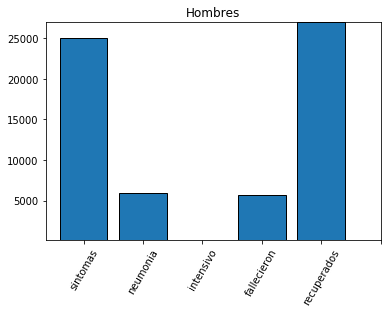

In [19]:
print("TOTAL HOMBRES ") 
print("Total hombres con sintomas: ",sum(hombres_sintomas.values())) 
print("Total hombres con neumonia: ",sum(hombres_neumonia.values())) 
print("Total hombres con cuidado intensivo: ",sum(hombres_intensivo.values())) 
print("Total hombres fallecidos: ",sum(hombres_fallecidos.values())) 
print("Total hombres con recuperados: ",sum(hombres_recuperados.values()))


fechas = ['sintomas', 'neumonia', 'intensivo', 'fallecieron', 'recuperados']
primas = [sum(hombres_sintomas.values()),sum(hombres_neumonia.values()) , sum(hombres_intensivo.values()), sum(hombres_fallecidos.values()), sum(hombres_recuperados.values())]

pp.bar(range(5), primas, edgecolor='black')

pp.xticks(range(6), fechas, rotation=60)
pp.title("Hombres")
pp.ylim(min(primas)-1, max(primas)+1)
pp.show()

TOTAL MUJERES 
Total mujeres con sintomas:  21042
Total mujeres con neumonia:  5501
Total mujeres con cuidado intensivo:  158
Total mujeres fallecidos:  5164
Total mujeres con recuperados:  24618


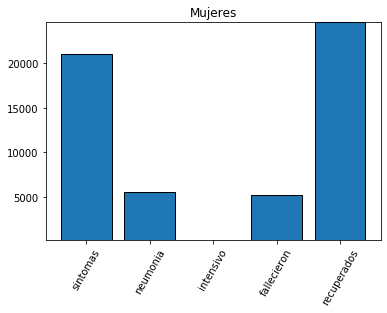

In [20]:
print("TOTAL MUJERES ") 
print("Total mujeres con sintomas: ",sum(mujeres_sintomas.values())) 
print("Total mujeres con neumonia: ",sum(mujeres_neumonia.values())) 
print("Total mujeres con cuidado intensivo: ",sum(mujeres_intensivo.values())) 
print("Total mujeres fallecidos: ",sum(mujeres_fallecidos.values())) 
print("Total mujeres con recuperados: ",sum(mujeres_recuperados.values()))


fechas = ['sintomas', 'neumonia', 'intensivo', 'fallecieron', 'recuperados']
primas = [sum(mujeres_sintomas.values()),sum(mujeres_neumonia.values()) , sum(mujeres_intensivo.values()), sum(mujeres_fallecidos.values()), sum(mujeres_recuperados.values())]

pp.bar(range(5), primas, edgecolor='black')

pp.xticks(range(5), fechas, rotation=60)
pp.title("Mujeres")
pp.ylim(min(primas)-1, max(primas)+1)
pp.show()

In [30]:
from tabulate import tabulate
pacientes_resultado=[
['NIÑOS',sum(ninos.values()),sum(ninos_sintomas.values()),sum(ninos_neumonia.values()),sum(ninos_intensivo.values()),sum(ninos__fallecidos.values()),sum(ninos_recuperados.values())],
['ADULTOS',sum(adultos.values()),sum(adultos_sintomas.values()),sum(adultos_neumonia.values()),sum(adultos_intensivo.values()),sum(adultos__fallecidos.values()),sum(adultos_recuperados.values())]
,['ANCIANOS',sum(tedad.values()),sum(testado_sintomas.values()),sum(testado_neumonia.values()),sum(testado_intensivo.values()),sum(testado__fallecidos.values()),sum(testado_recuperados.values())]
]
print(tabulate(pacientes_resultado,headers=['EDAD','TOTAL','SINTOMAS','NEUMONIA','INTENSIVOS','FALLECIERON','RECUPERADOS']))

EDAD        TOTAL    SINTOMAS    NEUMONIA    INTENSIVOS    FALLECIERON    RECUPERADOS
--------  -------  ----------  ----------  ------------  -------------  -------------
NIÑOS       17618         931         260            11            242          17366
ADULTOS     40815       40815       10607           314           9976          30437
ANCIANOS     4362        4362         614            14            584           3760
